In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.interpolate import interp1d
from scipy.signal import find_peaks
import time
import statsmodels.api as sm

AttributeError: module 'pandas' has no attribute 'Panel'

In [2]:
# get all those functions

# Create function that will take in a dataframe and calculate the running slope

def getminlog(minkey, data = None, return_full = False, return_cool = False, susplot = True):
    '''Output the dataframe from file via minkey'''
    if data is None:
        filename = 'Bestiary_MinLogs/Bestiary_' + str(minkey) + '.txt' 
        mindat = pd.read_csv(filename, delim_whitespace = True)
    else:
        mindat = data

        
    # take out first row if all zeros
    if mindat['temp'][0] == 0:
        mindat.drop(labels = [0], inplace = True)
        mindat.reset_index(drop = True, inplace = True)
    
    # correct susceptibility with furnace constant
    MinKey = pd.read_excel('Bestiary_MinLogs/Bestiary_MinKey.xlsx').set_index('key')
    fc = MinKey.loc['Kappa_furnace_const', minkey]
    mindat['csusc'] = mindat['susc'] - fc

    # split into heating and cooling
    Tmax = max(mindat['temp'])
    mindat.loc[:,'sec'] = 'cool' 
    iTmax = mindat.index[mindat['temp'] == Tmax][0]
    mindat.loc[0:iTmax, 'sec'] = 'heat'
    
    minheat = mindat[mindat['sec'] == 'heat'].copy()
    mincool = mindat[mindat['sec'] == 'cool'].copy()
    
    if susplot == True:
        plt.figure(figsize = (10,5))
        plt.plot(mindat['temp'], mindat['csusc'], 'b-')
        plt.plot(minheat['temp'], minheat['csusc'], 'r-')
        plt.xlabel('Temperature (C)')
        plt.ylabel('Uncorrected Susceptibility')

    
    if return_full == True:
        return minheat, mindat
    elif return_cool == True:
        return mincool
    else:
        return minheat

def runslope(minheat, cpl= 'cp', sig = 'sig',wind = 21, demean = True):
    
    if wind%2 == 0:
        return 'window must be odd'
    
    # fit lines to the temp vs time
    minheat[cpl] = np.nan
    minheat[sig] = np.nan
    windplt = int(wind/2)
    for j in range(windplt,len(minheat['time'])-windplt-1):
        A = np.vstack([minheat['time'][j-windplt:j+windplt+1], np.ones(wind)]).T
        (m, c), res = np.linalg.lstsq(A, minheat['temp'][j-windplt:j+windplt+1], rcond=None)[0:2]
        B = np.vstack([minheat['temp'][j-windplt:j+windplt+1], np.ones(wind)]).T
        sxx = sum((minheat['time'][j-windplt:j+windplt+1] - np.dot(B,[1/m,c/m]))**2)
        sigma = np.sqrt(res**2/((wind-1)*sxx))
        minheat.loc[j, cpl] = m
        minheat.loc[j, sig] = sigma
    
    # if want to demean
    if demean == True:
        mcp = np.mean(minheat[cpl])
        minheat[cpl] = minheat[cpl]-mcp
        
    # return
    return minheat
    
def getpeaks(minheat, cpl = 'cp', h = 0, d = 5):
    
    # find peaks and troughs
    peaks, _ = find_peaks(minheat[cpl], height= h, distance = d)
    troughs,_ = find_peaks(-minheat[cpl]+1000, height = h, distance = d)
    
    return peaks, troughs

def slopeplot(minheat, peaks = 'None', troughs = 'None', mineral = 'None', specname = 'None', key = 'None', cpl = 'cp', savefig = False, \
             skipend = 15, errbars = True, use_wind = False, sig = 'sig'):
    
    # what kind of error bars
    #sig = 'sig'
    if use_wind == True:
        cpl = 'cp2'
        sig = 'sig2'
    
    # plot
    fig, ax1 = plt.subplots(figsize = (10,5))

    ax1.set_xlim((0,700))

    ax1.plot(minheat['temp'][:-skipend], minheat[cpl][:-skipend], 'k')
    if errbars == True:
        ax1.fill_between(minheat['temp'][:-skipend], \
                         minheat[cpl][:-skipend] + minheat[sig][:-skipend], \
                         minheat[cpl][:-skipend] - minheat[sig][:-skipend], \
                        color = 'grey', alpha = .3)
    if peaks != 'None':
        for peak in list(minheat['temp'][peaks]):
            ax1.axvline(peak, color = 'g', linestyle = '--')
    if troughs != 'None':
        for trough in list(minheat['temp'][troughs]):
            ax1.axvline(trough, color = 'b', linestyle = '--')

    ax2 = ax1.twinx()

    ax2.plot(minheat['temp'][:-skipend], minheat['csusc'][:-skipend], 'r')
    ax2.set_ylabel('Uncorrected Susceptibility', color = 'r')
    ax1.set_xlabel('Temperature (C)')
    ax1.set_ylabel('Slope (C/s)', color = 'k')
    
    if mineral != 'None' and specname != 'None' and key != 'None':
        plttitle = mineral +  ' ' + specname + ' (key = ' + str(key) + ')'
        plt.title(plttitle)
    
    if savefig == True:
        filename = 'SlopeFitGraphs\\' + mineral + '_' + str(key) 
        plt.savefig(filename, format = 'png')
        
def choosepeaks(minheat, peaks, troughs):

    cpeaks = list()
    ctroughs = list()

    print('Peaks')
    for peak in peaks:
        t = minheat['temp'][peak]
        x = input(t)
        if x == 'y':
            cpeaks.append(peak)
        elif x == 'n':
            pass
        else:
            return 'error -- only y or n'
    
    print('\nTroughs')
    for trough in troughs:
        t = minheat['temp'][trough]
        x = input(t)
        if x == 'y':
            ctroughs.append(trough)
        elif x == 'n':
            pass
        else:
            return 'error -- only y or n'
    
    return cpeaks, ctroughs

def splitrounds(data):
    data['round'] = np.nan
    t0 = 0
    r = 1
    goingdown = False
    for i in range(0,len(data['time'])):
        t1 = data.loc[i, 'temp']

        # next round?
        if goingdown == True and t1>t0:
            r = r+1

        # put in round
        data.loc[i,'round'] = r


        # determine current direction
        if t1>= t0:
            goingdown = False
        elif t1<t0:
            goingdown = True


        t0 = t1
        
    return data['round']
#def compare_slope_err(time, temp):
#    wind = len(time)
#    A = np.vstack(time, np.ones(wind)]).T
#    weight = np.ones(wind)
#    weight[2:7] = 5
#    (m, c), res = np.linalg.lstsq(A, temp, rcond=None)[0:2]
#    (m2, c2), res2 = np.linalg.lstsq((A.T*weights).T, np.multiply(temp, weight), rcond=None)[0:2]


def compare_slope_err(time, temp):
    time = time.tolist()
    temp = temp.tolist()
    wind = len(time)
    A = np.vstack([time, np.ones(wind)]).T
    
    # weight fxn
    mid = int(wind/2)
    b = time[mid]
    c = 20
    weight = np.ones(wind)
    for i in range(0,wind):
        weight[i] = np.exp(-((time[i]-b)**2)/(2*c**2)) # gaussian window
    weight = weight/(sum(weight)/wind)
    
    # calc slope and residuals
    (m, c), res = np.linalg.lstsq(A, temp, rcond=None)[0:2]
    (m2, c2), res2 = np.linalg.lstsq((A.T*weight).T, np.multiply(temp, weight), rcond=None)[0:2]
    B = np.vstack([temp, np.ones(wind)]).T
    sxx = sum((time - np.dot(B,[1/m,c/m]))**2)
    sigma = np.sqrt(res**2/((wind-1)*sxx))
    sxx2 = sum((np.multiply(time,weight) - np.dot((B.T*weight).T,[1/m2,c2/m2]))**2)
    sigma2 = np.sqrt(res2**2/((wind-1)*sxx))
    return m, sigma, m2, sigma2

def runslope_comp(minheat, cpl= 'cp', wind = 21, demean = True):
    
    if wind%2 == 0:
        return 'window must be odd'
    
    # fit lines to the temp vs time
    minheat[cpl] = np.nan
    minheat['sig'] = np.nan
    minheat['cp2'] = np.nan
    minheat['sig2'] = np.nan
    windplt = int(wind/2)
    for j in range(windplt,len(minheat['time'])-windplt-1):
        time = minheat['time'][j-windplt:j+windplt+1]
        temp = minheat['temp'][j-windplt:j+windplt+1]
        m,sig,m2,sig2 = compare_slope_err(time, temp)
        minheat.loc[j, cpl] = m
        minheat.loc[j, 'sig'] = sig
        minheat.loc[j, 'cp2'] = m2
        minheat.loc[j, 'sig2'] = 2*sig2
    
    # if want to demean
    if demean == True:
        mcp = np.mean(minheat[cpl])
        minheat[cpl] = minheat[cpl]-mcp
        
    # return
    return minheat

In [3]:
# font stuff
csfont = {'fontname':'Microsoft Tai Le', 'fontsize':20} #previously 18

1. Grab the files
2. Find average heating rate

In [4]:
# Lets see everything I have + the key
MinKey = pd.read_excel('Bestiary_MinLogs/Bestiary_MinKey.xlsx').set_index('key')
MinKey.loc[['Specimen_ID', 'mineral', 'Tmax[C]', 'Warnings', 'key_1', 'atmosphere_code', 'Specimen_mass[g]']].transpose()

key,Specimen_ID,mineral,Tmax[C],Warnings,key_1,atmosphere_code,Specimen_mass[g]
3413,ferroxyhyte_Princeton-1985-M1-2,ferroxyhyte,702,NaN,NaN,0,0.0424
3410,magnetite_Wright 112982-k(T)-02,magnetite,700,NaN,NaN,1,0.0554
3414,ferroxyhyte_Princeton-1985-M2-1,ferroxyhyte,0,NaN,NaN,0,0.0576
3412,magnetite_Wright 3006-k(T)-02,magnetite,650,NaN,NaN,1,0.0535
3788,Hell Creek MK2-3ext2a,NaN,653.5,NaN,NaN,0,0.015
800,Pyrite Alfa Aesar_Kappa,pyrite,712.8,NaN,37407,0,0.1209
829,Pyrite Alfa Aesar_Kappa-2,pyrite,106.5,NaN,37428,0,0.05705
830,Pyrite Alfa Aesar_Kappa-2,pyrite,211.6,NaN,37428,0,0.05705
831,Pyrite Alfa Aesar_Kappa-2,pyrite,306.9,NaN,37428,0,0.05705
832,Pyrite Alfa Aesar_Kappa-2,pyrite,404.3,NaN,37428,0,0.05705


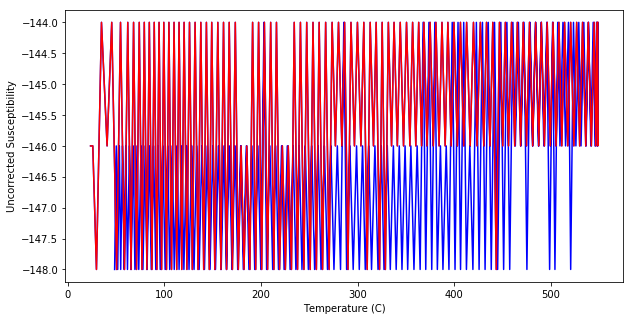

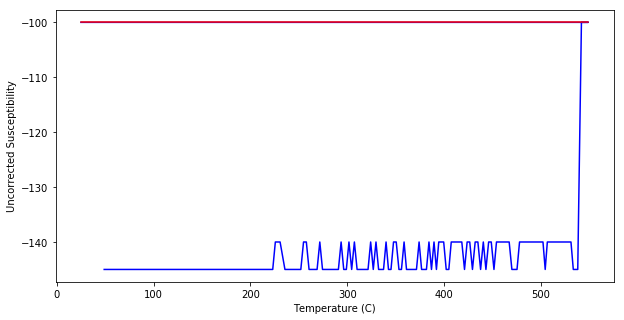

In [5]:
# blanks
TubeA_01 = getminlog(5704, return_full = False, susplot = True)
TubeA_10 = getminlog(5707, return_full = False, susplot = True)
TubeA_11 = getminlog(5715, return_full = False, susplot = False)
TubeA_12 = getminlog(5725, return_full = False, susplot = False)

TubeB_20 = getminlog(5706, return_full = False, susplot = False)
TubeB_22 = getminlog(5718, return_full = False, susplot = False)
TubeB_23 = getminlog(5722, return_full = False, susplot = False)
TubeB_24 = getminlog(5727, return_full = False, susplot = False)


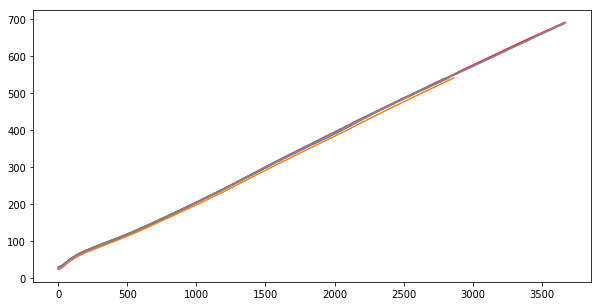

In [6]:
plt.figure(figsize = (10, 5))

plt.plot(TubeA_01['time'][:-5], TubeA_01['temp'][:-5])
plt.plot(TubeA_10['time'][:-5], TubeA_10['temp'][:-5])
plt.plot(TubeA_11['time'][:-5], TubeA_11['temp'][:-5])
plt.plot(TubeA_12['time'][:-5], TubeA_12['temp'][:-5])

plt.plot(TubeB_20['time'][:-5], TubeB_20['temp'][:-5])
plt.plot(TubeB_22['time'][:-5], TubeB_22['temp'][:-5])
plt.plot(TubeB_23['time'][:-5], TubeB_23['temp'][:-5])
plt.plot(TubeB_24['time'][:-5], TubeB_24['temp'][:-5])

In [7]:
# time vector
t = np.arange(0,3700,15)

# linear interpolate each and write in terms of t

int_A01 = interp1d(TubeA_01['time'][:-5], TubeA_01['temp'][:-5], kind = 'linear', bounds_error = False)
b_A01 = int_A01(t)

int_A10 = interp1d(TubeA_10['time'][:-5], TubeA_10['temp'][:-5], kind = 'linear', bounds_error = False)
b_A10 = int_A10(t)

int_A11 = interp1d(TubeA_11['time'][:-5], TubeA_11['temp'][:-5], kind = 'linear', bounds_error = False)
b_A11 = int_A11(t)

int_A12 = interp1d(TubeA_12['time'][:-5], TubeA_12['temp'][:-5], kind = 'linear', bounds_error = False)
b_A12 = int_A12(t)

int_B20 = interp1d(TubeB_20['time'][:-5], TubeB_20['temp'][:-5], kind = 'linear', bounds_error = False)
b_B20 = int_B20(t)

int_B22 = interp1d(TubeB_22['time'][:-5], TubeB_22['temp'][:-5], kind = 'linear', bounds_error = False)
b_B22 = int_B22(t)

int_B23 = interp1d(TubeB_23['time'][:-5], TubeB_23['temp'][:-5], kind = 'linear', bounds_error = False)
b_B23 = int_B23(t)

int_B24 = interp1d(TubeB_24['time'][:-5], TubeB_24['temp'][:-5], kind = 'linear', bounds_error = False)
b_B24 = int_B24(t)

In [8]:
blank_df = pd.DataFrame({'time':t, 'bA01': b_A01, 'bA10': b_A10, 'bA11': b_A11, 'bA12': b_A12, 'bB20': b_B20, 'bB22': b_B22, 'bB23': b_B23, 'bB24': b_B24})

In [9]:
blank_df.head()

,time,bA01,bA10,bA11,bA12,bB20,bB22,bB23,bB24
0,0,23.700000,25.000000,29.000000,29.600000,24.900000,27.900000,25.200000,28.600000
1,15,26.000000,26.900000,31.100000,32.183333,27.500000,30.988235,27.400000,30.975000
2,30,29.800000,30.642857,35.057143,35.311765,31.614286,34.866667,31.323077,34.050000
3,45,35.322222,34.800000,40.194118,39.185714,36.514286,39.435294,36.164286,38.366667
4,60,40.155556,39.242857,43.900000,43.442857,42.133333,44.144444,40.928571,43.366667


In [22]:
# get average temperature and sd

# blank A
blank_df['bA'] = blank_df[['bA01', 'bA10', 'bA11', 'bA12']].mean(axis = 1)
blank_df['bA_sd'] = blank_df[['bA01', 'bA10', 'bA11', 'bA12']].std(axis = 1)

# blank B
blank_df['bB'] = blank_df[['bB20', 'bB22', 'bB23', 'bB24']].mean(axis = 1)
blank_df['bB_sd'] = blank_df[['bB20', 'bB22', 'bB23', 'bB24']].std(axis = 1)

# all except A10
blank_df['blanks'] = blank_df[['bA01', 'bA11', 'bA12', 'bB20', 'bB22', 'bB23', 'bB24']].mean(axis = 1)
blank_df['blanks_sd'] = blank_df[['bA01', 'bA11', 'bA12', 'bB20', 'bB22', 'bB23', 'bB24']].std(axis = 1)

In [23]:
blank_df.head()

,time,bA01,bA10,bA11,bA12,bB20,bB22,bB23,bB24,bA,bA_sd,bB,bB_sd,blanks,blanks_sd,blanks_fit,r_max,r_min,ranger
0,0,23.700000,25.000000,29.000000,29.600000,24.900000,27.900000,25.200000,28.600000,26.825000,2.917048,26.650000,1.873499,26.985714,2.333401,27.640065,29.600000,23.700000,5.900000
1,15,26.000000,26.900000,31.100000,32.183333,27.500000,30.988235,27.400000,30.975000,29.045833,3.052060,29.215809,2.039396,29.449510,2.408073,30.369416,32.183333,26.000000,6.183333
2,30,29.800000,30.642857,35.057143,35.311765,31.614286,34.866667,31.323077,34.050000,32.702941,2.887862,32.963507,1.761996,33.146134,2.197947,33.098767,35.311765,29.800000,5.511765
3,45,35.322222,34.800000,40.194118,39.185714,36.514286,39.435294,36.164286,38.366667,37.375514,2.712356,37.620133,1.548603,37.883227,1.873803,35.828117,40.194118,35.322222,4.871895
4,60,40.155556,39.242857,43.900000,43.442857,42.133333,44.144444,40.928571,43.366667,41.685317,2.330919,42.643254,1.411507,42.581633,1.546927,38.557468,44.144444,40.155556,3.988889


Text(0.5, 1.0, 'Average Blank Temp vs Time')

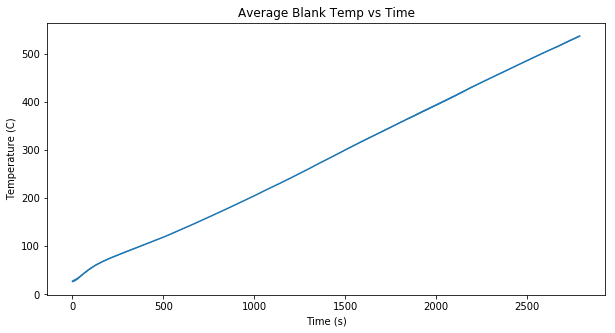

In [24]:
# plot average blank

plt.figure(figsize = (10,5))
plt.plot(blank_df['time'], blank_df['blanks'])
plt.fill_between(blank_df['time'], blank_df['blanks']-blank_df['blanks_sd'], blank_df['blanks']+blank_df['blanks_sd'])
plt.xlabel('Time (s)')
plt.ylabel('Temperature (C)')
plt.title('Average Blank Temp vs Time')

In [25]:
# fit a line to the average blank
blank_df.dropna(inplace = True)
blanks_fit = np.polyfit(blank_df['time'], blank_df['blanks'], 1)
blank_df['blanks_fit'] = blanks_fit[0]*blank_df['time'] + blanks_fit[1]

In [26]:
blank_df.head()

,time,bA01,bA10,bA11,bA12,bB20,bB22,bB23,bB24,bA,bA_sd,bB,bB_sd,blanks,blanks_sd,blanks_fit,r_max,r_min,ranger
0,0,23.700000,25.000000,29.000000,29.600000,24.900000,27.900000,25.200000,28.600000,26.825000,2.917048,26.650000,1.873499,26.985714,2.333401,28.146528,29.600000,23.700000,5.900000
1,15,26.000000,26.900000,31.100000,32.183333,27.500000,30.988235,27.400000,30.975000,29.045833,3.052060,29.215809,2.039396,29.449510,2.408073,30.880089,32.183333,26.000000,6.183333
2,30,29.800000,30.642857,35.057143,35.311765,31.614286,34.866667,31.323077,34.050000,32.702941,2.887862,32.963507,1.761996,33.146134,2.197947,33.613649,35.311765,29.800000,5.511765
3,45,35.322222,34.800000,40.194118,39.185714,36.514286,39.435294,36.164286,38.366667,37.375514,2.712356,37.620133,1.548603,37.883227,1.873803,36.347209,40.194118,35.322222,4.871895
4,60,40.155556,39.242857,43.900000,43.442857,42.133333,44.144444,40.928571,43.366667,41.685317,2.330919,42.643254,1.411507,42.581633,1.546927,39.080770,44.144444,40.155556,3.988889


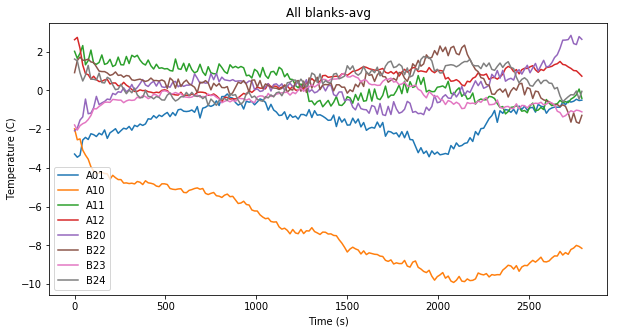

In [27]:
plt.figure(figsize = (10, 5))

plt.plot(blank_df['time'], blank_df['bA01']-blank_df['blanks'], label = 'A01')
plt.plot(blank_df['time'], blank_df['bA10']-blank_df['blanks'], label = 'A10')
plt.plot(blank_df['time'], blank_df['bA11']-blank_df['blanks'], label = 'A11')
plt.plot(blank_df['time'], blank_df['bA12']-blank_df['blanks'], label = 'A12')

plt.plot(blank_df['time'], blank_df['bB20']-blank_df['blanks'], label = 'B20')
plt.plot(blank_df['time'], blank_df['bB22']-blank_df['blanks'], label = 'B22')
plt.plot(blank_df['time'], blank_df['bB23']-blank_df['blanks'], label = 'B23')
plt.plot(blank_df['time'], blank_df['bB24']-blank_df['blanks'], label = 'B24')

plt.xlabel('Time (s)')
plt.ylabel('Temperature (C)')
plt.title('All blanks-avg')
plt.legend()

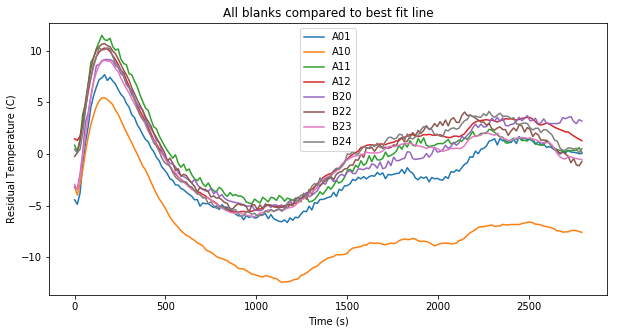

In [28]:
plt.figure(figsize = (10, 5))

plt.plot(blank_df['time'], blank_df['bA01']-blank_df['blanks_fit'], label = 'A01')
plt.plot(blank_df['time'], blank_df['bA10']-blank_df['blanks_fit'], label = 'A10')
plt.plot(blank_df['time'], blank_df['bA11']-blank_df['blanks_fit'], label = 'A11')
plt.plot(blank_df['time'], blank_df['bA12']-blank_df['blanks_fit'], label = 'A12')

plt.plot(blank_df['time'], blank_df['bB20']-blank_df['blanks_fit'], label = 'B20')
plt.plot(blank_df['time'], blank_df['bB22']-blank_df['blanks_fit'], label = 'B22')
plt.plot(blank_df['time'], blank_df['bB23']-blank_df['blanks_fit'], label = 'B23')
plt.plot(blank_df['time'], blank_df['bB24']-blank_df['blanks_fit'], label = 'B24')

plt.xlabel('Time (s)')
plt.ylabel('Residual Temperature (C)')
plt.title('All blanks compared to best fit line')
plt.legend()

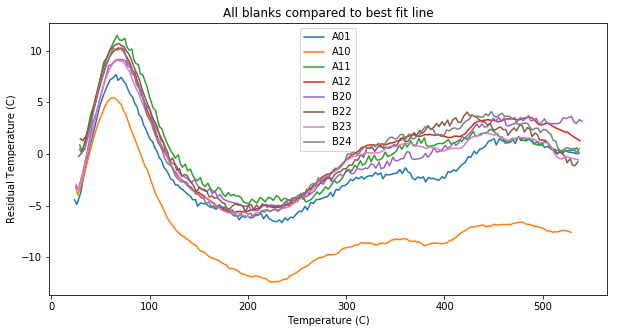

In [29]:
plt.figure(figsize = (10, 5))

plt.plot(blank_df['bA01'], blank_df['bA01']-blank_df['blanks_fit'], label = 'A01')
plt.plot(blank_df['bA10'], blank_df['bA10']-blank_df['blanks_fit'], label = 'A10')
plt.plot(blank_df['bA11'], blank_df['bA11']-blank_df['blanks_fit'], label = 'A11')
plt.plot(blank_df['bA12'], blank_df['bA12']-blank_df['blanks_fit'], label = 'A12')

plt.plot(blank_df['bB20'], blank_df['bB20']-blank_df['blanks_fit'], label = 'B20')
plt.plot(blank_df['bB22'], blank_df['bB22']-blank_df['blanks_fit'], label = 'B22')
plt.plot(blank_df['bB23'], blank_df['bB23']-blank_df['blanks_fit'], label = 'B23')
plt.plot(blank_df['bB24'], blank_df['bB24']-blank_df['blanks_fit'], label = 'B24')

plt.xlabel('Temperature (C)')
plt.ylabel('Residual Temperature (C)')
plt.title('All blanks compared to best fit line')
plt.legend()

In [30]:
blank_df['r_max'] = blank_df[['bA01', 'bA11', 'bA12', 'bB20', 'bB22', 'bB23', 'bB24']].max(axis = 1)
blank_df['r_min'] = blank_df[['bA01', 'bA11', 'bA12', 'bB20', 'bB22', 'bB23', 'bB24']].min(axis = 1)
blank_df['ranger'] = blank_df['r_max'] - blank_df['r_min']

In [31]:
blank_df.head()

,time,bA01,bA10,bA11,bA12,bB20,bB22,bB23,bB24,bA,bA_sd,bB,bB_sd,blanks,blanks_sd,blanks_fit,r_max,r_min,ranger
0,0,23.700000,25.000000,29.000000,29.600000,24.900000,27.900000,25.200000,28.600000,26.825000,2.917048,26.650000,1.873499,26.985714,2.333401,28.146528,29.600000,23.700000,5.900000
1,15,26.000000,26.900000,31.100000,32.183333,27.500000,30.988235,27.400000,30.975000,29.045833,3.052060,29.215809,2.039396,29.449510,2.408073,30.880089,32.183333,26.000000,6.183333
2,30,29.800000,30.642857,35.057143,35.311765,31.614286,34.866667,31.323077,34.050000,32.702941,2.887862,32.963507,1.761996,33.146134,2.197947,33.613649,35.311765,29.800000,5.511765
3,45,35.322222,34.800000,40.194118,39.185714,36.514286,39.435294,36.164286,38.366667,37.375514,2.712356,37.620133,1.548603,37.883227,1.873803,36.347209,40.194118,35.322222,4.871895
4,60,40.155556,39.242857,43.900000,43.442857,42.133333,44.144444,40.928571,43.366667,41.685317,2.330919,42.643254,1.411507,42.581633,1.546927,39.080770,44.144444,40.155556,3.988889


Text(0.5, 1.0, 'Range of values at given time excluding bA10')

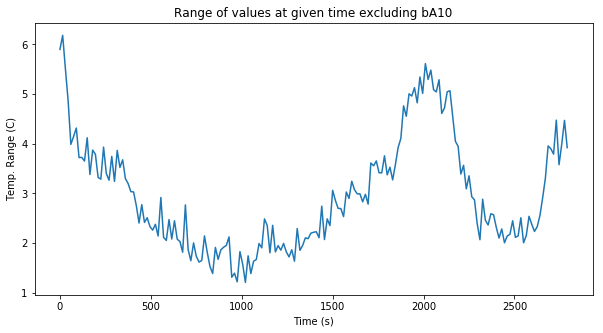

In [32]:
plt.figure(figsize = (10,5))
plt.plot(blank_df['time'], blank_df['ranger'])
plt.xlabel('Time (s)')
plt.ylabel('Temp. Range (C)')
plt.title('Range of values at given time excluding bA10')

Text(0.5, 1.0, 'Range of values at given temperature (based on avg) excluding bA10')

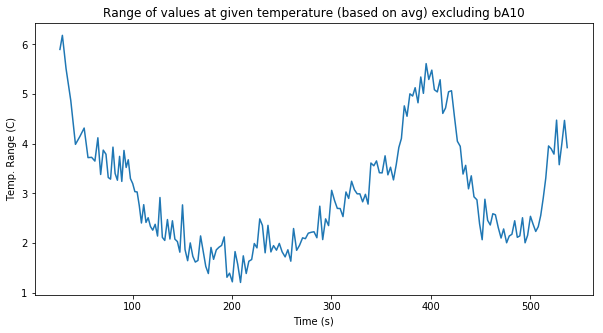

In [33]:
plt.figure(figsize = (10,5))
plt.plot(blank_df['blanks'], blank_df['ranger'])
plt.xlabel('Time (s)')
plt.ylabel('Temp. Range (C)')
plt.title('Range of values at given temperature (based on avg) excluding bA10')

I'm hoping to use this figure to show why subtracting the blanks is necessary. The heating rate is not totally linear, but it is predictable. Honestly, if we just used an average blank, we would likely get very similar results.... oh shoot I should do a time analysis.... ugh

In [34]:
SSRM_24, SSRM24f = getminlog(data = "Bestiary_MinLogs\SSRM2022B_AL91S2.4.txt", return_full = True, susplot = True)

TypeError: getminlog() missing 1 required positional argument: 'minkey'

In [35]:
SSRM24f = pd.read_csv("Bestiary_MinLogs\SSRM2022B_AL91S2.4.txt", delim_whitespace = True)

## Comparing other minerals

Now need to compare this blank to other minerals

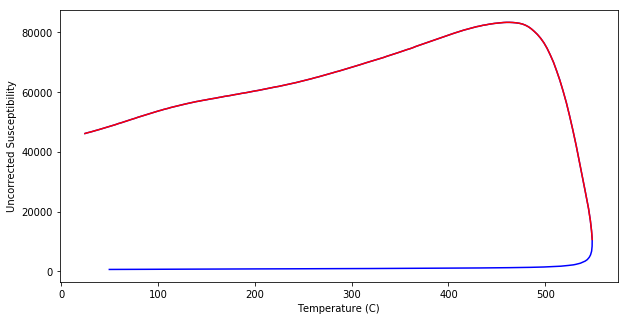

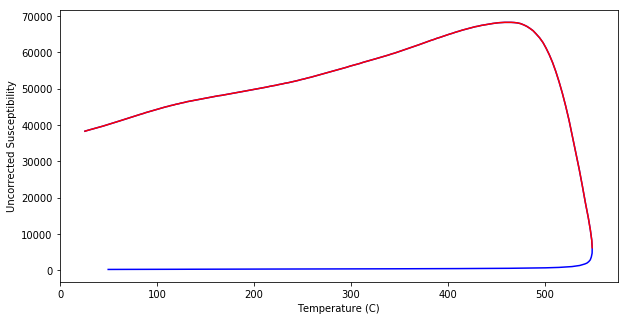

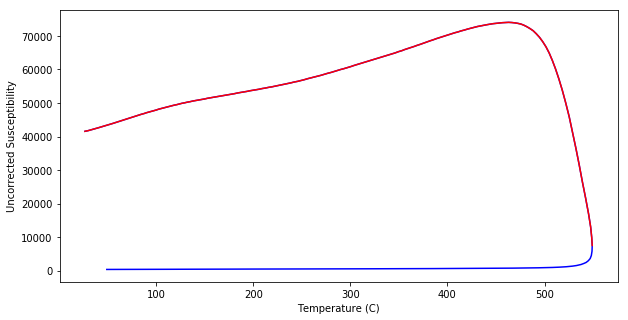

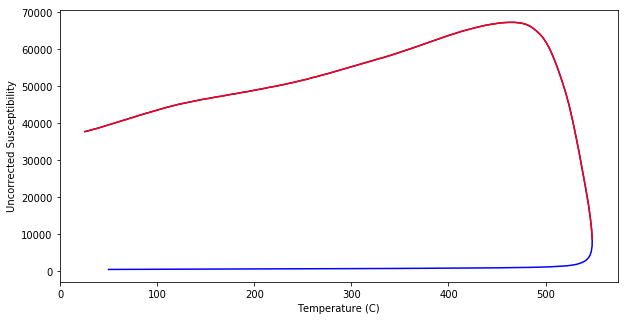

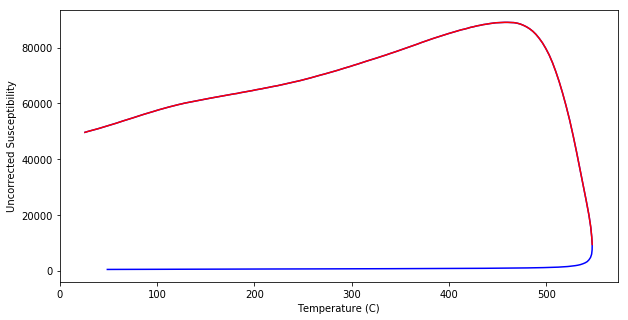

In [69]:
# maghemite
magh_10, magh_10f = getminlog(5705, return_full = True, susplot = True)
magh_11 = getminlog(5709, return_full = False, susplot = True)
magh_12 = getminlog(5719, return_full = False, susplot = True)

magh_20 = getminlog(5708, return_full = False, susplot = True)
magh_21 = getminlog(5714, return_full = False, susplot = True)


Text(0, 0.5, 'Susceptibility [m3/kg]')

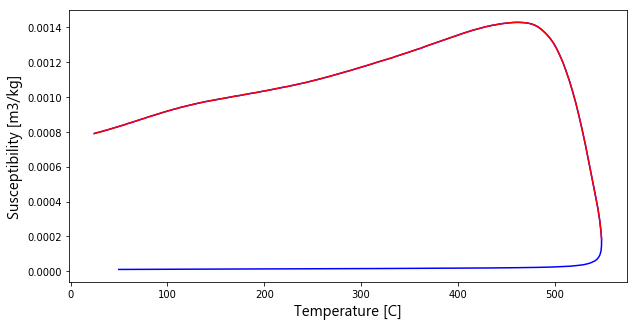

In [70]:
csfont = {'fontname':'Microsoft Tai Le', 'fontsize':15}
plt.figure(figsize = (10,5))


plt.plot(magh_10f['temp'], magh_10f['csusc']*(1e-5)/(MinKey[5705].loc['Specimen_mass[g]']*1000), 'b-')
plt.plot(magh_10['temp'], magh_10['csusc']*(1e-5)/(MinKey[5705].loc['Specimen_mass[g]']*1000), 'r-')

plt.xlabel('Temperature [C]', **csfont)
plt.ylabel('Susceptibility [m3/kg]', **csfont)

In [71]:
int_m10t = interp1d(magh_10['time'][:-5],magh_10['temp'][:-5], kind = 'linear', bounds_error = False)
temp_m10 = int_m10t(t)

int_m11t = interp1d(magh_11['time'][:-5],magh_11['temp'][:-5], kind = 'linear', bounds_error = False)
temp_m11 = int_m11t(t)

int_m12t = interp1d(magh_12['time'][:-5],magh_12['temp'][:-5], kind = 'linear', bounds_error = False)
temp_m12 = int_m12t(t)

int_m20t = interp1d(magh_20['time'][:-5],magh_20['temp'][:-5], kind = 'linear', bounds_error = False)
temp_m20 = int_m20t(t)

int_m21t = interp1d(magh_21['time'][:-5],magh_21['temp'][:-5], kind = 'linear', bounds_error = False)
temp_m21 = int_m21t(t)

In [72]:
magh = pd.DataFrame({'time':t, 'm10':temp_m10, 'm11':temp_m11, 'm12':temp_m12, 'm20':temp_m20, 'm21':temp_m21})

In [73]:
blank_df.head()

,time,bA01,bA10,bA11,bA12,bB20,bB22,bB23,bB24,bA,bA_sd,bB,bB_sd,blanks,blanks_sd,blanks_fit,r_max,r_min,ranger
0,0,23.700000,25.000000,29.000000,29.600000,24.900000,27.900000,25.200000,28.600000,26.825000,2.917048,26.650000,1.873499,26.737500,2.271524,27.640065,29.600000,23.700000,5.900000
1,15,26.000000,26.900000,31.100000,32.183333,27.500000,30.988235,27.400000,30.975000,29.045833,3.052060,29.215809,2.039396,29.130821,2.404769,30.369416,32.183333,26.000000,6.183333
2,30,29.800000,30.642857,35.057143,35.311765,31.614286,34.866667,31.323077,34.050000,32.702941,2.887862,32.963507,1.761996,32.833224,2.219038,33.098767,35.311765,29.800000,5.511765
3,45,35.322222,34.800000,40.194118,39.185714,36.514286,39.435294,36.164286,38.366667,37.375514,2.712356,37.620133,1.548603,37.497823,2.048861,35.828117,40.194118,35.322222,4.871895
4,60,40.155556,39.242857,43.900000,43.442857,42.133333,44.144444,40.928571,43.366667,41.685317,2.330919,42.643254,1.411507,42.164286,1.855951,38.557468,44.144444,40.155556,3.988889


In [74]:
magh = magh.merge(blank_df, on = 'time')

In [75]:
magh.head()

,time,m10,m11,m12,m20,m21,bA01,bA10,bA11,bA12,...,bA,bA_sd,bB,bB_sd,blanks,blanks_sd,blanks_fit,r_max,r_min,ranger
0,0,24.400000,25.600000,26.700000,25.500000,26.000000,23.700000,25.000000,29.000000,29.600000,...,26.825000,2.917048,26.650000,1.873499,26.737500,2.271524,27.640065,29.600000,23.700000,5.900000
1,15,26.400000,28.335294,30.000000,28.166667,28.750000,26.000000,26.900000,31.100000,32.183333,...,29.045833,3.052060,29.215809,2.039396,29.130821,2.404769,30.369416,32.183333,26.000000,6.183333
2,30,30.100000,32.370588,34.166667,31.833333,32.566667,29.800000,30.642857,35.057143,35.311765,...,32.702941,2.887862,32.963507,1.761996,32.833224,2.219038,33.098767,35.311765,29.800000,5.511765
3,45,33.982353,36.800000,38.600000,36.152941,36.952941,35.322222,34.800000,40.194118,39.185714,...,37.375514,2.712356,37.620133,1.548603,37.497823,2.048861,35.828117,40.194118,35.322222,4.871895
4,60,38.660000,41.394118,43.050000,40.544444,41.461111,40.155556,39.242857,43.900000,43.442857,...,41.685317,2.330919,42.643254,1.411507,42.164286,1.855951,38.557468,44.144444,40.155556,3.988889


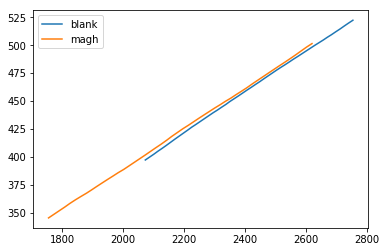

In [76]:
y = 50
plt.plot(TubeA_10['time'][100+y:150+y], TubeA_10['temp'][100+y:150+y], label = 'blank')
plt.plot(magh_11['time'][50+y:100+y], magh_11['temp'][50+y:100+y], label = 'magh')
plt.legend()

Text(0.5, 1.0, 'Comparison of magh_A01 heating to closest blank')

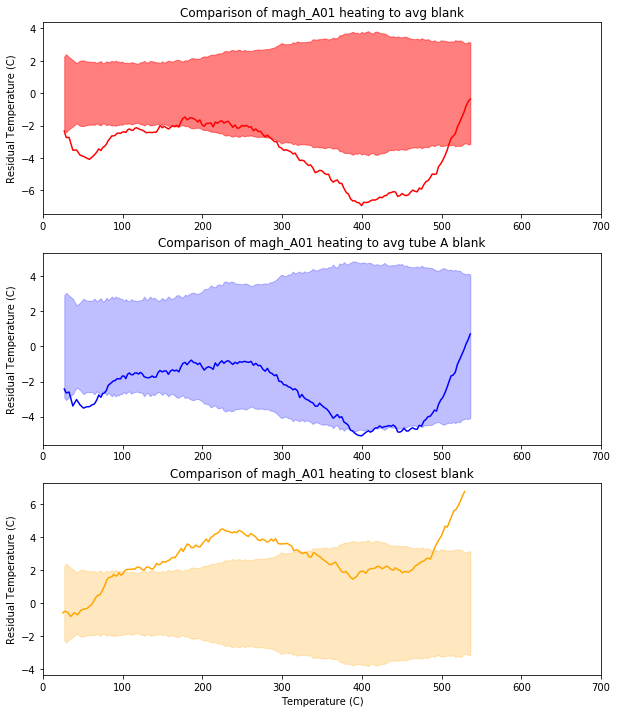

In [77]:
# magh_A10

plt.figure(figsize = (10,12))


plt.subplot(311)
plt.plot(magh['blanks'], magh['m10']-magh['blanks'], 'r', label = 'Average Blank')
plt.fill_between(blank_df['blanks'], -blank_df['blanks_sd'], blank_df['blanks_sd'], color = 'red', alpha = .5)
plt.xlim(0,700)

plt.ylabel('Residual Temperature (C)')
plt.title('Comparison of magh_A01 heating to avg blank')

plt.subplot(312)
plt.plot(magh['blanks'], magh['m10']-magh['bA'], 'b', label = 'Average Tube A')
plt.fill_between(blank_df['blanks'], -blank_df['bA_sd'], blank_df['bA_sd'], color = 'blue', alpha = .25)
plt.xlim(0,700)

plt.ylabel('Residual Temperature (C)')
plt.title('Comparison of magh_A01 heating to avg tube A blank')

plt.subplot(313)
plt.plot(magh['bA10'], magh['m10'] - magh['bA10'], color = 'orange')
plt.fill_between(blank_df['blanks'], -blank_df['blanks_sd'], blank_df['blanks_sd'], color = 'orange', alpha = .25)
plt.xlim(0,700)

plt.xlabel('Temperature (C)')
plt.ylabel('Residual Temperature (C)')
plt.title('Comparison of magh_A01 heating to closest blank')

Text(0.5, 1.0, 'Comparison of magh_A11 heating to closest blank')

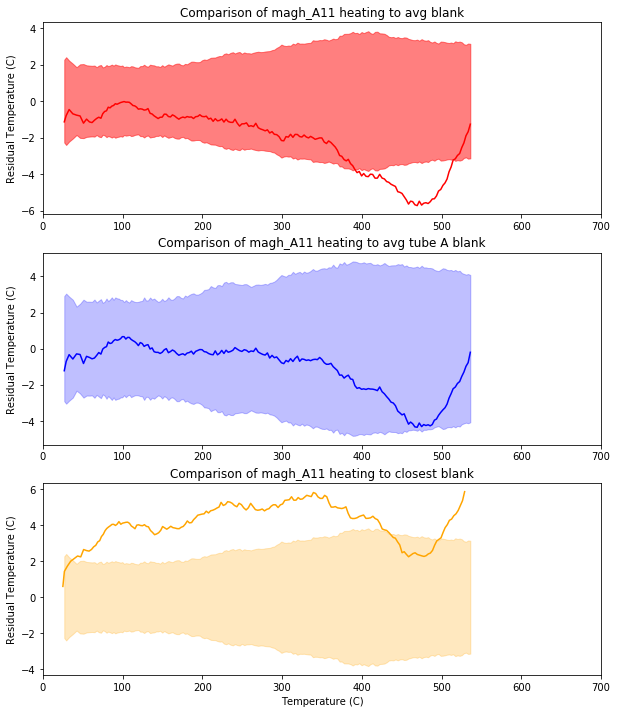

In [78]:
# magh_A11

plt.figure(figsize = (10,12))


plt.subplot(311)
plt.plot(magh['blanks'], magh['m11']-magh['blanks'], 'r', label = 'Average Blank')
plt.fill_between(blank_df['blanks'], -blank_df['blanks_sd'], blank_df['blanks_sd'], color = 'red', alpha = .5)
plt.xlim(0,700)

plt.ylabel('Residual Temperature (C)')
plt.title('Comparison of magh_A11 heating to avg blank')

plt.subplot(312)
plt.plot(magh['blanks'], magh['m11']-magh['bA'], 'b', label = 'Average Tube A')
plt.fill_between(blank_df['blanks'], -blank_df['bA_sd'], blank_df['bA_sd'], color = 'blue', alpha = .25)
plt.xlim(0,700)

plt.ylabel('Residual Temperature (C)')
plt.title('Comparison of magh_A11 heating to avg tube A blank')

plt.subplot(313)
plt.plot(magh['bA10'], magh['m11'] - magh['bA10'], color = 'orange')
plt.fill_between(blank_df['blanks'], -blank_df['blanks_sd'], blank_df['blanks_sd'], color = 'orange', alpha = .25)
plt.xlim(0,700)

plt.xlabel('Temperature (C)')
plt.ylabel('Residual Temperature (C)')
plt.title('Comparison of magh_A11 heating to closest blank')

Text(0.5, 1.0, 'Comparison of magh_A12 heating to closest blank')

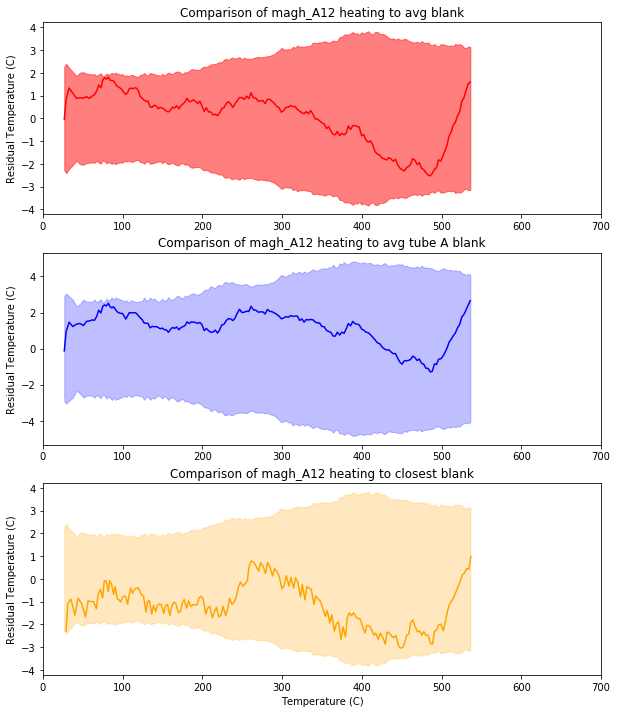

In [79]:






# magh_A12

plt.figure(figsize = (10,12))


plt.subplot(311)
plt.plot(blank_df['blanks'], magh['m12']-blank_df['blanks'], 'r', label = 'Average Blank')
plt.fill_between(blank_df['blanks'], -blank_df['blanks_sd'], blank_df['blanks_sd'], color = 'red', alpha = .5)
plt.xlim(0,700)

plt.ylabel('Residual Temperature (C)')
plt.title('Comparison of magh_A12 heating to avg blank')

plt.subplot(312)
plt.plot(blank_df['blanks'], magh['m12']-blank_df['bA'], 'b', label = 'Average Tube A')
plt.fill_between(blank_df['blanks'], -blank_df['bA_sd'], blank_df['bA_sd'], color = 'blue', alpha = .25)
plt.xlim(0,700)

plt.ylabel('Residual Temperature (C)')
plt.title('Comparison of magh_A12 heating to avg tube A blank')

plt.subplot(313)
plt.plot(blank_df['bA11'], magh['m12'] - blank_df['bA11'], color = 'orange')
plt.fill_between(blank_df['blanks'], -blank_df['blanks_sd'], blank_df['blanks_sd'], color = 'orange', alpha = .25)
plt.xlim(0,700)

plt.xlabel('Temperature (C)')
plt.ylabel('Residual Temperature (C)')
plt.title('Comparison of magh_A12 heating to closest blank')

Text(0.5, 1.0, 'Comparison of magh_A11 heating to closest blank')

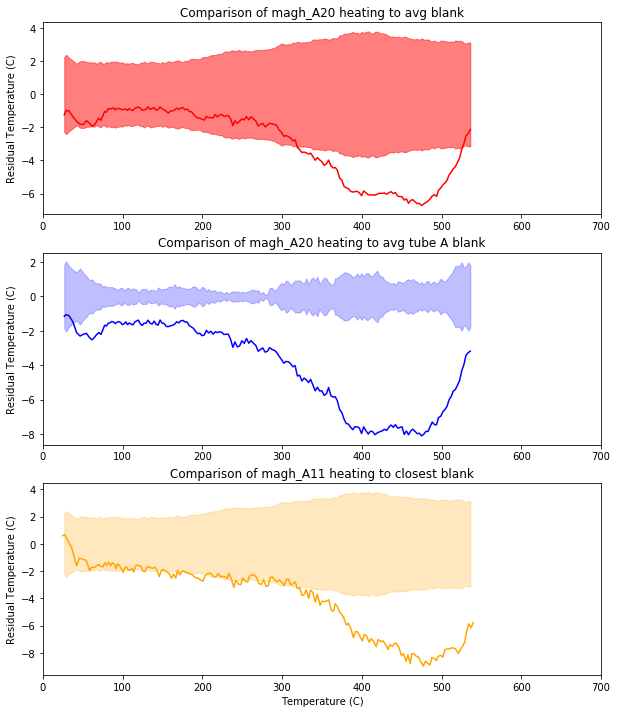

In [80]:
# magh_B20

plt.figure(figsize = (10,12))


plt.subplot(311)
plt.plot(blank_df['blanks'], magh['m20']-blank_df['blanks'], 'r', label = 'Average Blank')
plt.fill_between(blank_df['blanks'], -blank_df['blanks_sd'], blank_df['blanks_sd'], color = 'red', alpha = .5)
plt.xlim(0,700)

plt.ylabel('Residual Temperature (C)')
plt.title('Comparison of magh_A20 heating to avg blank')

plt.subplot(312)
plt.plot(blank_df['blanks'], magh['m20']-blank_df['bB'], 'b', label = 'Average Tube B')
plt.fill_between(blank_df['blanks'], -blank_df['bB_sd'], blank_df['bB_sd'], color = 'blue', alpha = .25)
plt.xlim(0,700)

plt.ylabel('Residual Temperature (C)')
plt.title('Comparison of magh_A20 heating to avg tube A blank')

plt.subplot(313)
plt.plot(blank_df['bB20'], magh['m20'] - blank_df['bB20'], color = 'orange')
plt.fill_between(blank_df['blanks'], -blank_df['blanks_sd'], blank_df['blanks_sd'], color = 'orange', alpha = .25)
plt.xlim(0,700)

plt.xlabel('Temperature (C)')
plt.ylabel('Residual Temperature (C)')
plt.title('Comparison of magh_A11 heating to closest blank')

Text(0.5, 1.0, 'Comparison of magh_A11 heating to closest blank')

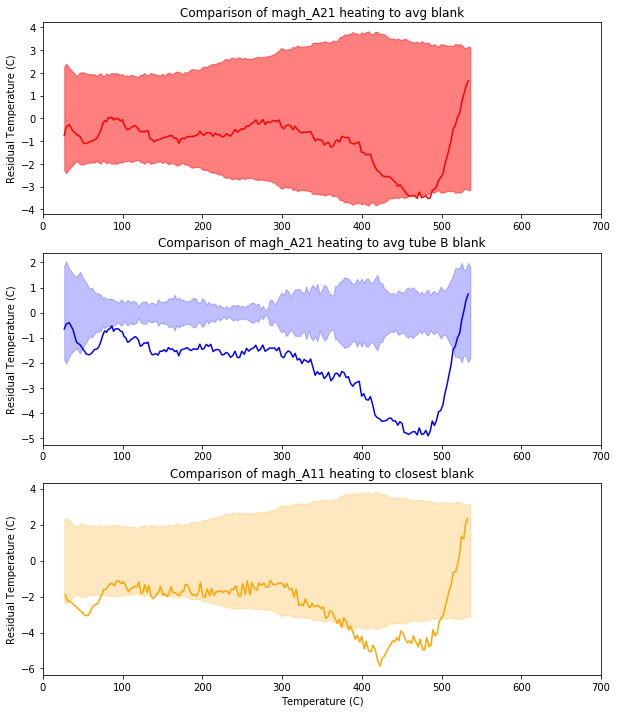

In [81]:
# magh_B21

plt.figure(figsize = (10,12))


plt.subplot(311)
plt.plot(blank_df['blanks'], magh['m21']-blank_df['blanks'], 'r', label = 'Average Blank')
plt.fill_between(blank_df['blanks'], -blank_df['blanks_sd'], blank_df['blanks_sd'], color = 'red', alpha = .5)
plt.xlim(0,700)

plt.ylabel('Residual Temperature (C)')
plt.title('Comparison of magh_A21 heating to avg blank')

plt.subplot(312)
plt.plot(blank_df['blanks'], magh['m21']-blank_df['bB'], 'b', label = 'Average Tube B')
plt.fill_between(blank_df['blanks'], -blank_df['bB_sd'], blank_df['bB_sd'], color = 'blue', alpha = .25)
plt.xlim(0,700)

plt.ylabel('Residual Temperature (C)')
plt.title('Comparison of magh_A21 heating to avg tube B blank')

plt.subplot(313)
plt.plot(blank_df['bB22'], magh['m21'] - blank_df['bB22'], color = 'orange')
plt.fill_between(blank_df['blanks'], -blank_df['blanks_sd'], blank_df['blanks_sd'], color = 'orange', alpha = .25)
plt.xlim(0,700)

plt.xlabel('Temperature (C)')
plt.ylabel('Residual Temperature (C)')
plt.title('Comparison of magh_A11 heating to closest blank')

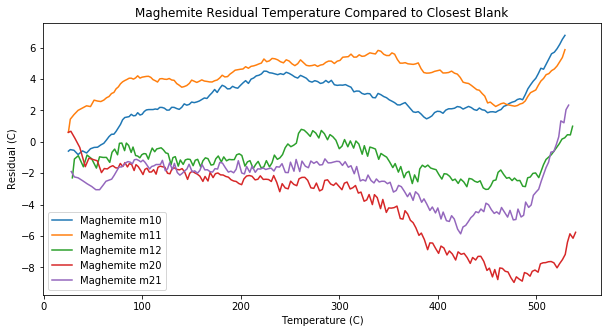

In [82]:
plt.figure(figsize = (10,5))

plt.plot(blank_df['bA10'], magh['m10'] - blank_df['bA10'], label = 'Maghemite m10')
plt.plot(blank_df['bA10'], magh['m11'] - blank_df['bA10'], label = 'Maghemite m11')
plt.plot(blank_df['bA11'], magh['m12'] - blank_df['bA11'], label = 'Maghemite m12')
plt.plot(blank_df['bB20'], magh['m20'] - blank_df['bB20'], label = 'Maghemite m20')
plt.plot(blank_df['bB22'], magh['m21'] - blank_df['bB22'], label = 'Maghemite m21')

plt.xlabel('Temperature (C)')
plt.ylabel('Residual (C)')
plt.title('Maghemite Residual Temperature Compared to Closest Blank')
plt.legend()

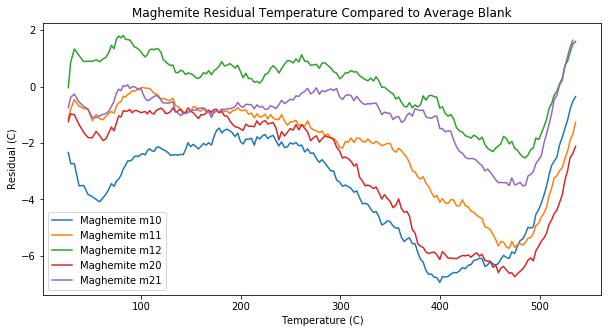

In [83]:
plt.figure(figsize = (10,5))

plt.plot(blank_df['blanks'], magh['m10'] - blank_df['blanks'], label = 'Maghemite m10')
plt.plot(blank_df['blanks'], magh['m11'] - blank_df['blanks'], label = 'Maghemite m11')
plt.plot(blank_df['blanks'], magh['m12'] - blank_df['blanks'], label = 'Maghemite m12')
plt.plot(blank_df['blanks'], magh['m20'] - blank_df['blanks'], label = 'Maghemite m20')
plt.plot(blank_df['blanks'], magh['m21'] - blank_df['blanks'], label = 'Maghemite m21')


plt.xlabel('Temperature (C)')
plt.ylabel('Residual (C)')
plt.title('Maghemite Residual Temperature Compared to Average Blank')
plt.legend()

In [84]:
# rescale and get avg curve
magh_comp = magh.copy()

# calculate residual in realtion to avg blank
magh_comp[['m10', 'm11', 'm12', 'm20', 'm21']] = magh_comp[['m10', 'm11', 'm12', 'm20', 'm21']].sub(blank_df['blanks'], axis = 0)

# calculate mean valvue for each and substract that off
means = magh_comp[['m10', 'm11', 'm12', 'm20', 'm21']].mean().tolist()
magh_comp[['m10', 'm11', 'm12', 'm20', 'm21']] = magh_comp[['m10', 'm11', 'm12', 'm20', 'm21']] - means

# rescale
scale = magh_comp[['m10', 'm11', 'm12', 'm20', 'm21']].abs().max().tolist()
magh_comp[['m10', 'm11', 'm12', 'm20', 'm21']] = magh_comp[['m10', 'm11', 'm12', 'm20', 'm21']] / scale

# average and sd
magh_comp['m'] =  magh_comp[['m10', 'm11', 'm12', 'm20', 'm21']].mean(axis = 1, skipna = False)
magh_comp['m_sd'] = magh_comp[['m10', 'm11', 'm12', 'm20', 'm21']].std(axis = 1, skipna = False)

Text(0.5, 1.0, 'Scaled Maghemite from Average Blank')

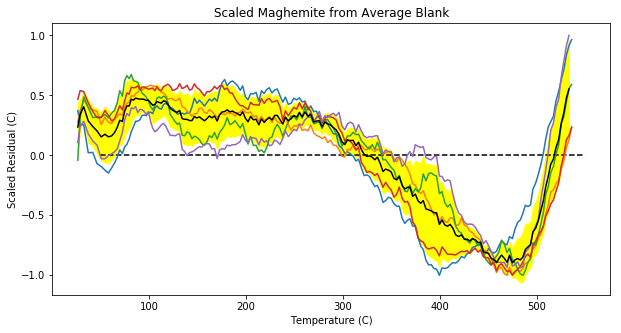

In [85]:
plt.figure(figsize = (10,5))

plt.plot(blank_df['blanks'], magh_comp['m10'])
plt.plot(blank_df['blanks'], magh_comp['m11'])
plt.plot(blank_df['blanks'], magh_comp['m12'])
plt.plot(blank_df['blanks'], magh_comp['m20'])
plt.plot(blank_df['blanks'], magh_comp['m21'])
plt.hlines(0,50,550, linestyle = 'dashed')

plt.plot(blank_df['blanks'], magh_comp['m'], 'k')
plt.fill_between(blank_df['blanks'], magh_comp['m']-magh_comp['m_sd'], magh_comp['m']+magh_comp['m_sd'], color = 'yellow')

plt.xlabel('Temperature (C)')
plt.ylabel('Scaled Residual (C)')
plt.title('Scaled Maghemite from Average Blank')

Text(0, 0.5, '1/Standard Deviation (C^-1)')

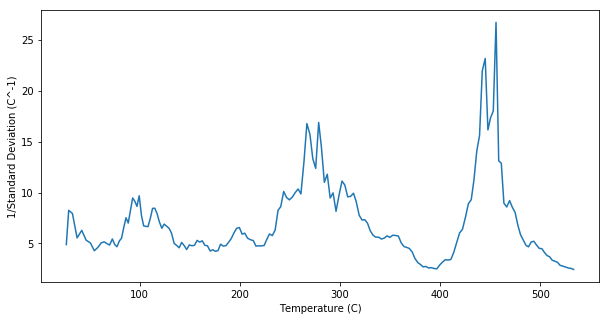

In [86]:
# plot inverse of standard deviation
plt.figure(figsize = (10,5))

plt.plot(blank_df['blanks'], 1/magh_comp['m_sd'])

plt.xlabel('Temperature (C)')
plt.ylabel('1/Standard Deviation (C^-1)')

In [87]:
# rescale and get avg curve
magh_comp_tube = magh.copy()

# calculate residual in realtion to avg blank
magh_comp_tube[['m10', 'm11', 'm12']] = magh_comp_tube[['m10', 'm11', 'm12']].sub(blank_df['bA'], axis = 0)
magh_comp_tube[['m20', 'm21']] = magh_comp_tube[['m20', 'm21']].sub(blank_df['bB'], axis = 0)

# calculate mean valvue for each and substract that off
means = magh_comp_tube[['m10', 'm11', 'm12', 'm20', 'm21']].mean().tolist()
magh_comp_tube[['m10', 'm11', 'm12', 'm20', 'm21']] = magh_comp_tube[['m10', 'm11', 'm12', 'm20', 'm21']] - means

# rescale
scale = magh_comp_tube[['m10', 'm11', 'm12', 'm20', 'm21']].abs().max().tolist()
magh_comp_tube[['m10', 'm11', 'm12', 'm20', 'm21']] = magh_comp_tube[['m10', 'm11', 'm12', 'm20', 'm21']] / scale

# average and sd
magh_comp_tube['m'] =  magh_comp_tube[['m10', 'm11', 'm12', 'm20', 'm21']].mean(axis = 1, skipna = False)
magh_comp_tube['m_sd'] = magh_comp_tube[['m10', 'm11', 'm12', 'm20', 'm21']].std(axis = 1, skipna = False)

Text(0.5, 1.0, 'Scaled Maghemite Residual Compared to Respective Tube')

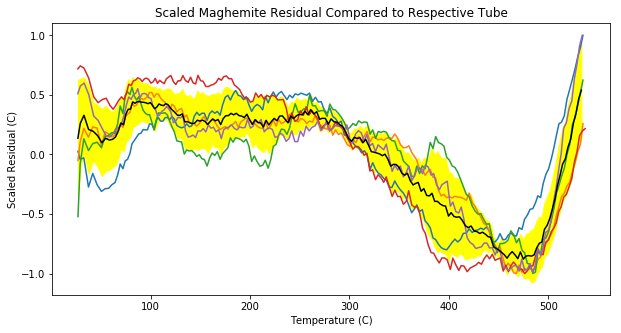

In [88]:
plt.figure(figsize = (10,5))

plt.plot(blank_df['bA'], magh_comp_tube['m10'])
plt.plot(blank_df['bA'], magh_comp_tube['m11'])
plt.plot(blank_df['bA'], magh_comp_tube['m12'])
plt.plot(blank_df['bB'], magh_comp_tube['m20'])
plt.plot(blank_df['bB'], magh_comp_tube['m21'])

plt.plot(blank_df['blanks'], magh_comp_tube['m'], 'k')
plt.fill_between(blank_df['blanks'], magh_comp_tube['m']-magh_comp_tube['m_sd'], magh_comp_tube['m']+magh_comp_tube['m_sd'], color = 'yellow')

plt.xlabel('Temperature (C)')
plt.ylabel('Scaled Residual (C)')
plt.title('Scaled Maghemite Residual Compared to Respective Tube')

Text(0, 0.5, '1/Standard Deviation (C^-1)')

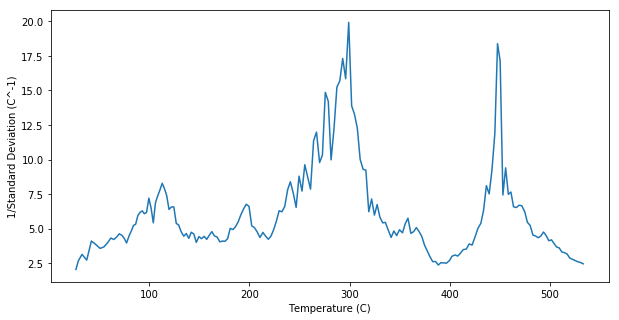

In [89]:
# plot inverse of standard deviation
plt.figure(figsize = (10,5))

plt.plot(blank_df['blanks'], 1/magh_comp_tube['m_sd'])

plt.xlabel('Temperature (C)')
plt.ylabel('1/Standard Deviation (C^-1)')

In [90]:
# rescale and get avg curve
magh_comp_direct = magh.copy()

# calculate residual in realtion to closest blank
magh_comp_direct[['m10']] = magh_comp_direct[['m10']].sub(blank_df['bA10'], axis = 0)
magh_comp_direct[['m11']] = magh_comp_direct[['m11']].sub(blank_df['bA10'], axis = 0)
magh_comp_direct[['m12']] = magh_comp_direct[['m12']].sub(blank_df['bA11'], axis = 0)

magh_comp_direct[['m20']] = magh_comp_direct[['m20']].sub(blank_df['bB20'], axis = 0)
magh_comp_direct[['m21']] = magh_comp_direct[['m21']].sub(blank_df['bB22'], axis = 0)

# calculate mean valvue for each and substract that off
means = magh_comp_direct[['m10', 'm11', 'm12', 'm20', 'm21']].mean().tolist()
magh_comp_direct[['m10', 'm11', 'm12', 'm20', 'm21']] = magh_comp_direct[['m10', 'm11', 'm12', 'm20', 'm21']] - means

# rescale
scale = magh_comp_direct[['m10', 'm11', 'm12', 'm20', 'm21']].abs().max().tolist()
magh_comp_direct[['m10', 'm11', 'm12', 'm20', 'm21']] = magh_comp_direct[['m10', 'm11', 'm12', 'm20', 'm21']] / scale

# average and sd
magh_comp_direct['m'] =  magh_comp_direct[['m10', 'm11', 'm12', 'm20', 'm21']].mean(axis = 1, skipna = False)
magh_comp_direct['m_sd'] =  magh_comp_direct[['m10', 'm11', 'm12', 'm20', 'm21']].std(axis = 1, skipna = False)

Text(0.5, 1.0, 'Scaled Maghemite Residual Compared to Nearest Blank')

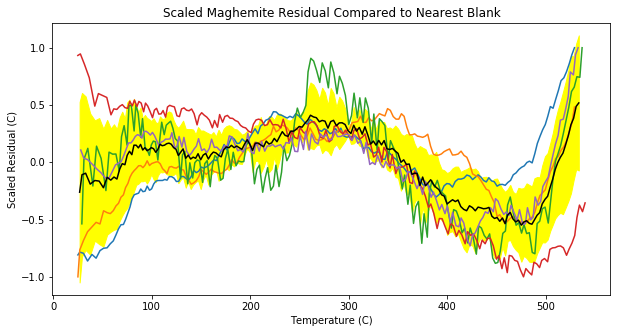

In [91]:
plt.figure(figsize = (10,5))

plt.plot(blank_df['bA10'], magh_comp_direct['m10'])
plt.plot(blank_df['bA10'], magh_comp_direct['m11'])
plt.plot(blank_df['bA11'], magh_comp_direct['m12'])
plt.plot(blank_df['bB20'], magh_comp_direct['m20'])
plt.plot(blank_df['bB22'], magh_comp_direct['m21'])

plt.plot(blank_df['blanks'], magh_comp_direct['m'], 'k')
plt.fill_between(blank_df['blanks'], magh_comp_direct['m']-magh_comp_direct['m_sd'], magh_comp_direct['m']+magh_comp_direct['m_sd'], color = 'yellow')

plt.xlabel('Temperature (C)')
plt.ylabel('Scaled Residual (C)')
plt.title('Scaled Maghemite Residual Compared to Nearest Blank')

In [92]:
# rescale and get avg curve
magh_det = magh.copy()

# calculate residual in realtion to closest blank
magh_det[['r_m10']] = magh_det[['m10']].sub(blank_df['bA10'], axis = 0)
magh_det[['r_m11']] = magh_det[['m11']].sub(blank_df['bA10'], axis = 0)
magh_det[['r_m12']] = magh_det[['m12']].sub(blank_df['bA11'], axis = 0)

magh_det[['r_m20']] = magh_det[['m20']].sub(blank_df['bB20'], axis = 0)
magh_det[['r_m21']] = magh_det[['m21']].sub(blank_df['bB22'], axis = 0)


# drop NAs
magh_det.dropna(inplace = True)


# best fit lines
fit_m10 = np.polyfit(magh_det['m10'], magh_det['r_m10'],1)
magh_det['d_r_m10'] = magh_det['r_m10'] - (fit_m10[0]*magh_det['m10']+fit_m10[1])

fit_m11 = np.polyfit(magh_det['m11'], magh_det['r_m11'],1)
magh_det['d_r_m11'] = magh_det['r_m11'] - (fit_m11[0]*magh_det['m11']+fit_m11[1])

fit_m12 = np.polyfit(magh_det['m12'], magh_det['r_m12'],1)
magh_det['d_r_m12'] = magh_det['r_m12'] - (fit_m12[0]*magh_det['m12']+fit_m12[1])

fit_m20 = np.polyfit(magh_det['m20'], magh_det['r_m20'],1)
magh_det['d_r_m20'] = magh_det['r_m20'] - (fit_m20[0]*magh_det['m20']+fit_m20[1])

fit_m21 = np.polyfit(magh_det['m21'], magh_det['r_m21'],1)
magh_det['d_r_m21'] = magh_det['r_m21'] - (fit_m21[0]*magh_det['m21']+fit_m21[1])

Text(0.5, 1.0, 'Detrended Maghemite Residual Compared to Nearest Blank')

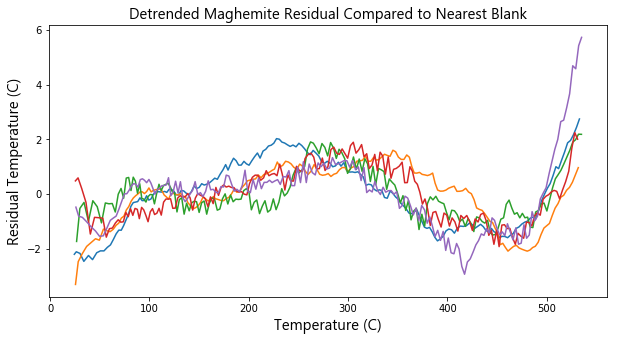

In [93]:
plt.figure(figsize = (10,5))

plt.plot(magh_det['m10'], magh_det['d_r_m10'])
plt.plot(magh_det['m11'], magh_det['d_r_m11'])
plt.plot(magh_det['m12'], magh_det['d_r_m12'])
plt.plot(magh_det['m20'], magh_det['d_r_m20'])
plt.plot(magh_det['m21'], magh_det['d_r_m21'])

plt.xlabel('Temperature (C)', **csfont)
plt.ylabel('Residual Temperature (C)', **csfont)
plt.title('Detrended Maghemite Residual Compared to Nearest Blank', **csfont)

In [94]:
magh_det['avg_d_r_m10'] = magh_det['d_r_m10'].rolling(5).mean()
magh_det['avg_d_r_m11'] = magh_det['d_r_m11'].rolling(5).mean()
magh_det['avg_d_r_m12'] = magh_det['d_r_m12'].rolling(5).mean()
magh_det['avg_d_r_m20'] = magh_det['d_r_m20'].rolling(5).mean()
magh_det['avg_d_r_m21'] = magh_det['d_r_m21'].rolling(5).mean()

Text(0.5, 1.0, 'Detrended Maghemite Residual Compared to Nearest Blank')

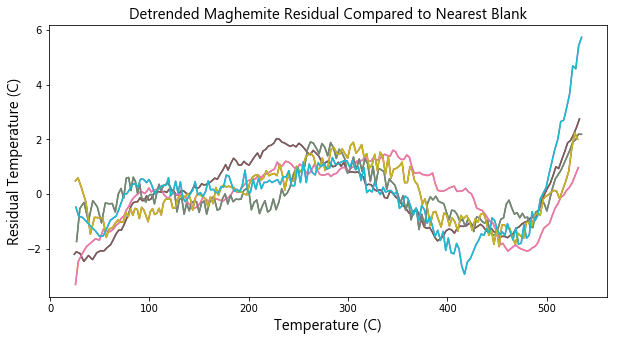

In [95]:
plt.figure(figsize = (10,5))

plt.plot(magh_det['m10'], magh_det['d_r_m10'])
plt.plot(magh_det['m11'], magh_det['d_r_m11'])
plt.plot(magh_det['m12'], magh_det['d_r_m12'])
plt.plot(magh_det['m20'], magh_det['d_r_m20'])
plt.plot(magh_det['m21'], magh_det['d_r_m21'])

plt.plot(magh_det['m10'], magh_det['d_r_m10'])
plt.plot(magh_det['m11'], magh_det['d_r_m11'])
plt.plot(magh_det['m12'], magh_det['d_r_m12'])
plt.plot(magh_det['m20'], magh_det['d_r_m20'])
plt.plot(magh_det['m21'], magh_det['d_r_m21'])

plt.xlabel('Temperature (C)', **csfont)
plt.ylabel('Residual Temperature (C)', **csfont)
plt.title('Detrended Maghemite Residual Compared to Nearest Blank', **csfont)

Text(0.5, 1.0, 'DSC Maghemite Heating')

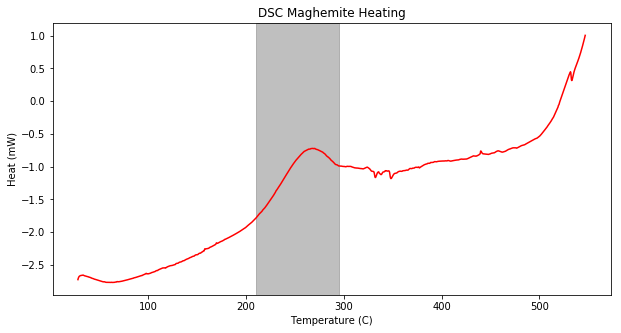

In [96]:
# pull in DSC data
magh_A04 = pd.read_csv('DSC_runs\magh_A04_UTF8.txt', skiprows = 17, delim_whitespace = True)
# drop row with the units
magh_A04.drop(0, inplace = True)
magh_A04.drop([3452, 3453, 3454, 3455, 3456], inplace = True)
magh_A04 = magh_A04.astype(float)
# find heating
magh_A04['leg'] = np.nan
magh_A04.loc[(magh_A04['t'] > 300) & (magh_A04['t'] <= 3450), 'leg'] = 'heat'

# just heating data
maghA_heat = magh_A04[magh_A04['leg'] == 'heat']
plt.figure(figsize = (10,5))
plt.plot(maghA_heat['Ts'][10:-10], maghA_heat['Value'][10:-10], 'r-')
plt.axvspan(210,295, color = 'grey', alpha = .5)
plt.xlabel('Temperature (C)')
plt.ylabel('Heat (mW)')
plt.title('DSC Maghemite Heating')


In [97]:
# find peaks
#find_peaks(maghA_heat['Value'], distance = 100, prominence = .25)
maghA_heat.loc[maghA_heat['Value'] == max(maghA_heat['Value'][729:1100])]

,Index,t,Ts,Tr,Value,leg
881,1760.0,1760.0,268.291,268.333,-0.720849,heat


In [98]:
maghA_heat['Ts'][1100]

341.262

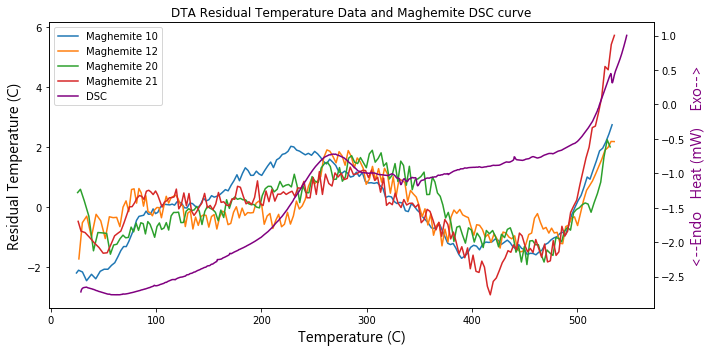

In [99]:
#csfont = {'fontname':'Georgia', 'fontsize':15}

fig, ax1 = plt.subplots(figsize = (10,5))

ax1.set_xlabel('Temperature (C)', **csfont)
ax1.set_ylabel('Residual Temperature (C)', color = 'k', **csfont)
ax1.plot(magh_det['m10'], magh_det['d_r_m10'], label = 'Maghemite 10')
ax1.plot(magh_det['m12'], magh_det['d_r_m12'], label = 'Maghemite 12')
ax1.plot(magh_det['m20'], magh_det['d_r_m20'], label = 'Maghemite 20')
ax1.plot(magh_det['m21'], magh_det['d_r_m21'], label = 'Maghemite 21')
#ax1.tick_params(axis='y', labelcolor=color)

ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis

ax2.set_ylabel('<--Endo   Heat (mW)    Exo-->', color='purple', **csfont)  # we already handled the x-label with ax1
ax2.plot(maghA_heat['Ts'][10:-10], maghA_heat['Value'][10:-10], color = 'purple', label = 'DSC measurement')
ax1.plot([],[], color = 'purple', label = 'DSC')
#ax2.tick_params(axis='y', labelcolor=color)

ax1.set_title('DTA Residual Temperature Data and Maghemite DSC curve')
ax1.legend()


fig.tight_layout()  # otherwise the right y-label is slightly clipped
plt.show()

In [100]:
# smoothen with loess fxn
magh_det['loess_d_r_m10'] = sm.nonparametric.lowess(magh_det['d_r_m10'], magh_det['m10'], frac = .08, return_sorted = False)
magh_det['loess_d_r_m12'] = sm.nonparametric.lowess(magh_det['d_r_m12'], magh_det['m12'], frac = .08, return_sorted = False)
magh_det['loess_d_r_m20'] = sm.nonparametric.lowess(magh_det['d_r_m20'], magh_det['m20'], frac = .08, return_sorted = False)
magh_det['loess_d_r_m21'] = sm.nonparametric.lowess(magh_det['d_r_m21'], magh_det['m21'], frac = .08, return_sorted = False)

Text(0.5, 1.0, 'Comparison of all Detrended Goethite')

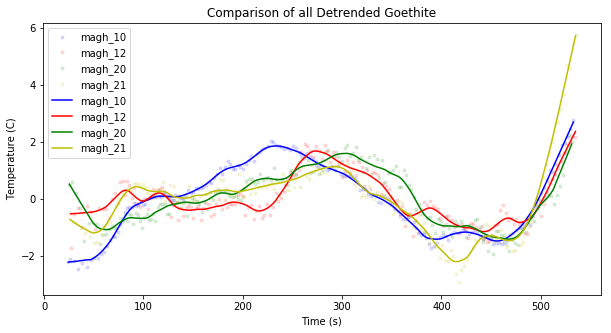

In [101]:
plt.figure(figsize = (10,5))

plt.plot(magh_det['m10'], magh_det['d_r_m10'], 'b.', alpha = 0.125, label = 'magh_10')
plt.plot(magh_det['m12'], magh_det['d_r_m12'], 'r.', alpha = 0.125, label = 'magh_12')
plt.plot(magh_det['m20'], magh_det['d_r_m20'], 'g.', alpha = 0.125, label = 'magh_20')
plt.plot(magh_det['m21'], magh_det['d_r_m21'], 'y.', alpha = 0.125, label = 'magh_21')

plt.plot(magh_det['m10'], magh_det['loess_d_r_m10'], 'b-', label = 'magh_10')
plt.plot(magh_det['m12'], magh_det['loess_d_r_m12'], 'r-', label = 'magh_12')
plt.plot(magh_det['m20'], magh_det['loess_d_r_m20'], 'g-', label = 'magh_20')
plt.plot(magh_det['m21'], magh_det['loess_d_r_m21'], 'y-', label = 'magh_21')

plt.xlabel('Time (s)')
plt.ylabel('Temperature (C)')
plt.legend()
plt.title('Comparison of all Detrended Goethite')

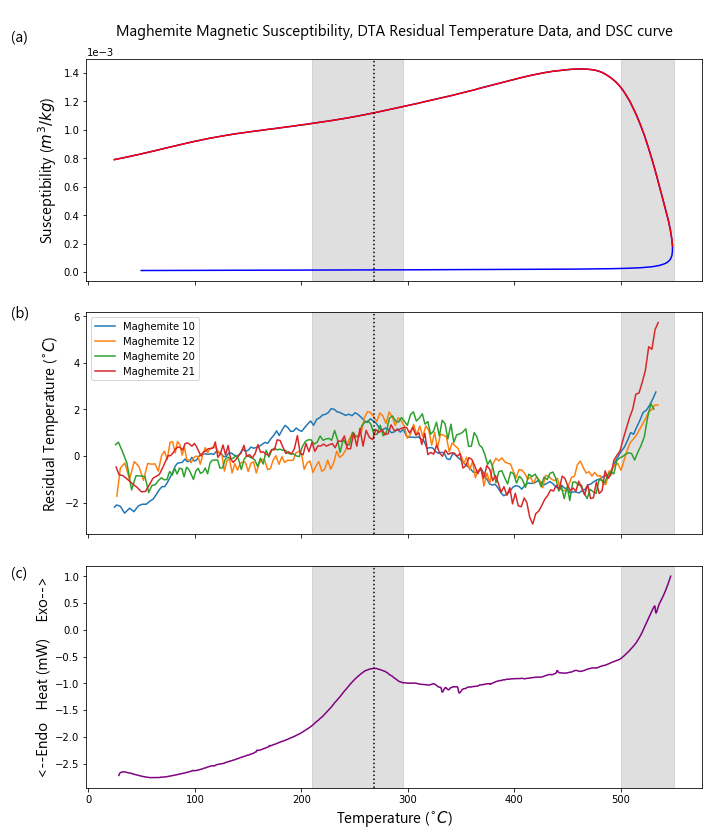

In [102]:
csfont = {'fontname':'Microsoft Tai Le', 'fontsize':15}

fig, (ax1,ax2,ax3) = plt.subplots(3,1,figsize = (10,12), sharex = True)

# Susceptibility
ax1.plot(magh_10f['temp'], magh_10f['csusc']*(1e-5)/(MinKey[5705].loc['Specimen_mass[g]']*1000), 'b-')
ax1.plot(magh_10['temp'], magh_10['csusc']*(1e-5)/(MinKey[5705].loc['Specimen_mass[g]']*1000), 'r-')
ax1.axvline(268, color = 'black', linestyle = 'dotted')
ax1.axvspan(210,295, color = 'grey', alpha = .25)
ax1.axvspan(500,550, color = 'grey', alpha = .25)
ax1.set_ylabel('Susceptibility ($m^3/kg$)', **csfont)
ax1.ticklabel_format(axis = 'y', style = 'sci', scilimits = (0,0))
ax1.annotate('(a)', (0.015,.95), xycoords = 'figure fraction', **csfont)

# kDTA
ax2.set_ylabel('Residual Temperature ($^{\circ}C$)', color = 'k', **csfont)
ax2.plot(magh_det['m10'], magh_det['d_r_m10'], label = 'Maghemite 10')
ax2.plot(magh_det['m12'], magh_det['d_r_m12'], label = 'Maghemite 12')
ax2.plot(magh_det['m20'], magh_det['d_r_m20'], label = 'Maghemite 20')
ax2.plot(magh_det['m21'], magh_det['d_r_m21'], label = 'Maghemite 21')
ax2.axvline(268, color = 'black', linestyle = 'dotted')
ax2.axvspan(210,295, color = 'grey', alpha = .25)
ax2.axvspan(500,550, color = 'grey', alpha = .25)
ax2.legend()
ax2.annotate('(b)', (0.015,.62), xycoords = 'figure fraction', **csfont)
#ax1.tick_params(axis='y', labelcolor=color)

# DSC
ax3.set_ylabel('<--Endo   Heat (mW)    Exo-->', **csfont) 
ax3.plot(maghA_heat['Ts'][10:-10], maghA_heat['Value'][10:-10], color = 'purple', label = 'DSC measurement')
ax3.axvline(268, color = 'black', linestyle = 'dotted')
ax3.axvspan(210,295, color = 'grey', alpha = .25)
ax3.axvspan(500,550, color = 'grey', alpha = .25)
ax3.set_xlabel('Temperature ($^{\circ}C$)', **csfont) # for all of them
ax3.annotate('(c)', (0.015,.31), xycoords = 'figure fraction', **csfont)


ax1.set_title('Maghemite Magnetic Susceptibility, DTA Residual Temperature Data, and DSC curve', y = 1.08, **csfont)


fig.tight_layout()  # otherwise the right y-label is slightly clipped
plt.show()

#fig.savefig('maghemite_results_allanalysis')

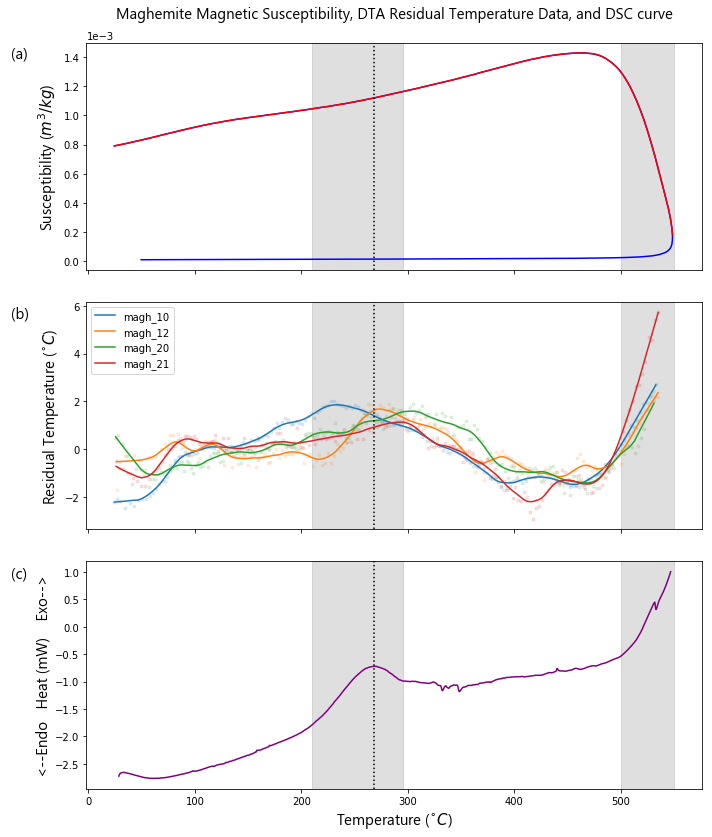

In [103]:
csfont = {'fontname':'Microsoft Tai Le', 'fontsize':15}

fig, (ax1,ax2,ax3) = plt.subplots(3,1,figsize = (10,12), sharex = True)

# Susceptibility
ax1.plot(magh_10f['temp'], magh_10f['csusc']*(1e-5)/(MinKey[5705].loc['Specimen_mass[g]']*1000), 'b-')
ax1.plot(magh_10['temp'], magh_10['csusc']*(1e-5)/(MinKey[5705].loc['Specimen_mass[g]']*1000), 'r-')
ax1.axvline(268, color = 'black', linestyle = 'dotted')
ax1.axvspan(210,295, color = 'grey', alpha = .25)
ax1.axvspan(500,550, color = 'grey', alpha = .25)
ax1.set_ylabel('Susceptibility ($m^3/kg$)', **csfont)
ax1.ticklabel_format(axis = 'y', style = 'sci', scilimits = (0,0))
ax1.annotate('(a)', (0.015,.93), xycoords = 'figure fraction', **csfont)

# kDTA
ax2.set_ylabel('Residual Temperature ($^{\circ}C$)', color = 'k', **csfont)
ax2.plot(magh_det['m10'], magh_det['d_r_m10'], '.', color = 'tab:blue', alpha = 0.125, label = '_nolegend_')
ax2.plot(magh_det['m12'], magh_det['d_r_m12'], '.', color = 'tab:orange', alpha = 0.125, label = '_nolegend_')
ax2.plot(magh_det['m20'], magh_det['d_r_m20'], '.', color = 'tab:green', alpha = 0.125, label = '_nolegend_')
ax2.plot(magh_det['m21'], magh_det['d_r_m21'], '.', color = 'tab:red', alpha = 0.125, label = '_nolegend_')

ax2.plot(magh_det['m10'], magh_det['loess_d_r_m10'], '-', color = 'tab:blue', label = 'magh_10')
ax2.plot(magh_det['m12'], magh_det['loess_d_r_m12'], '-', color = 'tab:orange', label = 'magh_12')
ax2.plot(magh_det['m20'], magh_det['loess_d_r_m20'], '-', color = 'tab:green', label = 'magh_20')
ax2.plot(magh_det['m21'], magh_det['loess_d_r_m21'], '-', color = 'tab:red', label = 'magh_21')
ax2.axvline(268, color = 'black', linestyle = 'dotted')
ax2.axvspan(210,295, color = 'grey', alpha = .25)
ax2.axvspan(500,550, color = 'grey', alpha = .25)
ax2.legend()
ax2.annotate('(b)', (0.015,.62), xycoords = 'figure fraction', **csfont)
#ax1.tick_params(axis='y', labelcolor=color)

# DSC
ax3.set_ylabel('<--Endo   Heat (mW)    Exo-->', **csfont) 
ax3.plot(maghA_heat['Ts'][10:-10], maghA_heat['Value'][10:-10], color = 'purple', label = 'DSC measurement')
ax3.axvline(268, color = 'black', linestyle = 'dotted')
ax3.axvspan(210,295, color = 'grey', alpha = .25)
ax3.axvspan(500,550, color = 'grey', alpha = .25)
ax3.set_xlabel('Temperature ($^{\circ}C$)', **csfont) # for all of them
ax3.annotate('(c)', (0.015,.31), xycoords = 'figure fraction', **csfont)


ax1.set_title('Maghemite Magnetic Susceptibility, DTA Residual Temperature Data, and DSC curve', y = 1.08, **csfont)


fig.tight_layout()  # otherwise the right y-label is slightly clipped
plt.show()

#fig.savefig('maghemite_results_allanalysis_sm')

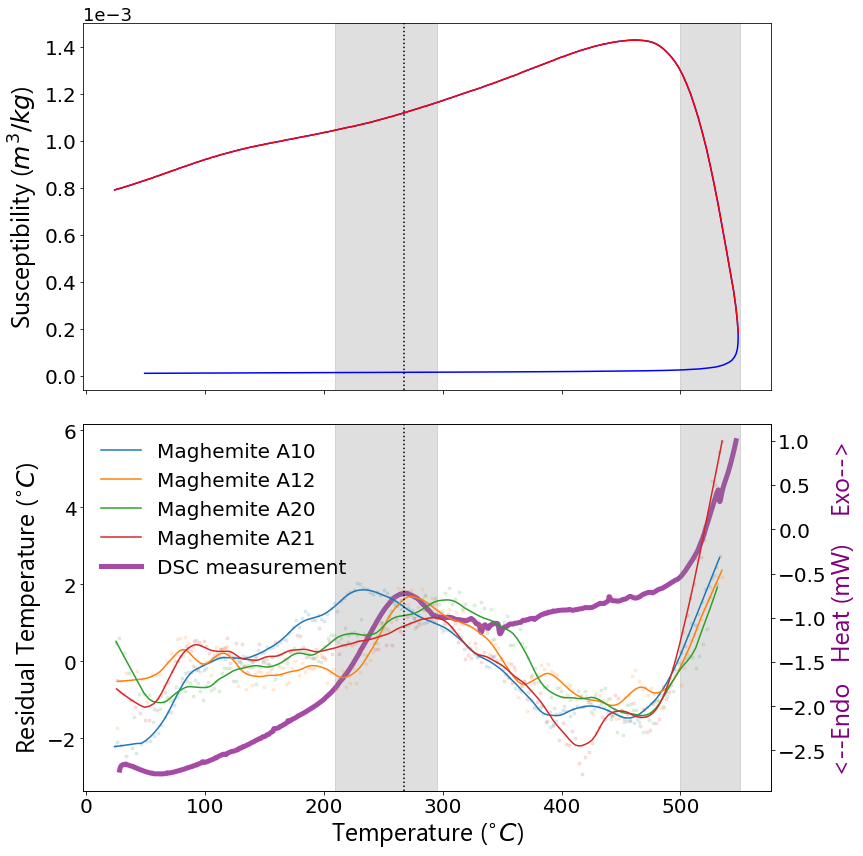

In [104]:
csfont = {'fontname':'Microsoft Tai Le', 'fontsize':25}

fig, (ax1,ax2) = plt.subplots(2,1,figsize = (12,12), sharex = True)

# Susceptibility
ax1.plot(magh_10f['temp'], magh_10f['csusc']*(1e-5)/(MinKey[5705].loc['Specimen_mass[g]']*1000), 'b-')
ax1.plot(magh_10['temp'], magh_10['csusc']*(1e-5)/(MinKey[5705].loc['Specimen_mass[g]']*1000), 'r-')
ax1.axvline(268, color = 'black', linestyle = 'dotted')
ax1.axvspan(210,295, color = 'grey', alpha = .25)
ax1.axvspan(500,550, color = 'grey', alpha = .25)
ax1.set_ylabel('Susceptibility ($m^3/kg$)', **csfont)
ax1.ticklabel_format(axis = 'y', style = 'sci', scilimits = (0,0))
ax1.tick_params(axis='y', which='major', labelsize=20)
ax1.yaxis.offsetText.set_fontsize(18)
#ax1.annotate('(a)', (0.03,.93), xycoords = 'figure fraction', **csfont)


# kDTA
ax2.set_zorder(10)
ax2.patch.set_visible(False)

ax2.set_ylabel('Residual Temperature ($^{\circ}C$)', color = 'k', **csfont)
ax2.set_xlabel('Temperature ($^{\circ}C$)', **csfont)
ax2.tick_params(axis='both', which='major', labelsize=20)

ax2.plot(magh_det['m10'], magh_det['d_r_m10'], '.', color = 'tab:blue', alpha = 0.125, label = '_nolegend_')
ax2.plot(magh_det['m12'], magh_det['d_r_m12'], '.', color = 'tab:orange', alpha = 0.125, label = '_nolegend_')
ax2.plot(magh_det['m20'], magh_det['d_r_m20'], '.', color = 'tab:green', alpha = 0.125, label = '_nolegend_')
ax2.plot(magh_det['m21'], magh_det['d_r_m21'], '.', color = 'tab:red', alpha = 0.125, label = '_nolegend_')

ax2.plot(magh_det['m10'], magh_det['loess_d_r_m10'], '-', color = 'tab:blue', label = 'Maghemite A10')
ax2.plot(magh_det['m12'], magh_det['loess_d_r_m12'], '-', color = 'tab:orange', label = 'Maghemite A12')
ax2.plot(magh_det['m20'], magh_det['loess_d_r_m20'], '-', color = 'tab:green', label = 'Maghemite A20')
ax2.plot(magh_det['m21'], magh_det['loess_d_r_m21'], '-', color = 'tab:red', label = 'Maghemite A21')
ax2.axvline(268, color = 'black', linestyle = 'dotted')
ax2.axvspan(210,295, color = 'grey', alpha = .25)
ax2.axvspan(500,550, color = 'grey', alpha = .25)

ax2.plot([], [], color = 'purple', linewidth = 5, alpha = .7, label = 'DSC measurement')

ax2.legend(prop={'size': 20}, frameon = False)
#ax2.annotate('(b)', (0.03,.44), xycoords = 'figure fraction', **csfont)
#ax1.tick_params(axis='y', labelcolor=color)

# DSC
ax3 = ax2.twinx()  # instantiate a second axes that shares the same x-axis

ax3.set_ylabel('<--Endo   Heat (mW)    Exo-->', **csfont, color = 'purple') 
ax3.plot(maghA_heat['Ts'][10:-10], maghA_heat['Value'][10:-10], color = 'purple', linewidth = 5, alpha = .7, label = 'DSC measurement')
ax3.set_xlabel('Temperature ($^{\circ}C$)', **csfont) # for all of them
ax3.tick_params(axis='y', which='major', labelsize=20)


#ax1.set_title('Maghemite Magnetic Susceptibility, DTA Residual Temperature Data, and DSC curve', y = 1.08, **csfont)


fig.tight_layout()  # makes a wierd space in this plot

plt.show()

#fig.savefig('maghemite_results_allanalysis_diplot', dpi = 300, bbox_inches = 'tight')

Text(0, 0.5, '1/Standard Deviation (C^-1)')

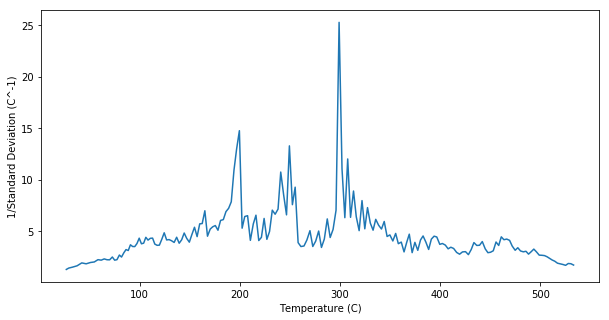

In [105]:
# plot inverse of standard deviation
plt.figure(figsize = (10,5))

plt.plot(blank_df['blanks'], 1/magh_comp_direct['m_sd'])

plt.xlabel('Temperature (C)')
plt.ylabel('1/Standard Deviation (C^-1)')

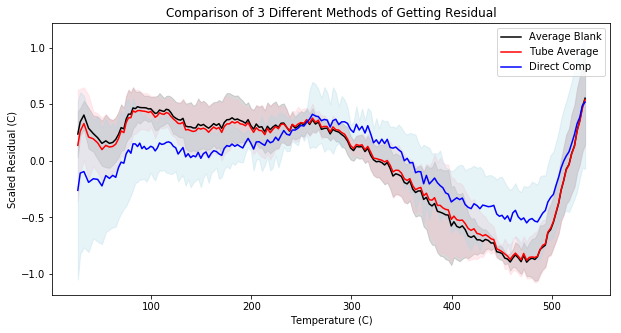

In [106]:
# all the plots
plt.figure(figsize = (10,5))

plt.plot(blank_df['blanks'], magh_comp['m'], 'k', label = 'Average Blank')
plt.fill_between(blank_df['blanks'], magh_comp['m']-magh_comp['m_sd'], magh_comp['m']+magh_comp['m_sd'], color = 'grey', alpha = .3)


plt.plot(blank_df['blanks'], magh_comp_tube['m'], 'r', label = 'Tube Average')
plt.fill_between(blank_df['blanks'], magh_comp_tube['m']-magh_comp_tube['m_sd'], magh_comp_tube['m']+magh_comp_tube['m_sd'], color = 'pink', alpha = .3)


plt.plot(blank_df['blanks'], magh_comp_direct['m'], 'b', label = 'Direct Comp')
plt.fill_between(blank_df['blanks'], magh_comp_direct['m']-magh_comp_direct['m_sd'], magh_comp_direct['m']+magh_comp_direct['m_sd'], color = 'lightblue', alpha = .3)

plt.xlabel('Temperature (C)')
plt.ylabel('Scaled Residual (C)')
plt.title('Comparison of 3 Different Methods of Getting Residual')

plt.legend()

### Let Pull in the Whole Maghemite Data from others

In [107]:
# maghemite
magh_93252 = getminlog(93252, return_full = False, susplot = False)
magh_93228 = getminlog(93228, return_full = False, susplot = False)
magh_93240 = getminlog(93240, return_full = False, susplot = False)
magh_93731 = getminlog(93731, return_full = False, susplot = False)
magh_93732 = getminlog(93732, return_full = False, susplot = False)


In [65]:
int_m93252t = interp1d(magh_93252['time'][:-5],magh_93252['temp'][:-5], kind = 'linear', bounds_error = False)
temp_m93252 = int_m93252t(t)

int_m93228t = interp1d(magh_93228['time'][:-5],magh_93228['temp'][:-5], kind = 'linear', bounds_error = False)
temp_m93228 = int_m93228t(t)

int_m93240t = interp1d(magh_93240['time'][:-5],magh_93240['temp'][:-5], kind = 'linear', bounds_error = False)
temp_m93240 = int_m93240t(t)

int_m93731t = interp1d(magh_93731['time'][:-5],magh_93731['temp'][:-5], kind = 'linear', bounds_error = False)
temp_m93731 = int_m93731t(t)

int_m93732t = interp1d(magh_93732['time'][:-5],magh_93732['temp'][:-5], kind = 'linear', bounds_error = False)
temp_m93732 = int_m93732t(t)

In [68]:
maghplus = pd.DataFrame({'time':t, 'm93252':temp_m93252, 'm93228':temp_m93228, 'm93240':temp_m93240, 'm93731':temp_m93731, 'm93732':temp_m93732})

ValueError: x and y must have same first dimension, but have shapes (187,) and (247,)

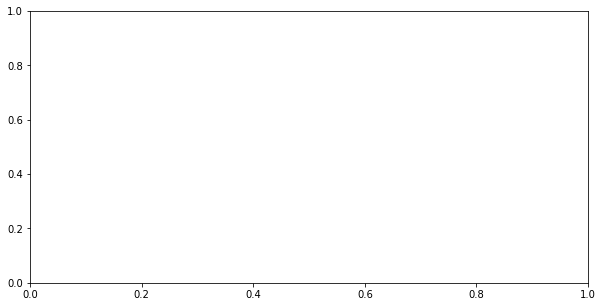

In [69]:
# magh_A93252

plt.figure(figsize = (10,5))

plt.plot(blank_df['blanks'], maghplus['m93252']-blank_df['blanks'], 'r', label = 'Average Blank')
plt.fill_between(blank_df['blanks'], -blank_df['blanks_sd'], blank_df['blanks_sd'], color = 'grey', alpha = .5)
plt.xlim(0,700)


plt.xlabel('Temperature (C)')
plt.ylabel('Residual Temperature (C)')
plt.title('Comparison of magh_A01 heating to avg blank')


ValueError: x and y must have same first dimension, but have shapes (187,) and (247,)

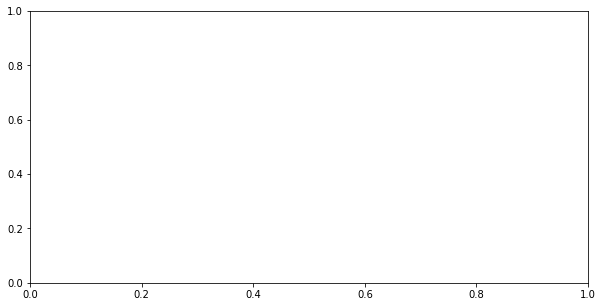

In [73]:
# magh_A93228

plt.figure(figsize = (10,5))

plt.plot(blank_df['blanks'], maghplus['m93228']-blank_df['blanks'], 'r', label = 'Average Blank')
plt.fill_between(blank_df['blanks'], -blank_df['blanks_sd'], blank_df['blanks_sd'], color = 'grey', alpha = .5)
plt.xlim(0,700)

plt.xlabel('Temperature (C)')
plt.ylabel('Residual Temperature (C)')
plt.title('Comparison of magh_A01 heating to avg blank')

ValueError: x and y must have same first dimension, but have shapes (187,) and (247,)

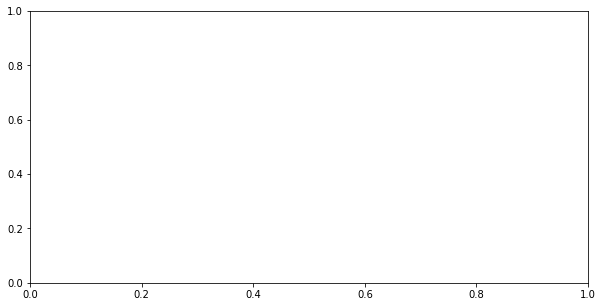

In [101]:
# magh_A93240

plt.figure(figsize = (10,5))

plt.plot(blank_df['blanks'], maghplus['m93228']-blank_df['blanks'], 'r', label = 'Average Blank')
plt.fill_between(blank_df['blanks'], -blank_df['blanks_sd'], blank_df['blanks_sd'], color = 'grey', alpha = .5)
plt.xlim(0,700)

plt.xlabel('Temperature (C)')
plt.ylabel('Residual Temperature (C)')
plt.title('Comparison of magh_A01 heating to avg blank')

In [102]:
# rescale and get avg curve
maghplus_comp = maghplus.copy()

# calculate residual in realtion to avg blank
maghplus_comp[['m93252', 'm93228', 'm93240', 'm93731', 'm93732']] = maghplus_comp[['m93252', 'm93228', 'm93240', 'm93731', 'm93732']].sub(blank_df['blanks'], axis = 0)

# calculate mean valvue for each and substract that off
means = maghplus_comp[['m93252', 'm93228', 'm93240', 'm93731', 'm93732']].mean().tolist()
maghplus_comp[['m93252', 'm93228', 'm93240', 'm93731', 'm93732']] = maghplus_comp[['m93252', 'm93228', 'm93240', 'm93731', 'm93732']] - means

# rescale
scale = maghplus_comp[['m93252', 'm93228', 'm93240', 'm93731', 'm93732']].abs().max().tolist()
maghplus_comp[['m93252', 'm93228', 'm93240', 'm93731', 'm93732']] = maghplus_comp[['m93252', 'm93228', 'm93240', 'm93731', 'm93732']] / scale

# average and sd
maghplus_comp['m'] =  maghplus_comp[['m93252', 'm93228', 'm93240', 'm93731', 'm93732']].mean(axis = 1, skipna = False)
maghplus_comp['m_sd'] = maghplus_comp[['m93252', 'm93228', 'm93240', 'm93731', 'm93732']].std(axis = 1, skipna = False)

ValueError: x and y must have same first dimension, but have shapes (187,) and (247,)

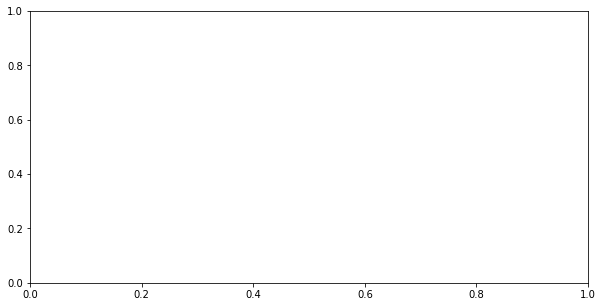

In [103]:
plt.figure(figsize = (10,5))

plt.plot(blank_df['blanks'], maghplus_comp['m93252'])
plt.plot(blank_df['blanks'], maghplus_comp['m93228'])
plt.plot(blank_df['blanks'], maghplus_comp['m93240'])
plt.plot(blank_df['blanks'], maghplus_comp['m93731'])
plt.plot(blank_df['blanks'], maghplus_comp['m93732'])

plt.plot(blank_df['blanks'], maghplus_comp['m'], 'k')
plt.fill_between(blank_df['blanks'], maghplus_comp['m']-maghplus_comp['m_sd'], maghplus_comp['m']+maghplus_comp['m_sd'], color = 'yellow')

plt.xlabel('Temperature (C)')
plt.ylabel('Scaled Residual (C)')
plt.title('Scaled Maghemite from Average Blank')
plt.legend()

ValueError: x and y must have same first dimension, but have shapes (187,) and (247,)

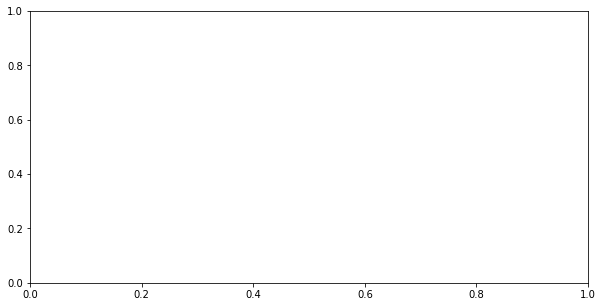

In [104]:
# plot inverse of standard deviation
plt.figure(figsize = (10,5))

plt.plot(blank_df['blanks'], 1/maghplus_comp['m_sd'])

plt.xlabel('Temperature (C)')
plt.ylabel('1/Standard Deviation (C^-1)')

## Goethite data too

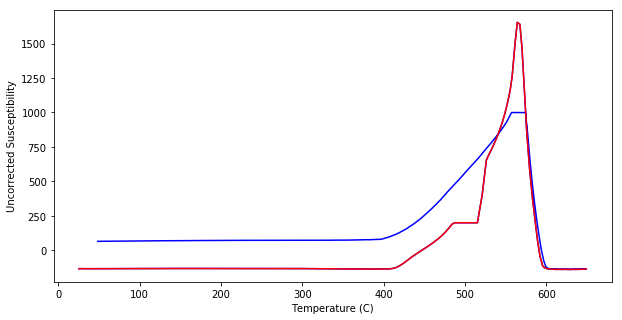

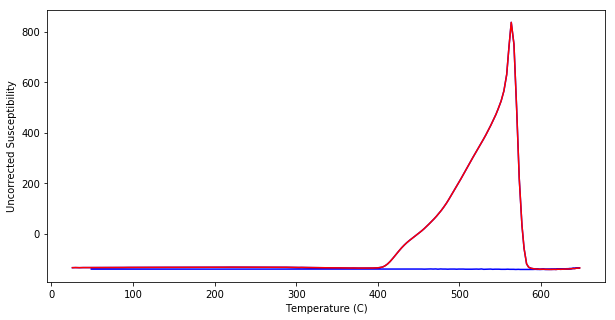

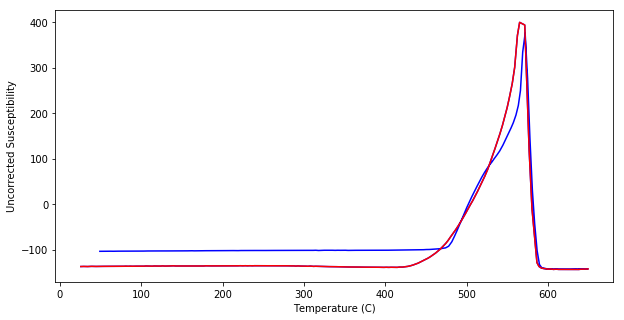

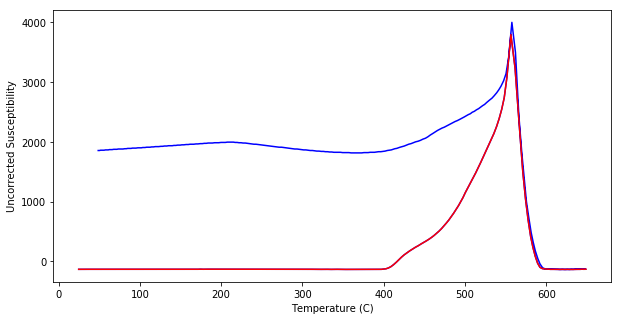

In [108]:
# get blank
Tube_B01 = getminlog(5826, return_full = False, susplot = False)
Tube_B02 = getminlog(5830, return_full = False, susplot = False)
Tube_B10 = getminlog(5828, return_full = False, susplot = False)
Tube_B11 = getminlog(5887, return_full = False, susplot = False)


# get goethite
goeth_B01 = getminlog(5827, return_full = False, susplot = True)
goeth_B02, goeth_B02f = getminlog(5831, return_full = True, susplot = True)
goeth_B10, goeth_B10f = getminlog(5829, return_full = True, susplot = True)
goeth_B11 = getminlog(5888, return_full = False, susplot = True)

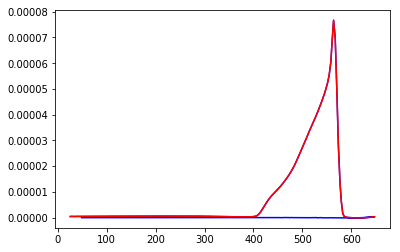

In [109]:
# correct susceptibility measurements to be in [m3/kg]
goeth_B02f['csusc'] = (goeth_B02f['susc']+140)*(1e-5)/(MinKey[5831].loc['Specimen_mass[g]']*1000)
goeth_B02['csusc'] = (goeth_B02['susc']+140)*(1e-5)/(MinKey[5831].loc['Specimen_mass[g]']*1000)

plt.plot(goeth_B02f['temp'], goeth_B02f['csusc'], 'b')
plt.plot(goeth_B02['temp'], goeth_B02['csusc'], 'r')

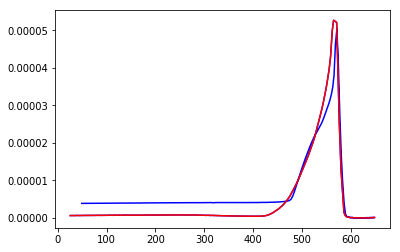

In [110]:
# correct susceptibility measurements to be in [m3/kg]
goeth_B10f['csusc'] = (goeth_B10f['susc']+143.5)*(1e-5)/(MinKey[5829].loc['Specimen_mass[g]']*1000)
goeth_B10['csusc'] = (goeth_B10['susc']+143.5)*(1e-5)/(MinKey[5829].loc['Specimen_mass[g]']*1000)

plt.plot(goeth_B10f['temp'], goeth_B10f['csusc'], 'b')
plt.plot(goeth_B10['temp'], goeth_B10['csusc'], 'r')

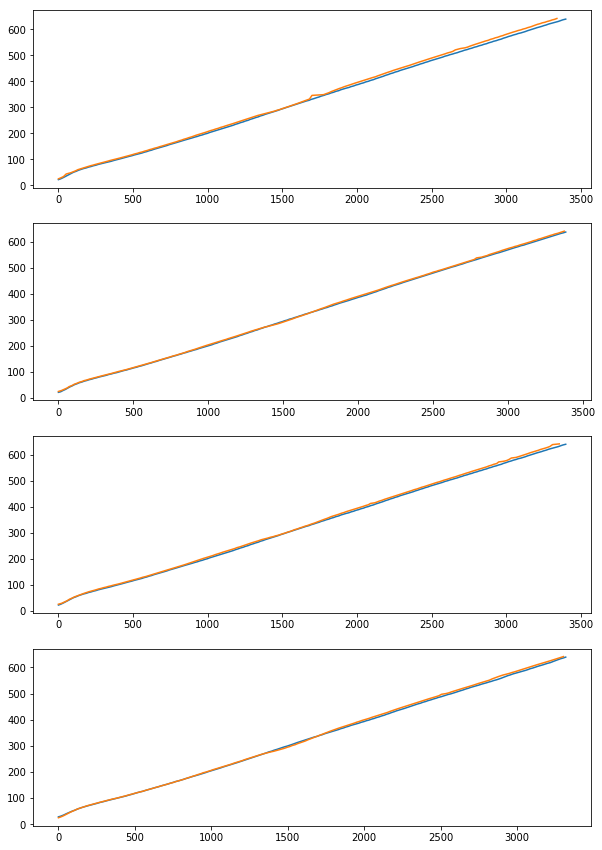

In [111]:
plt.figure(figsize = (10, 15))

plt.subplot(411)
plt.plot(Tube_B01['time'][:-5], Tube_B01['temp'][:-5])
plt.plot(goeth_B01['time'][:-5], goeth_B01['temp'][:-5])

plt.subplot(412)
plt.plot(Tube_B02['time'][:-5], Tube_B02['temp'][:-5])
plt.plot(goeth_B02['time'][:-5], goeth_B02['temp'][:-5])

plt.subplot(413)
plt.plot(Tube_B01['time'][:-5], Tube_B01['temp'][:-5])
plt.plot(goeth_B10['time'][:-5], goeth_B10['temp'][:-5])

plt.subplot(414)
plt.plot(Tube_B11['time'][:-7], Tube_B11['temp'][:-7])
plt.plot(goeth_B11['time'][:-5], goeth_B11['temp'][:-5])

In [112]:
# delete the annoying points
goeth_B01.drop(102, inplace = True)
goeth_B02.drop(169, inplace = True)

In [113]:
# time vector
t = np.arange(0,3450,15)

# linear interpolate each and write in terms of t

int_B01 = interp1d(Tube_B01['time'][:-5], Tube_B01['temp'][:-5], kind = 'linear', bounds_error = False)
b_B01 = int_B01(t)

int_B02 = interp1d(Tube_B02['time'][:-5], Tube_B02['temp'][:-5], kind = 'linear', bounds_error = False)
b_B02 = int_B02(t)

int_B10 = interp1d(Tube_B10['time'][:-5], Tube_B10['temp'][:-5], kind = 'linear', bounds_error = False)
b_B10 = int_B10(t)

int_B11 = interp1d(Tube_B11['time'][:-7], Tube_B11['temp'][:-7], kind = 'linear', bounds_error = False)
b_B11 = int_B11(t)

int_gB01 = interp1d(goeth_B01['time'][:-5], goeth_B01['temp'][:-5], kind = 'linear', bounds_error = False)
g_B01 = int_gB01(t)

int_gB02 = interp1d(goeth_B02['time'][:-5], goeth_B02['temp'][:-5], kind = 'linear', bounds_error = False)
g_B02 = int_gB02(t)

int_gB10 = interp1d(goeth_B10['time'][:-5], goeth_B10['temp'][:-5], kind = 'linear', bounds_error = False)
g_B10 = int_gB10(t)


int_gB11 = interp1d(goeth_B11['time'][:-5], goeth_B11['temp'][:-5], kind = 'linear', bounds_error = False)
g_B11 = int_gB11(t)

In [114]:
goeth_df = pd.DataFrame({'time':t, 'b_B01': b_B01, 'b_B02': b_B02, 'b_B10':b_B10, 'b_B11':b_B11, 'g_B01': g_B01, 'g_B02': g_B02, 'g_B10': g_B10, 'g_B11': g_B11})

In [115]:
goeth_df['avg_b'] = goeth_df[['b_B01', 'b_B02','b_B10']].mean(axis = 1)
goeth_df['avg_b_sd'] = goeth_df[['b_B01', 'b_B02','b_B10']].std(axis = 1)

goeth_df['avg_g'] = goeth_df[['g_B01', 'g_B02', 'g_B10']].mean(axis = 1)

Text(0.5, 1.0, 'Comparison of all Goethite')

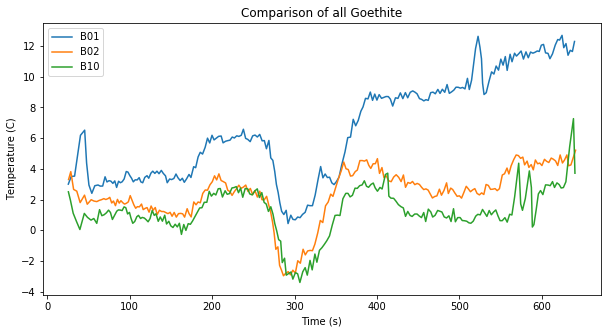

In [116]:
plt.figure(figsize = (10,5))
plt.plot(goeth_df['g_B01'], goeth_df['g_B01']-goeth_df['b_B01'], label = 'B01')
plt.plot(goeth_df['g_B02'], goeth_df['g_B02']-goeth_df['b_B02'], label = 'B02')
plt.plot(goeth_df['g_B10'], goeth_df['g_B10']-goeth_df['b_B10'], label = 'B10')
plt.xlabel('Time (s)')
plt.ylabel('Temperature (C)')
plt.legend()
plt.title('Comparison of all Goethite')

In [117]:
# start with same data frame
goeth_det = goeth_df[['time', 'avg_b', 'b_B01', 'b_B02', 'b_B10', 'b_B11', 'g_B01', 'g_B02', 'g_B10', 'g_B11']].copy()

# calc residuals
goeth_det['rg_B01'] = goeth_df['g_B01']-goeth_det['b_B01']
goeth_det['rg_B02'] = goeth_df['g_B02']-goeth_det['b_B02']
goeth_det['rg_B10'] = goeth_df['g_B10']-goeth_det['b_B10']
goeth_det['rg_B11'] = goeth_df['g_B11']-goeth_det['b_B11']

goeth_det.dropna(inplace = True)

# best fit line
fit_gB01 = np.polyfit(goeth_det['g_B01'], goeth_det['rg_B01'],1)
goeth_det['d_rg_B01'] = goeth_det['rg_B01'] - (fit_gB01[0]*goeth_det['g_B01']+fit_gB01[1])

fit_gB02 = np.polyfit(goeth_det['g_B02'], goeth_det['rg_B02'],1)
goeth_det['d_rg_B02'] = goeth_det['rg_B02'] - (fit_gB02[0]*goeth_det['g_B02']+fit_gB02[1])

fit_gB10 = np.polyfit(goeth_det['g_B10'], goeth_det['rg_B10'],1)
goeth_det['d_rg_B10'] = goeth_det['rg_B10'] - (fit_gB10[0]*goeth_det['g_B10']+fit_gB10[1])

fit_gB11 = np.polyfit(goeth_det['g_B11'], goeth_det['rg_B11'],1)
goeth_det['d_rg_B11'] = goeth_det['rg_B11'] - (fit_gB11[0]*goeth_det['g_B11']+fit_gB11[1])

# smooth
goeth_det['loess_d_rg_B01'] = sm.nonparametric.lowess(goeth_det['d_rg_B01'], goeth_det['g_B01'], frac = .08, return_sorted = False)
goeth_det['loess_d_rg_B02'] = sm.nonparametric.lowess(goeth_det['d_rg_B02'], goeth_det['g_B02'], frac = .08, return_sorted = False)
goeth_det['loess_d_rg_B10'] = sm.nonparametric.lowess(goeth_det['d_rg_B10'], goeth_det['g_B10'], frac = .08, return_sorted = False)
goeth_det['loess_d_rg_B11'] = sm.nonparametric.lowess(goeth_det['d_rg_B11'], goeth_det['g_B11'], frac = .08, return_sorted = False)

Text(0.5, 1.0, 'Comparison of all Detrended Goethite')

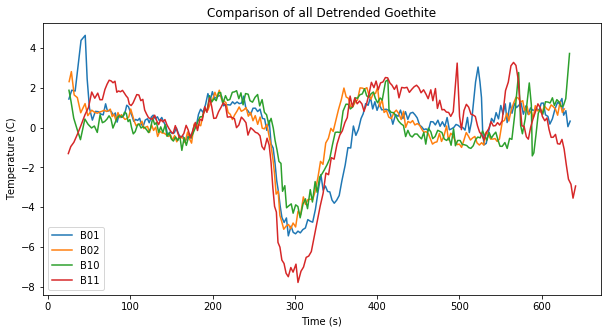

In [118]:
plt.figure(figsize = (10,5))

plt.plot(goeth_det['g_B01'], goeth_det['d_rg_B01'], label = 'B01')
plt.plot(goeth_det['g_B02'], goeth_det['d_rg_B02'], label = 'B02')
plt.plot(goeth_det['g_B10'], goeth_det['d_rg_B10'], label = 'B10')
plt.plot(goeth_det['g_B11'], goeth_det['d_rg_B11'], label = 'B11')
plt.xlabel('Time (s)')
plt.ylabel('Temperature (C)')
plt.legend()
plt.title('Comparison of all Detrended Goethite')

Text(0.5, 1.0, 'Goethite DTA from Walter 2001')

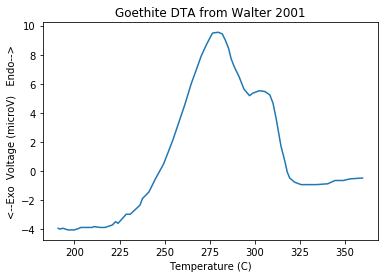

In [119]:
# bring in Walter data
Walter_goeth3 = pd.read_csv('DSC_runs/Geothite_graphc.csv', skiprows = 1, header = None, names = ['temp', 'volt'])

plt.plot(Walter_goeth3['temp'], Walter_goeth3['volt'])
plt.xlabel('Temperature (C)')
plt.ylabel('<--Exo  Voltage (microV)   Endo-->')
plt.title('Goethite DTA from Walter 2001')

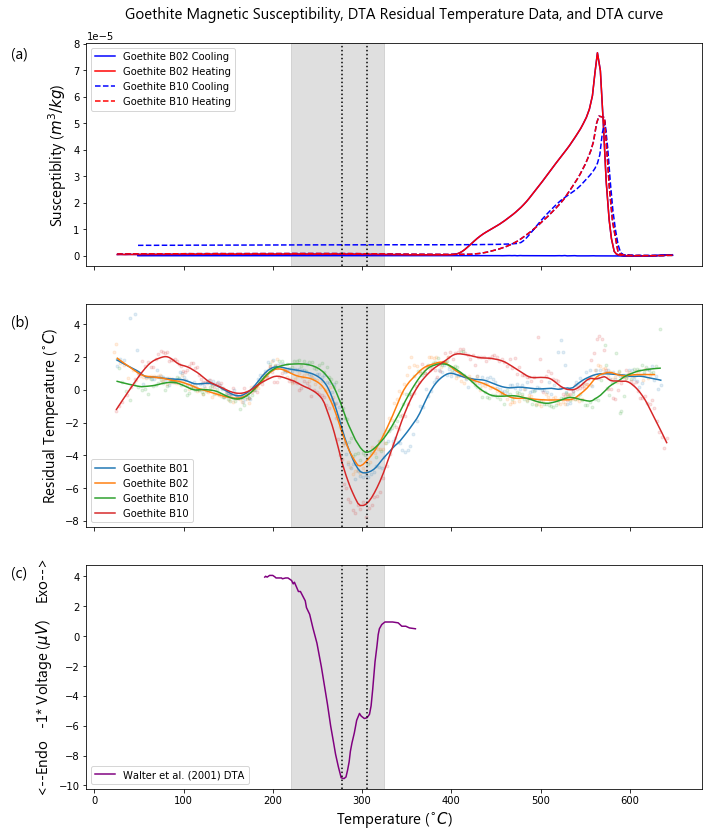

In [120]:
csfont = {'fontname':'Microsoft Tai Le', 'fontsize':15}

fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize = (10,12), sharex = True)

ax1.set_ylabel('Susceptiblity ($m^3/kg$)', **csfont)
ax1.plot(goeth_B02f['temp'], goeth_B02f['csusc'], 'b', label = 'Goethite B02 Cooling')
ax1.plot(goeth_B02['temp'], goeth_B02['csusc'], 'r', label = 'Goethite B02 Heating')
ax1.plot(goeth_B10f['temp'], goeth_B10f['csusc'], 'b--', label = 'Goethite B10 Cooling')
ax1.plot(goeth_B10['temp'], goeth_B10['csusc'], 'r--', label = 'Goethite B10 Heating')
ax1.axvline(278, color = 'black', linestyle = 'dotted')
ax1.axvline(305, color = 'black', linestyle = 'dotted')
ax1.axvspan(220, 325, color = 'grey', alpha = .25)
ax1.annotate('(a)', (0.015,.93), xycoords = 'figure fraction', **csfont)
ax1.ticklabel_format(axis = 'y', style = 'sci', scilimits = (0,0))
ax1.legend()

ax2.set_ylabel('Residual Temperature ($^{\circ}C$)', color = 'k', **csfont)
ax2.plot(goeth_det['g_B01'], goeth_det['d_rg_B01'], '.', color = 'tab:blue', alpha = .125, label = '_nolegend_')
ax2.plot(goeth_det['b_B02'], goeth_det['d_rg_B02'], '.', color = 'tab:orange', alpha = .125, label = '_nolegend_')
ax2.plot(goeth_det['g_B10'], goeth_det['d_rg_B10'], '.', color = 'tab:green', alpha = .125, label = '_nolegend_')
ax2.plot(goeth_det['g_B11'], goeth_det['d_rg_B11'], '.', color = 'tab:red', alpha = .125, label = '_nolegend_')

ax2.plot(goeth_det['g_B01'], goeth_det['loess_d_rg_B01'], '-', color = 'tab:blue', label = 'Goethite B01')
ax2.plot(goeth_det['g_B02'], goeth_det['loess_d_rg_B02'], '-', color = 'tab:orange', label = 'Goethite B02')
ax2.plot(goeth_det['g_B10'], goeth_det['loess_d_rg_B10'], '-', color = 'tab:green', label = 'Goethite B10')
ax2.plot(goeth_det['g_B11'], goeth_det['loess_d_rg_B11'], '-', color = 'tab:red', label = 'Goethite B10')

ax2.axvline(278, color = 'black', linestyle = 'dotted')
ax2.axvline(305, color = 'black', linestyle = 'dotted')
ax2.axvspan(220, 325, color = 'grey', alpha = .25)
ax2.annotate('(b)', (0.015,.61), xycoords = 'figure fraction', **csfont)
ax2.legend()
#ax1.tick_params(axis='y', labelcolor=color)


ax3.set_ylabel('<--Endo   -1* Voltage ($\mu V$)    Exo-->', **csfont)  # we already handled the x-label with ax1
ax3.plot(Walter_goeth3['temp'], -Walter_goeth3['volt'], color = 'purple', label = 'Walter et al. (2001) DTA')
ax3.axvline(278, color = 'black', linestyle = 'dotted')
ax3.axvline(305, color = 'black', linestyle = 'dotted')
ax3.axvspan(220, 325, color = 'grey', alpha = .25)
ax3.set_xlabel('Temperature ($^{\circ}C$)', **csfont)
ax3.annotate('(c)', (0.015,.31), xycoords = 'figure fraction', **csfont)
ax3.legend(loc = 3)

ax1.set_title('Goethite Magnetic Susceptibility, DTA Residual Temperature Data, and DTA curve', y = 1.08, **csfont)


fig.tight_layout()  # otherwise the right y-label is slightly clipped
plt.show()

#fig.savefig('goethite_results_allanalysis_sm')

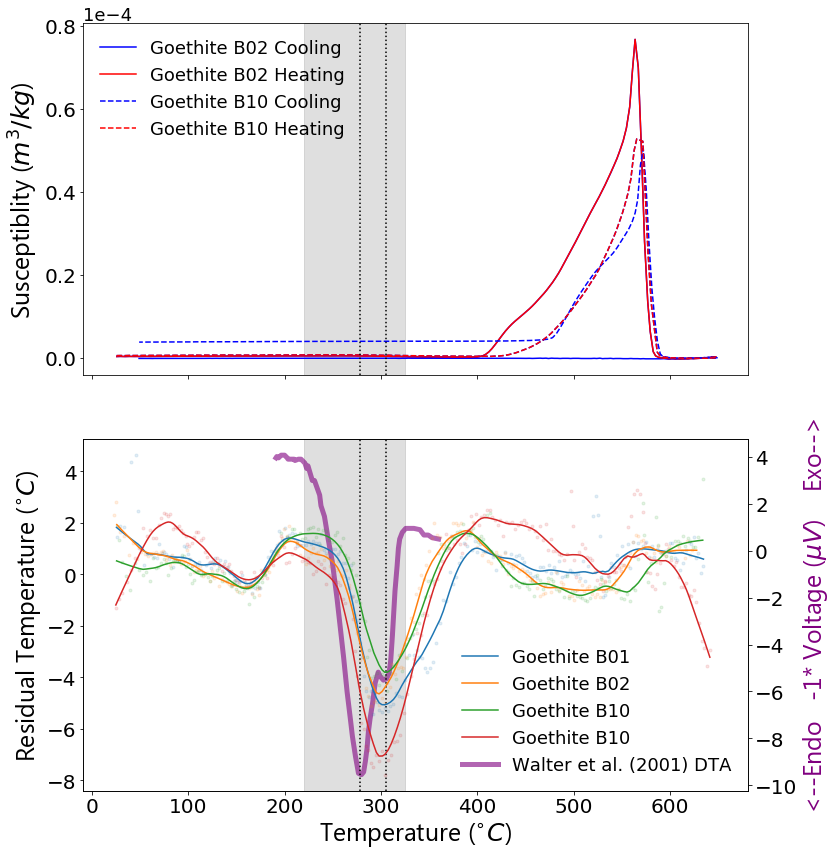

In [121]:
csfont = {'fontname':'Microsoft Tai Le', 'fontsize':25}

fig, (ax1, ax2) = plt.subplots(2, 1, figsize = (12,12), sharex = True)

# susceptibility
ax1.set_ylabel('Susceptiblity ($m^3/kg$)', **csfont)
p1 = ax1.plot(goeth_B02f['temp'], goeth_B02f['csusc'], 'b', label = 'Goethite B02 Cooling')
p2 = ax1.plot(goeth_B02['temp'], goeth_B02['csusc'], 'r', label = 'Goethite B02 Heating')
p3 = ax1.plot(goeth_B10f['temp'], goeth_B10f['csusc'], 'b--', label = 'Goethite B10 Cooling')
p4 = ax1.plot(goeth_B10['temp'], goeth_B10['csusc'], 'r--', label = 'Goethite B10 Heating')
ax1.axvline(278, color = 'black', linestyle = 'dotted')
ax1.axvline(305, color = 'black', linestyle = 'dotted')
ax1.axvspan(220, 325, color = 'grey', alpha = .25)
#ax1.annotate('(a)', (0.015,.93), xycoords = 'figure fraction', **csfont)
ax1.ticklabel_format(axis = 'y', style = 'sci', scilimits = (0,0))
ax1.tick_params(axis='y', which='major', labelsize=20)
ax1.yaxis.offsetText.set_fontsize(18)
ax1.legend(prop={'size': 18}, frameon = False)


# kDTA
ax2.set_zorder(10)
ax2.patch.set_visible(False)

ax2.set_xlabel('Temperature ($^{\circ}C$)', **csfont)
ax2.set_ylabel('Residual Temperature ($^{\circ}C$)', color = 'k', **csfont)
ax2.tick_params(axis='both', which='major', labelsize=20)
ax2.plot(goeth_det['g_B01'], goeth_det['d_rg_B01'], '.', color = 'tab:blue', alpha = .125, label = '_nolegend_')
ax2.plot(goeth_det['b_B02'], goeth_det['d_rg_B02'], '.', color = 'tab:orange', alpha = .125, label = '_nolegend_')
ax2.plot(goeth_det['g_B10'], goeth_det['d_rg_B10'], '.', color = 'tab:green', alpha = .125, label = '_nolegend_')
ax2.plot(goeth_det['g_B11'], goeth_det['d_rg_B11'], '.', color = 'tab:red', alpha = .125, label = '_nolegend_')

ax2.plot(goeth_det['g_B01'], goeth_det['loess_d_rg_B01'], '-', color = 'tab:blue', label = 'Goethite B01')
ax2.plot(goeth_det['g_B02'], goeth_det['loess_d_rg_B02'], '-', color = 'tab:orange', label = 'Goethite B02')
ax2.plot(goeth_det['g_B10'], goeth_det['loess_d_rg_B10'], '-', color = 'tab:green', label = 'Goethite B10')
ax2.plot(goeth_det['g_B11'], goeth_det['loess_d_rg_B11'], '-', color = 'tab:red', label = 'Goethite B10')

ax2.plot([], [], color = 'purple', linewidth = 5, alpha = .6, label = 'Walter et al. (2001) DTA')

#ax2.annotate('(b)', (0.015,.61), xycoords = 'figure fraction', **csfont)
ax2.legend(loc = 4, prop={'size': 18}, frameon = False)
#ax1.tick_params(axis='y', labelcolor=color)



# Walter
ax3 = ax2.twinx()

ax3.set_ylabel('<--Endo   -1* Voltage ($\mu V$)    Exo-->', **csfont, color = 'purple')  # we already handled the x-label with ax1
ax3.tick_params(axis='y', which='major', labelsize=20)
ax3.plot(Walter_goeth3['temp'], -Walter_goeth3['volt'], color = 'purple', linewidth = 5, alpha = .6, label = 'Walter et al. (2001) DTA')
ax3.axvline(278, color = 'black', linestyle = 'dotted')
ax3.axvline(305, color = 'black', linestyle = 'dotted')
ax3.axvspan(220, 325, color = 'grey', alpha = .25)


#ax1.set_title('Goethite Magnetic Susceptibility, DTA Residual Temperature Data, and DTA curve', y = 1.08, **csfont)


fig.tight_layout()  # otherwise the right y-label is slightly clipped
plt.show()

#fig.savefig('goethite_results_allanalysis_diplot', dpi = 300, bbox_inches = 'tight')

In [122]:
# calculate area under the curve

def baseline_riemann(t, tb, te, Tb, Te):
    T = (((Te-Tb)/(te-tb))*(t - tb)) + Tb
    return(T)

def riemann_left(r_data, time, temp, b, e):
    tb = r_data[time][b]
    te = r_data[time][e]
    Tb = r_data[temp][b]
    Te = r_data[temp][e]
    
    
    area = 0
    for i in range(b,e):
        base = r_data[time][i+1]-r_data[time][i]
        height = r_data[temp][i]-baseline_riemann(r_data[time][i], tb, te, Tb, Te)
        area = area + (base*height)
    
    return(area)

# redone for smoothed
# B01
b_B01 = 66
e_B01 = 134

area_B01 = riemann_left(goeth_det, 'g_B01', 'loess_d_rg_B01', b_B01, e_B01)

# B02
b_B02 = 68
e_B02 = 132

area_B02 = riemann_left(goeth_det, 'g_B02', 'loess_d_rg_B02', b_B02, e_B02)

# B10
b_B10 = 76
e_B10 = 132

area_B10 = riemann_left(goeth_det, 'g_B10', 'loess_d_rg_B10', b_B10, e_B10)

# B11
b_B11 = 67
e_B11 = 135

area_B11 = riemann_left(goeth_det, 'g_B11', 'loess_d_rg_B11', b_B11, e_B11)

Text(0.5, 1.0, 'Comparison of all Detrended Goethite')

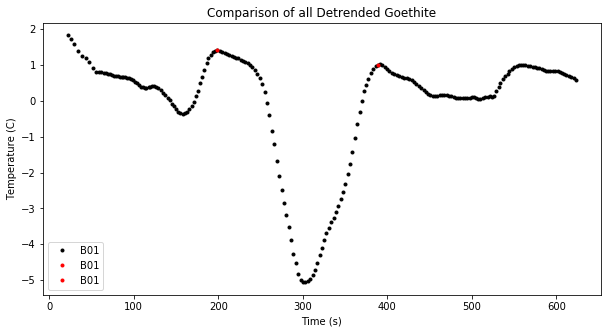

In [123]:
plt.figure(figsize = (10,5))

b = 66
e = 134

# to comment, Ctrl + /

plt.plot(goeth_det['b_B01'], goeth_det['loess_d_rg_B01'], 'k.', label = 'B01')
plt.plot(goeth_det['b_B01'][b], goeth_det['loess_d_rg_B01'][b], 'r.', label = 'B01')
plt.plot(goeth_det['b_B01'][e], goeth_det['loess_d_rg_B01'][e], 'r.', label = 'B01')

# plt.plot(goeth_det['b_B02'], goeth_det['loess_d_rg_B02'], 'k.', label = 'B02')
# plt.plot(goeth_det['b_B02'][b], goeth_det['loess_d_rg_B02'][b], 'r.', label = 'B02')
# plt.plot(goeth_det['b_B02'][e], goeth_det['loess_d_rg_B02'][e], 'r.', label = 'B02')

# plt.plot(goeth_det['b_B10'], goeth_det['loess_d_rg_B10'], 'k.', label = 'B10')
# plt.plot(goeth_det['b_B10'][b], goeth_det['loess_d_rg_B10'][b], 'r.', label = 'B10')
# plt.plot(goeth_det['b_B10'][e], goeth_det['loess_d_rg_B10'][e], 'r.', label = 'B10')

# plt.plot(goeth_det['b_B11'], goeth_det['loess_d_rg_B11'], 'k.', label = 'B11')
# plt.plot(goeth_det['b_B11'][b], goeth_det['loess_d_rg_B11'][b], 'r.', label = 'B11')
# plt.plot(goeth_det['b_B11'][e], goeth_det['loess_d_rg_B11'][e], 'r.', label = 'B11')

plt.xlabel('Time (s)')
plt.ylabel('Temperature (C)')
plt.legend()
plt.title('Comparison of all Detrended Goethite')

Text(0, 0.5, 'Residual Temperature (C)')

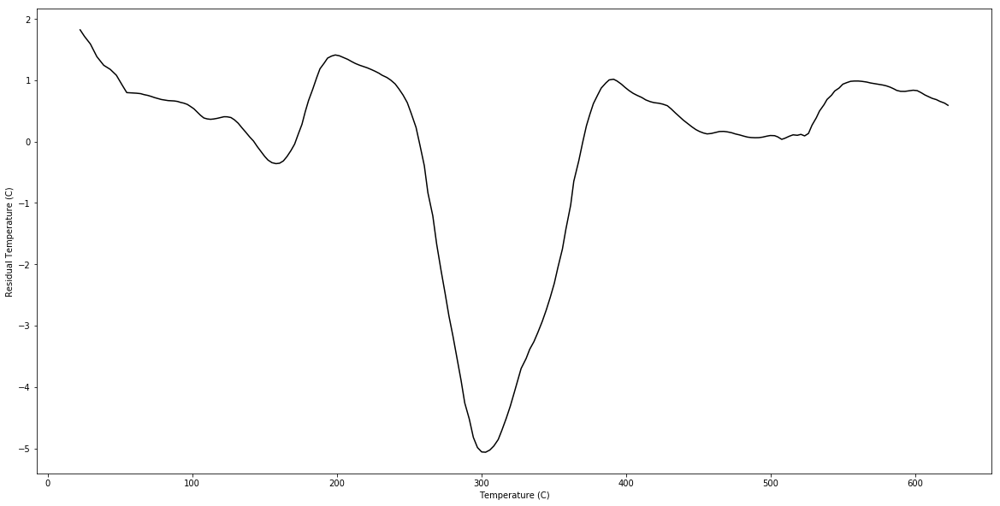

In [124]:
plt.figure(figsize = (20,10))
plt.plot(goeth_det['b_B01'], goeth_det['loess_d_rg_B01'], 'k-', label = 'B01')
plt.xlabel('Temperature (C)')
plt.ylabel('Residual Temperature (C)')

Rough values: 
B01 - 67-132
B02 - 68-122
B10 - 84-130
B11 - 70-122

Smooth values:
B01 - 66-134 (80-134?) (66-134)
B02 - 68-132 (80-125)  (68-132)
B10 - 76-132 (79-132)  (76-132)
B11 - 82-126 (67-126?) (67-135)

## goethite C

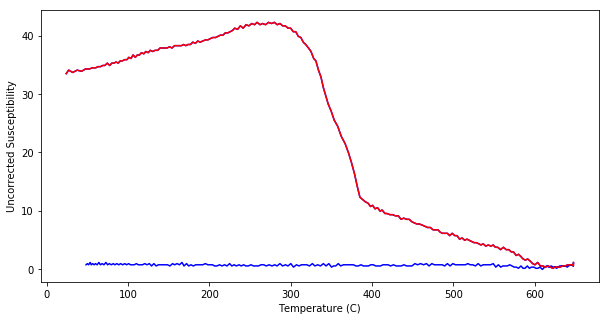

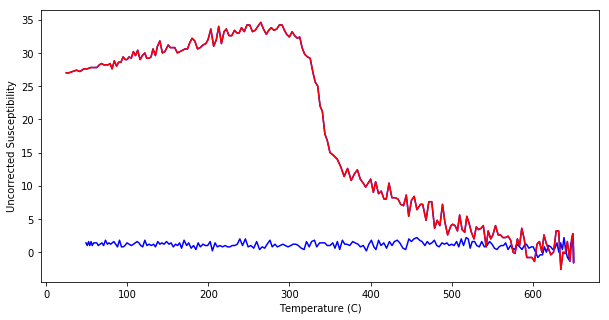

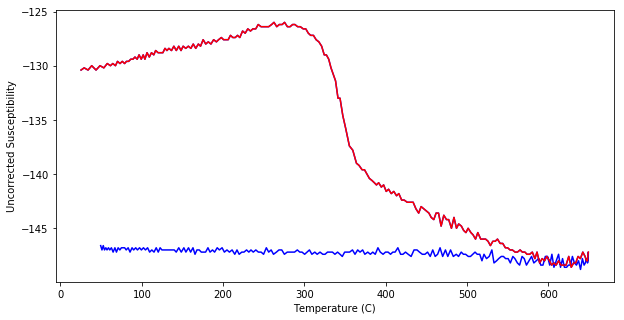

In [125]:
# get blank
Tube_B13 = getminlog(5900, return_full = False, susplot = False)
Tube_B14 = getminlog(5906, return_full = False, susplot = False)
Tube_B15 = getminlog(5914, return_full = False, susplot = False)


# get goethite
goeth_C02 = getminlog(5901, return_full = False, susplot = True)
goeth_C03 = getminlog(5907, return_full = False, susplot = True)
goeth_C05 = getminlog(5915, return_full = False, susplot = True)

In [126]:
# time vector
t = np.arange(0,3450,15)

# linear interpolate each and write in terms of t

int_B13 = interp1d(Tube_B13['time'][:-5], Tube_B13['temp'][:-5], kind = 'linear', bounds_error = False)
b_B13 = int_B13(t)

int_B14 = interp1d(Tube_B14['time'][:-5], Tube_B14['temp'][:-5], kind = 'linear', bounds_error = False)
b_B14 = int_B14(t)

int_B15 = interp1d(Tube_B15['time'][:-5], Tube_B15['temp'][:-5], kind = 'linear', bounds_error = False)
b_B15 = int_B15(t)


int_gC02 = interp1d(goeth_C02['time'][:-5], goeth_C02['temp'][:-5], kind = 'linear', bounds_error = False)
g_C02 = int_gC02(t)

int_gC03 = interp1d(goeth_C03['time'][:-5], goeth_C03['temp'][:-5], kind = 'linear', bounds_error = False)
g_C03 = int_gC03(t)

int_gC05 = interp1d(goeth_C05['time'][:-5], goeth_C05['temp'][:-5], kind = 'linear', bounds_error = False)
g_C05 = int_gC05(t)

In [127]:
goeth_df['b_B13'] = b_B13
goeth_df['b_B14'] = b_B14
goeth_df['b_B15'] = b_B15

goeth_df['g_C02'] = g_C02
goeth_df['g_C03'] = g_C03
goeth_df['g_C05'] = g_C05


In [128]:
# start with same data frame
goethC_det = goeth_df[['time', 'b_B13', 'b_B14', 'b_B15', 'g_C02', 'g_C03', 'g_C05']].copy()

# calc residuals
goethC_det['rg_C02'] = goethC_det['g_C02']-goethC_det['b_B13']
goethC_det['rg_C03'] = goethC_det['g_C03']-goethC_det['b_B14']
goethC_det['rg_C05'] = goethC_det['g_C05']-goethC_det['b_B15']
                      
goethC_det.dropna(inplace = True)

# best fit line
fit_gC02 = np.polyfit(goethC_det['g_C02'], goethC_det['rg_C02'],1)
goethC_det['d_rg_C02'] = goethC_det['rg_C02'] - (fit_gC02[0]*goethC_det['g_C02']+fit_gC02[1])

fit_gC03 = np.polyfit(goethC_det['g_C03'], goethC_det['rg_C03'],1)
goethC_det['d_rg_C03'] = goethC_det['rg_C03'] - (fit_gC03[0]*goethC_det['g_C03']+fit_gC03[1])
                      
fit_gC05 = np.polyfit(goethC_det['g_C05'], goethC_det['rg_C05'],1)
goethC_det['d_rg_C05'] = goethC_det['rg_C05'] - (fit_gC05[0]*goethC_det['g_C05']+fit_gC05[1])

Text(0.5, 1.0, 'Comparison of all Detrended Goethite')

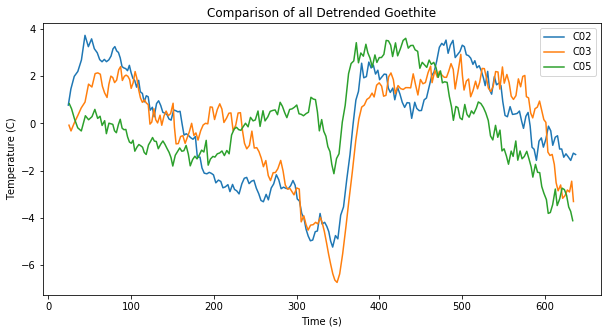

In [129]:
plt.figure(figsize = (10,5))

plt.plot(goethC_det['g_C02'], goethC_det['d_rg_C02'], label = 'C02')
plt.plot(goethC_det['g_C03'], goethC_det['d_rg_C03'], label = 'C03')
plt.plot(goethC_det['g_C05'], goethC_det['d_rg_C05'], label = 'C05')
plt.xlabel('Time (s)')
plt.ylabel('Temperature (C)')
plt.legend()
plt.title('Comparison of all Detrended Goethite')

Text(0.5, 1.0, 'Comparison of all Detrended Goethite')

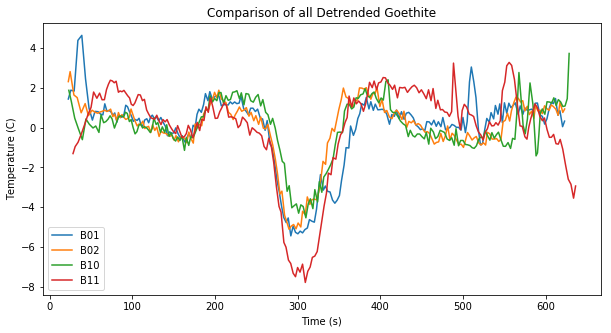

In [130]:
plt.figure(figsize = (10,5))

plt.plot(goeth_det['b_B01'], goeth_det['d_rg_B01'], label = 'B01')
plt.plot(goeth_det['b_B02'], goeth_det['d_rg_B02'], label = 'B02')
plt.plot(goeth_det['b_B10'], goeth_det['d_rg_B10'], label = 'B10')
plt.plot(goeth_det['b_B11'], goeth_det['d_rg_B11'], label = 'B11')
plt.xlabel('Time (s)')
plt.ylabel('Temperature (C)')
plt.legend()
plt.title('Comparison of all Detrended Goethite')

In [131]:
# smooth other goethite
goethC_det['loess_d_rg_C02'] = sm.nonparametric.lowess(goethC_det['d_rg_C02'], goethC_det['g_C02'], frac = .08, return_sorted = False)
goethC_det['loess_d_rg_C03'] = sm.nonparametric.lowess(goethC_det['d_rg_C03'], goethC_det['g_C03'], frac = .08, return_sorted = False)
goethC_det['loess_d_rg_C05'] = sm.nonparametric.lowess(goethC_det['d_rg_C05'], goethC_det['g_C05'], frac = .08, return_sorted = False)

In [132]:
Walter_goeth2 = pd.read_csv('DSC_runs/Geothite_graphb.csv', skiprows = 1, header = None, names = ['temp', 'volt'])

Text(0.5, 1.0, 'Goethite DTA from Walter 2001')

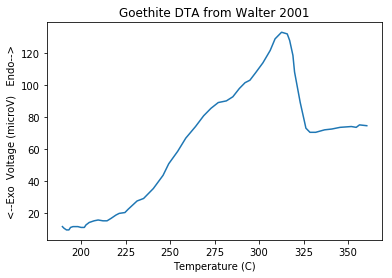

In [133]:
plt.plot(Walter_goeth2['temp'], Walter_goeth2['volt'])
plt.xlabel('Temperature (C)')
plt.ylabel('<--Exo  Voltage (microV)   Endo-->')
plt.title('Goethite DTA from Walter 2001')

In [134]:
Walter_goeth1 = pd.read_csv('DSC_runs/Geothite_grapha.csv', skiprows = 1, header = None, names = ['temp', 'volt'])

Text(0.5, 1.0, 'Goethite DTA from Walter 2001')

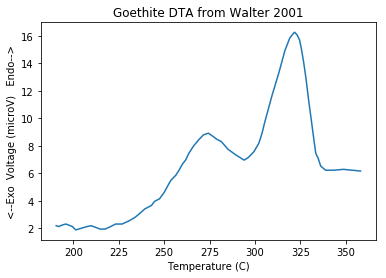

In [135]:
plt.plot(Walter_goeth1['temp'], Walter_goeth1['volt'])
plt.xlabel('Temperature (C)')
plt.ylabel('<--Exo  Voltage (microV)   Endo-->')
plt.title('Goethite DTA from Walter 2001')

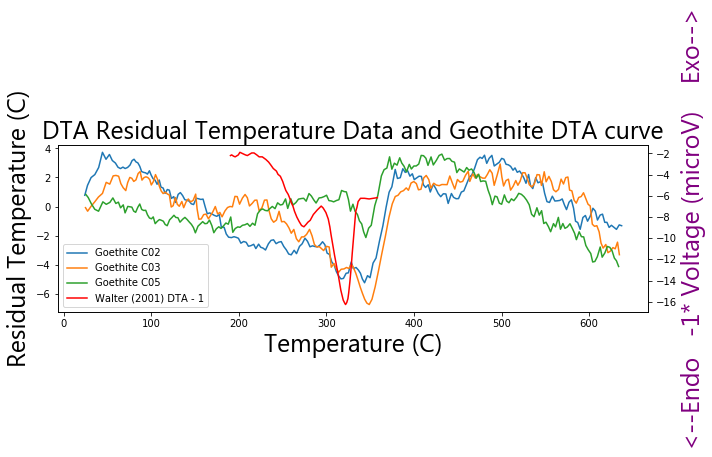

In [136]:
#csfont = {'fontname':'Georgia', 'fontsize':15}

fig, ax1 = plt.subplots(figsize = (10,5))

ax1.set_xlabel('Temperature (C)', **csfont)
ax1.set_ylabel('Residual Temperature (C)', color = 'k', **csfont)
ax1.plot(goethC_det['g_C02'], goethC_det['d_rg_C02'], label = 'Goethite C02')
ax1.plot(goethC_det['g_C03'], goethC_det['d_rg_C03'], label = 'Goethite C03')
ax1.plot(goethC_det['g_C05'], goethC_det['d_rg_C05'], label = 'Goethite C05')
#ax1.tick_params(axis='y', labelcolor=color)

ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis

ax2.set_ylabel('<--Endo   -1* Voltage (microV)    Exo-->', color='purple', **csfont)  # we already handled the x-label with ax1
#ax2.plot(Walter_goeth2['temp'], -Walter_goeth2['volt'], color = 'purple', label = 'Walter (2001) DTA - 2')
ax2.plot(Walter_goeth1['temp'], -Walter_goeth1['volt'], color = 'red', label = 'Walter (2001) DTA - 1')
#ax1.plot([],[], color = 'purple', label = 'Walter (2001) DTA - 2')
ax1.plot([],[], color = 'red', label = 'Walter (2001) DTA - 1')

#ax2.tick_params(axis='y', labelcolor=color)

ax1.set_title('DTA Residual Temperature Data and Geothite DTA curve', **csfont)
ax1.legend()


fig.tight_layout()  # otherwise the right y-label is slightly clipped
plt.show()

Text(0.5, 1.0, 'Comparison of all Detrended Goethite')

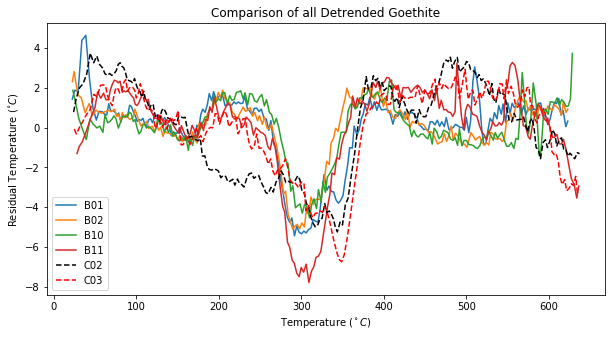

In [137]:
plt.figure(figsize = (10,5))

plt.plot(goeth_det['b_B01'], goeth_det['d_rg_B01'], label = 'B01')
plt.plot(goeth_det['b_B02'], goeth_det['d_rg_B02'], label = 'B02')
plt.plot(goeth_det['b_B10'], goeth_det['d_rg_B10'], label = 'B10')
plt.plot(goeth_det['b_B11'], goeth_det['d_rg_B11'], label = 'B11')
plt.plot(goethC_det['g_C02'], goethC_det['d_rg_C02'], 'k--', label = 'C02')
plt.plot(goethC_det['g_C03'], goethC_det['d_rg_C03'], 'r--', label = 'C03')
plt.xlabel('Temperature ($^\circ C$)')
plt.ylabel('Residual Temperature ($^{\circ}C$)')
plt.legend()
plt.title('Comparison of all Detrended Goethite')

Text(0.5, 1.0, 'Heating rate analysis comparison of two grain sizes of goethite')

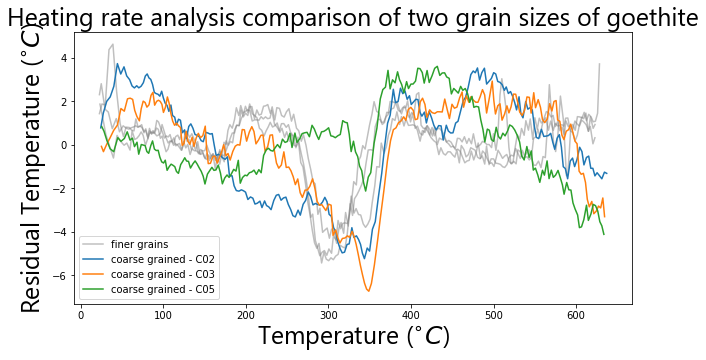

In [138]:
plt.figure(figsize = (10,5))

plt.plot(goeth_det['b_B01'], goeth_det['d_rg_B01'], label = 'finer grains', color = 'grey', alpha = .5)
plt.plot(goeth_det['b_B02'], goeth_det['d_rg_B02'], label = '_nolegend_', color = 'grey', alpha = .5)
plt.plot(goeth_det['b_B10'], goeth_det['d_rg_B10'], label = '_nolegend_', color = 'grey', alpha = .5)
#plt.plot(goeth_det['b_B11'], goeth_det['d_rg_B11'], label = '_nolegend_', color = 'grey', alpha = .5)
plt.plot(goethC_det['g_C02'], goethC_det['d_rg_C02'], label = 'coarse grained - C02')
plt.plot(goethC_det['g_C03'], goethC_det['d_rg_C03'], label = 'coarse grained - C03')
plt.plot(goethC_det['g_C05'], goethC_det['d_rg_C05'], label = 'coarse grained - C05')
plt.xlabel('Temperature ($^{\circ}C$)', **csfont)
plt.ylabel('Residual Temperature ($^{\circ}C$)', **csfont)
plt.legend()
plt.title('Heating rate analysis comparison of two grain sizes of goethite', **csfont)

#plt.savefig('goeth_size_dep')

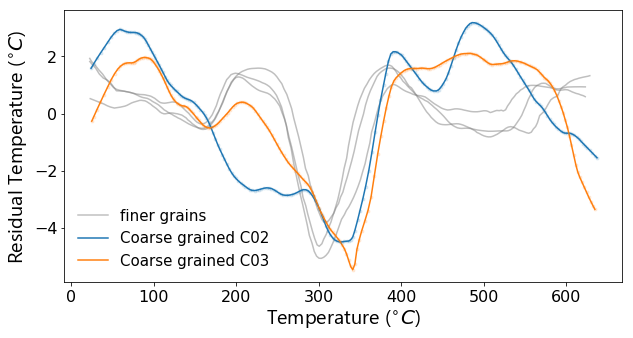

In [277]:
csfont = {'fontname':'Microsoft Tai Le', 'fontsize':20}


plt.figure(figsize = (10,5))

plt.plot(goeth_det['b_B01'], goeth_det['loess_d_rg_B01'], label = 'finer grains', color = 'grey', alpha = .5)
plt.plot(goeth_det['b_B02'], goeth_det['loess_d_rg_B02'], label = '_nolegend_', color = 'grey', alpha = .5)
plt.plot(goeth_det['b_B10'], goeth_det['loess_d_rg_B10'], label = '_nolegend_', color = 'grey', alpha = .5)
#plt.plot(goeth_det['b_B11'], goeth_det['d_rg_B11'], label = '_nolegend_', color = 'grey', alpha = .5)
plt.plot(goethC_det['g_C02'], goethC_det['loess_d_rg_C02'], '-', color = 'tab:blue', label = 'Coarse grained C02')
plt.plot(goethC_det['g_C03'], goethC_det['loess_d_rg_C03'], '-', color = 'tab:orange', label = 'Coarse grained C03')

plt.plot(goethC_det['g_C02'], goethC_det['loess_d_rg_C02'], '.', color = 'tab:blue', alpha = .125, label = '_nolegend_')
plt.plot(goethC_det['g_C03'], goethC_det['loess_d_rg_C03'], '.', color = 'tab:orange', alpha = .125, label = '_nolegend_')
#plt.plot(goethC_det['g_C05'], goethC_det['loess_d_rg_C05'], label = 'coarse grained - C05')
plt.xlabel('Temperature ($^{\circ}C$)', **csfont)
plt.ylabel('Residual Temperature ($^{\circ}C$)', **csfont)
plt.tick_params(axis='both', which='major', labelsize=16)
plt.legend(prop={'size': 15}, frameon = False)
#plt.title('Heating rate analysis comparison of two grain sizes of goethite', **csfont)

#plt.savefig('goeth_size_dep_sm', dpi = 300)

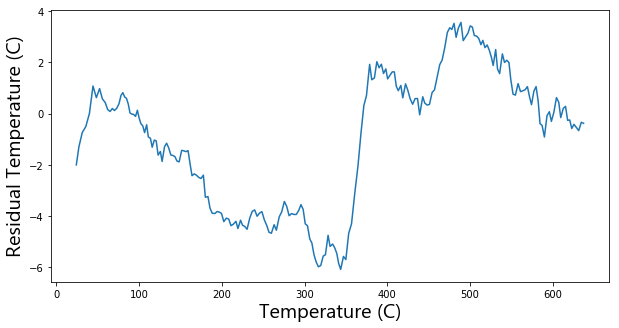

In [140]:
fig, ax1 = plt.subplots(figsize = (10,5))

ax1.set_xlabel('Temperature (C)', **csfont)
ax1.set_ylabel('Residual Temperature (C)', color = 'k', **csfont)
ax1.plot(goethC_det['g_C02'], goethC_det['rg_C02'], label = 'Goethite C02')
#ax1.plot(goethC_det['g_C03'], goethC_det['rg_C03'], label = 'Goethite C03')

## Vivianite

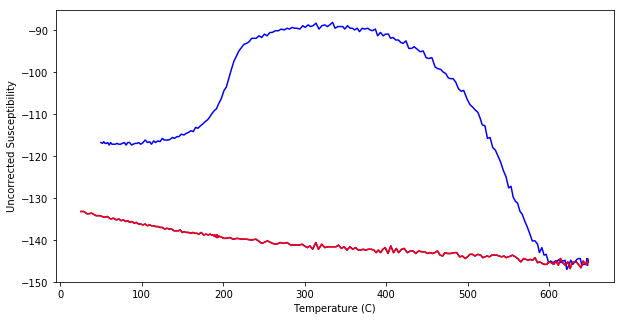

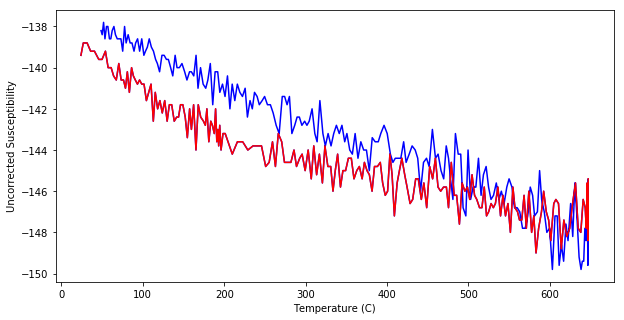

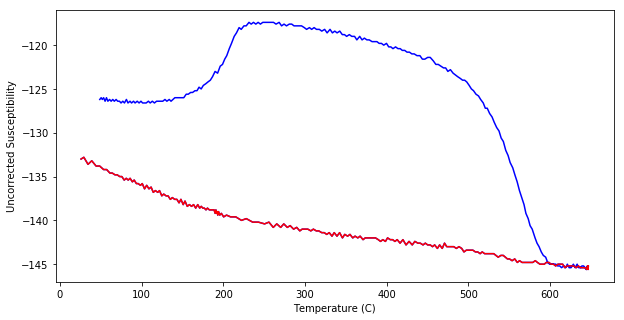

In [141]:
# get blank
Tube_D01 = getminlog(5902, return_full = False, susplot = False)
Tube_D02 = getminlog(5904, return_full = False, susplot = False)
Tube_D03 = getminlog(5912, return_full = False, susplot = False)


# get goethite
vivian_A01 = getminlog(5903, return_full = False, susplot = True)
vivian_A02 = getminlog(5905, return_full = False, susplot = True)
vivian_A03, vivian_A03f = getminlog(5913, return_full = True, susplot = True)

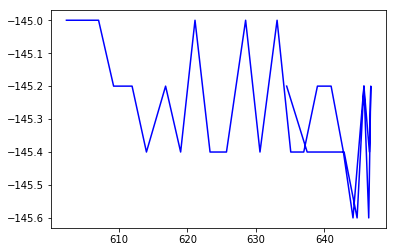

In [142]:
plt.plot(vivian_A03f['temp'][200:230], vivian_A03f['susc'][200:230], 'b')

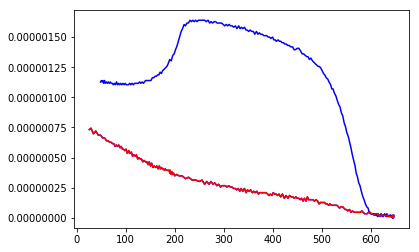

In [143]:
# correct susceptibility measurements to be in [m3/kg]
vivian_A03f['csusc'] = (vivian_A03f['susc']+145.6)*(1e-5)/(MinKey[5913].loc['Specimen_mass[g]']*1000)
vivian_A03['csusc'] = (vivian_A03['susc']+145.6)*(1e-5)/(MinKey[5913].loc['Specimen_mass[g]']*1000)

plt.plot(vivian_A03f['temp'], vivian_A03f['csusc'], 'b')
plt.plot(vivian_A03['temp'], vivian_A03['csusc'], 'r')

Text(0, 0.5, 'Susceptibility (1/kg)')

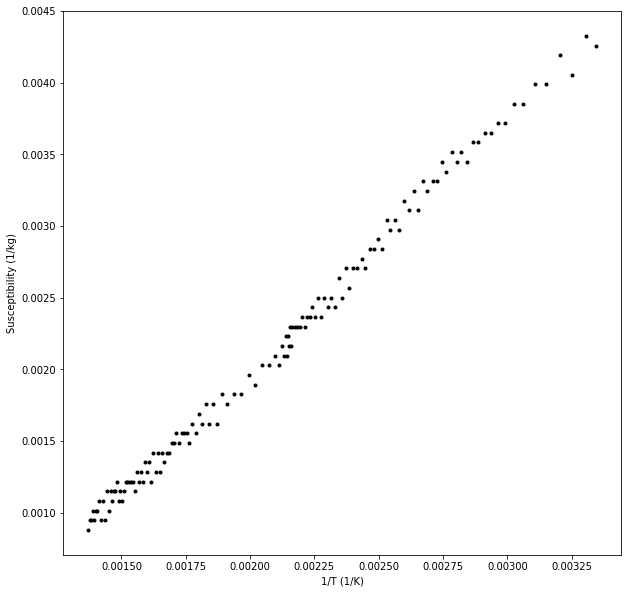

In [144]:
plt.figure(figsize = (10, 10))
plt.plot(1/(vivian_A03['temp'][:-70]+273.15), vivian_A03['csusc'][:-70]*1000/(MinKey[5913].loc['Specimen_mass[g]']), 'k.')
plt.xlabel('1/T (1/K)')
plt.ylabel('Susceptibility (1/kg)')

Text(0, 0.5, 'Susceptibility (1/kg)')

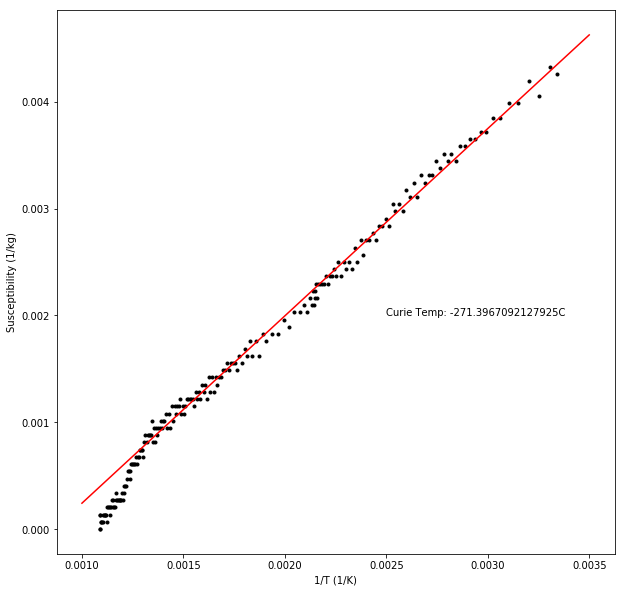

In [145]:
vivian_curie_fit = np.polyfit(1/(vivian_A03['temp'][:-70]+273.15), vivian_A03['csusc'][:-70]*1000/(MinKey[5913].loc['Specimen_mass[g]']),1)
plt.figure(figsize = (10, 10))
plt.plot(1/(vivian_A03['temp']+273.15), vivian_A03['csusc']*1000/(MinKey[5913].loc['Specimen_mass[g]']), 'k.')
plt.plot(np.arange(.001,.004, .0005), vivian_curie_fit[0]*np.arange(.001,.004, .0005)+ vivian_curie_fit[1], 'r-')
plt.annotate('Curie Temp: ' + str(vivian_curie_fit[0]-273.15) + 'C', (.0025, .002))
plt.xlabel('1/T (1/K)')
plt.ylabel('Susceptibility (1/kg)')

Text(0, 0.5, 'Temperature (C)')

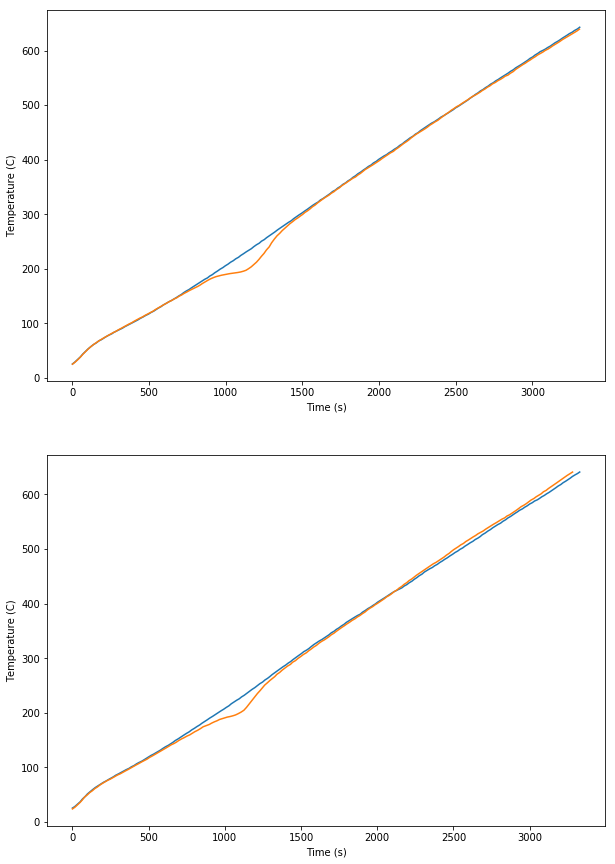

In [146]:
plt.figure(figsize = (10, 15))

plt.subplot(211)
plt.plot(Tube_D01['time'][:-5], Tube_D01['temp'][:-5])
plt.plot(vivian_A01['time'][:-5], vivian_A01['temp'][:-5])
plt.xlabel('Time (s)')
plt.ylabel('Temperature (C)')

plt.subplot(212)
plt.plot(Tube_D02['time'][:-5], Tube_D02['temp'][:-5])
plt.plot(vivian_A02['time'][:-5], vivian_A02['temp'][:-5])
plt.xlabel('Time (s)')
plt.ylabel('Temperature (C)')


In [147]:
# time vector
t = np.arange(0,3450,15)

# linear interpolate each and write in terms of t

int_D01 = interp1d(Tube_D01['time'][:-5], Tube_D01['temp'][:-5], kind = 'linear', bounds_error = False)
b_D01 = int_D01(t)

int_D02 = interp1d(Tube_D02['time'][:-5], Tube_D02['temp'][:-5], kind = 'linear', bounds_error = False)
b_D02 = int_D02(t)

int_D03 = interp1d(Tube_D03['time'][:-5], Tube_D03['temp'][:-5], kind = 'linear', bounds_error = False)
b_D03 = int_D03(t)


int_vA01 = interp1d(vivian_A01['time'][:-5], vivian_A01['temp'][:-5], kind = 'linear', bounds_error = False)
v_A01 = int_vA01(t)

int_vA02 = interp1d(vivian_A02['time'][:-5], vivian_A02['temp'][:-5], kind = 'linear', bounds_error = False)
v_A02 = int_vA02(t)

int_vA03 = interp1d(vivian_A03['time'][:-5], vivian_A03['temp'][:-5], kind = 'linear', bounds_error = False)
v_A03 = int_vA03(t)

In [148]:
vivian_df = pd.DataFrame({'time':t, 'b_D01': b_D01, 'b_D02': b_D02, 'b_D03': b_D03, 'v_A01': v_A01, 'v_A02': v_A02, 'v_A03': v_A03})

In [149]:
# start with same data frame
vivian_det = vivian_df.copy()

# calc residuals
vivian_det['rv_A01'] = vivian_det['v_A01']-vivian_det['b_D01']
vivian_det['rv_A02'] = vivian_det['v_A02']-vivian_det['b_D02']
vivian_det['rv_A03'] = vivian_det['v_A03']-vivian_det['b_D03']

vivian_det.dropna(inplace = True)

# best fit line
#fit_vA01 = np.polyfit(vivian_det['v_A01'], vivian_det['rv_A01'],1)
#vivian_det['d_rv_A01'] = vivian_det['rv_A01'] - (fit_vA01[0]*vivian_det['v_A01']+fit_vA01[1])

#fit_vA02 = np.polyfit(vivian_det['v_A02'], vivian_det['rv_A02'],1)
#vivian_det['d_rv_A02'] = vivian_det['rv_A02'] - (fit_vA02[0]*vivian_det['v_A02']+fit_vA02[1])

Text(0.5, 1.0, 'Comparison of all Vivianite (not detrended)')

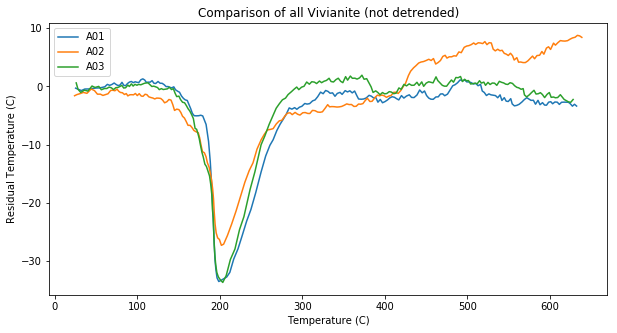

In [150]:
plt.figure(figsize = (10,5))

plt.plot(vivian_det['v_A01'], vivian_det['rv_A01'], label = 'A01')
plt.plot(vivian_det['v_A02'], vivian_det['rv_A02'], label = 'A02')
plt.plot(vivian_det['v_A03'], vivian_det['rv_A03'], label = 'A03')
plt.xlabel('Temperature (C)')
plt.ylabel('Residual Temperature (C)')
plt.legend()
plt.title('Comparison of all Vivianite (not detrended)')

In [151]:
# smoothen with loess
vivian_det['loess_rv_A01'] = sm.nonparametric.lowess(vivian_det['rv_A01'], vivian_det['v_A01'], frac = .03, return_sorted = False)
vivian_det['loess_rv_A02'] = sm.nonparametric.lowess(vivian_det['rv_A02'], vivian_det['v_A02'], frac = .03, return_sorted = False)
vivian_det['loess_rv_A03'] = sm.nonparametric.lowess(vivian_det['rv_A03'], vivian_det['v_A03'], frac = .03, return_sorted = False)


Text(0.5, 1.0, 'Comparison of all Vivianite')

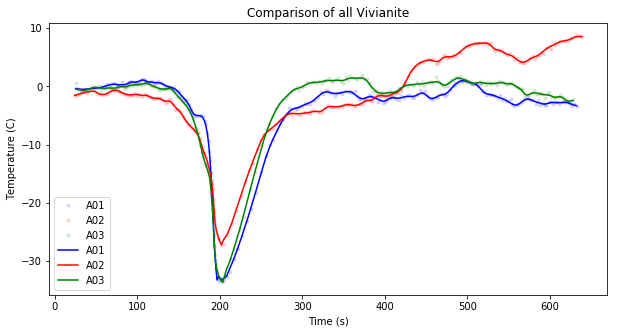

In [152]:
plt.figure(figsize = (10,5))

plt.plot(vivian_det['v_A01'], vivian_det['rv_A01'], 'b.', alpha = .125, label = 'A01')
plt.plot(vivian_det['v_A02'], vivian_det['rv_A02'], 'r.', alpha = .125, label = 'A02')
plt.plot(vivian_det['v_A03'], vivian_det['rv_A03'], 'g.', alpha = .125, label = 'A03')

plt.plot(vivian_det['v_A01'], vivian_det['loess_rv_A01'], 'b-', label = 'A01')
plt.plot(vivian_det['v_A02'], vivian_det['loess_rv_A02'], 'r-', label = 'A02')
plt.plot(vivian_det['v_A03'], vivian_det['loess_rv_A03'], 'g-', label = 'A03')

plt.xlabel('Time (s)')
plt.ylabel('Temperature (C)')
plt.legend()
plt.title('Comparison of all Vivianite')

In [153]:
Ogoro_vivian = pd.read_csv('DSC_runs/Vivianite_DSCair_Ogorodova.csv', skiprows = 1, header = None, names = ['temp', 'power'])

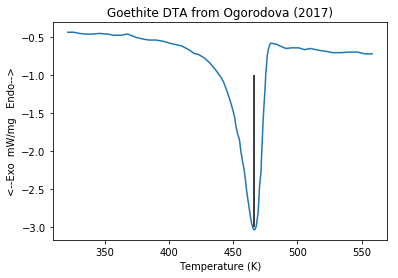

In [154]:
plt.plot(Ogoro_vivian['temp'], Ogoro_vivian['power'])
plt.xlabel('Temperature (K)')
plt.ylabel('<--Exo  mW/mg   Endo-->')
plt.title('Goethite DTA from Ogorodova (2017)')
plt.vlines(466, -3.0, -1)

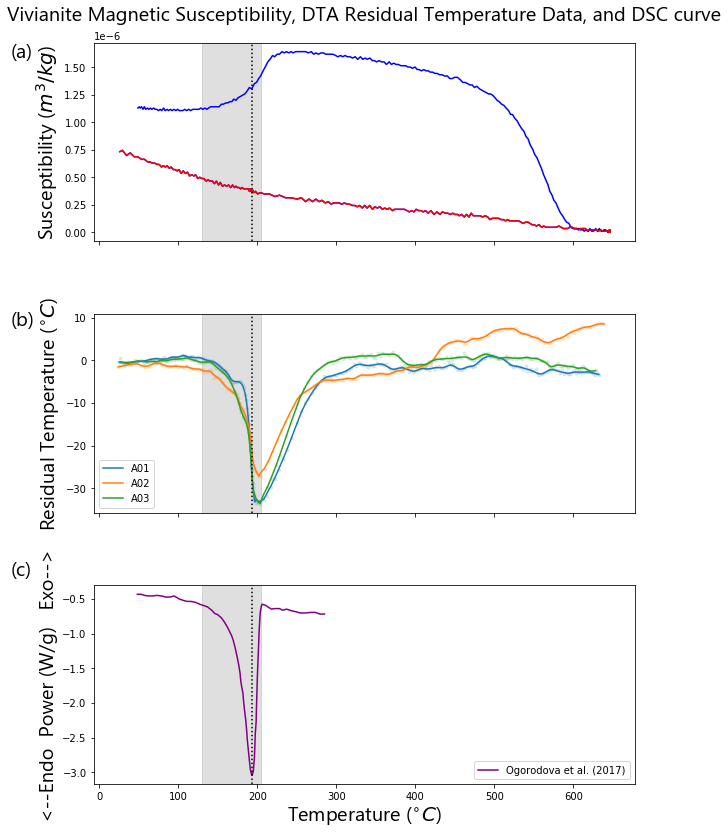

In [155]:
fig, (ax1,ax2,ax3) = plt.subplots(3,1,figsize = (10,12), sharex = True)

# Susceptibility
ax1.plot(vivian_A03f['temp'], vivian_A03f['csusc'], 'b')
ax1.plot(vivian_A03['temp'], vivian_A03['csusc'], 'r')
ax1.axvline(193, color = 'black', linestyle = 'dotted')
ax1.axvspan(130, 205, color = 'grey', alpha = .25)
ax1.set_ylabel('Susceptibility ($m^3/kg$)', **csfont)
ax1.ticklabel_format(axis = 'y', style = 'sci', scilimits = (0,0))
ax1.annotate('(a)', (0.015,.93), xycoords = 'figure fraction', **csfont)


# kDTA
ax2.set_ylabel('Residual Temperature ($^{\circ}C$)', color = 'k', **csfont)
ax2.plot(vivian_det['v_A01'], vivian_det['rv_A01'], '.', color = 'tab:blue', alpha = .125, label = '_nolegend_')
ax2.plot(vivian_det['v_A02'], vivian_det['rv_A02'], '.', color = 'tab:orange', alpha = .125, label = '_nolegend_')
ax2.plot(vivian_det['v_A03'], vivian_det['rv_A03'], '.', color = 'tab:green', alpha = .125, label = '_nolegend_')

ax2.plot(vivian_det['v_A01'], vivian_det['loess_rv_A01'], '-', color = 'tab:blue', label = 'A01')
ax2.plot(vivian_det['v_A02'], vivian_det['loess_rv_A02'], '-', color = 'tab:orange', label = 'A02')
ax2.plot(vivian_det['v_A03'], vivian_det['loess_rv_A03'], '-', color = 'tab:green', label = 'A03')
ax2.axvline(193, color = 'black', linestyle = 'dotted')
ax2.axvspan(130, 205, color = 'grey', alpha = .25)
ax2.annotate('(b)', (0.015,.61), xycoords = 'figure fraction', **csfont)
ax2.legend(loc = 3)

# DSC
ax3.set_ylabel('<--Endo  Power (W/g)   Exo-->', **csfont) 
ax3.plot(Ogoro_vivian['temp']-273.15, Ogoro_vivian['power'], color = 'purple', label = 'Ogorodova et al. (2017)')
ax3.axvline(193, color = 'black', linestyle = 'dotted')
ax3.axvspan(130, 205, color = 'grey', alpha = .25)
ax3.set_xlabel('Temperature ($^{\circ}C$)', **csfont) # for all of them
ax3.legend(loc = 4)
ax3.annotate('(c)', (0.015,.31), xycoords = 'figure fraction', **csfont)

ax1.set_title('Vivianite Magnetic Susceptibility, DTA Residual Temperature Data, and DSC curve', y= 1.08, **csfont)


fig.tight_layout()  # otherwise the right y-label is slightly clipped
plt.show()

#fig.savefig('vivianite_results_allanalysis_sm')

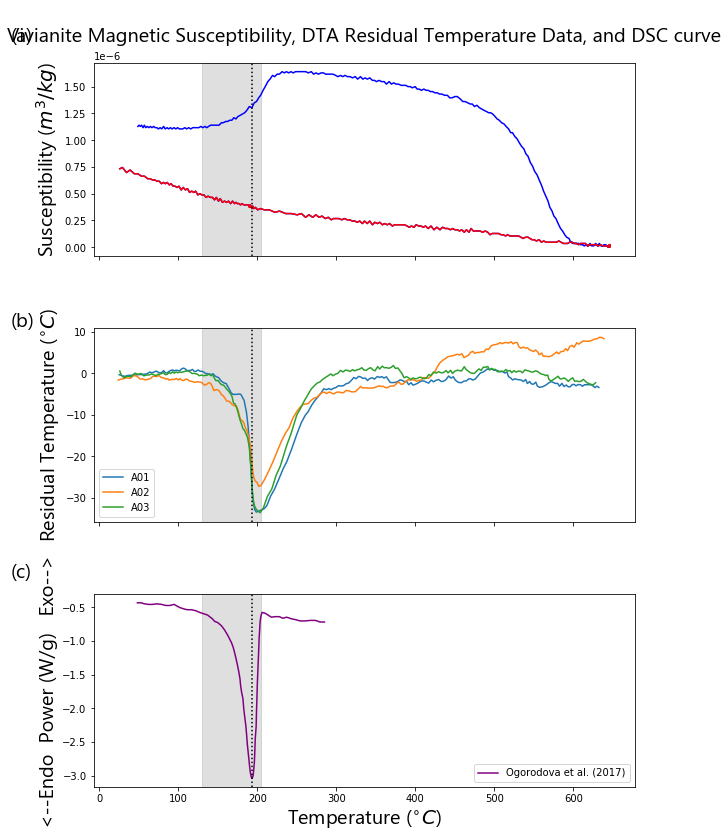

In [156]:
fig, (ax1,ax2,ax3) = plt.subplots(3,1,figsize = (10,12), sharex = True)

# Susceptibility
ax1.plot(vivian_A03f['temp'], vivian_A03f['csusc'], 'b')
ax1.plot(vivian_A03['temp'], vivian_A03['csusc'], 'r')
ax1.axvline(193, color = 'black', linestyle = 'dotted')
ax1.axvspan(130, 205, color = 'grey', alpha = .25)
ax1.set_ylabel('Susceptibility ($m^3/kg$)', **csfont)
ax1.ticklabel_format(axis = 'y', style = 'sci', scilimits = (0,0))
ax1.annotate('(a)', (0.015,.95), xycoords = 'figure fraction', **csfont)


# kDTA
ax2.set_ylabel('Residual Temperature ($^{\circ}C$)', color = 'k', **csfont)
ax2.plot(vivian_det['v_A01'], vivian_det['rv_A01'], label = 'A01')
ax2.plot(vivian_det['v_A02'], vivian_det['rv_A02'], label = 'A02')
ax2.plot(vivian_det['v_A03'], vivian_det['rv_A03'], label = 'A03')
ax2.axvline(193, color = 'black', linestyle = 'dotted')
ax2.axvspan(130, 205, color = 'grey', alpha = .25)
ax2.annotate('(b)', (0.015,.61), xycoords = 'figure fraction', **csfont)
ax2.legend(loc = 3)

# DSC
ax3.set_ylabel('<--Endo  Power (W/g)   Exo-->', **csfont) 
ax3.plot(Ogoro_vivian['temp']-273.15, Ogoro_vivian['power'], color = 'purple', label = 'Ogorodova et al. (2017)')
ax3.axvline(193, color = 'black', linestyle = 'dotted')
ax3.axvspan(130, 205, color = 'grey', alpha = .25)
ax3.set_xlabel('Temperature ($^{\circ}C$)', **csfont) # for all of them
ax3.legend(loc = 4)
ax3.annotate('(c)', (0.015,.31), xycoords = 'figure fraction', **csfont)

ax1.set_title('Vivianite Magnetic Susceptibility, DTA Residual Temperature Data, and DSC curve', y= 1.08, **csfont)


fig.tight_layout()  # otherwise the right y-label is slightly clipped
plt.show()

#fig.savefig('vivianite_results_allanalysis')

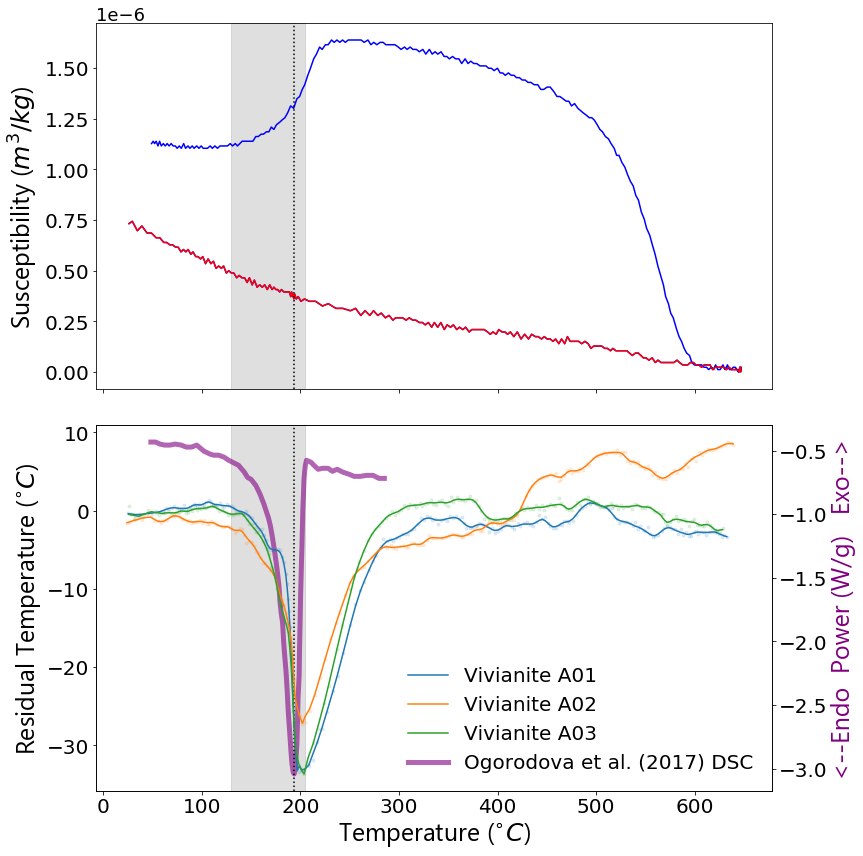

In [157]:
csfont = {'fontname':'Microsoft Tai Le', 'fontsize':25}

fig, (ax1,ax2) = plt.subplots(2,1,figsize = (12,12), sharex = True)

# Susceptibility
ax1.plot(vivian_A03f['temp'], vivian_A03f['csusc'], 'b')
ax1.plot(vivian_A03['temp'], vivian_A03['csusc'], 'r')
ax1.axvline(193, color = 'black', linestyle = 'dotted')
ax1.axvspan(130, 205, color = 'grey', alpha = .25)
ax1.set_ylabel('Susceptibility ($m^3/kg$)', **csfont)
ax1.ticklabel_format(axis = 'y', style = 'sci', scilimits = (0,0))
ax1.tick_params(axis='y', which='major', labelsize=20)
ax1.yaxis.offsetText.set_fontsize(18)
#ax1.annotate('(a)', (0.015,.93), xycoords = 'figure fraction', **csfont)


# kDTA
ax2.set_zorder(10)
ax2.patch.set_visible(False)
ax2.set_xlabel('Temperature ($^{\circ}C$)', **csfont) # for all of them
ax2.set_ylabel('Residual Temperature ($^{\circ}C$)', color = 'k', **csfont)
ax2.tick_params(axis='both', which='major', labelsize=20)
ax2.plot(vivian_det['v_A01'], vivian_det['rv_A01'], '.', color = 'tab:blue', alpha = .125, label = '_nolegend_')
ax2.plot(vivian_det['v_A02'], vivian_det['rv_A02'], '.', color = 'tab:orange', alpha = .125, label = '_nolegend_')
ax2.plot(vivian_det['v_A03'], vivian_det['rv_A03'], '.', color = 'tab:green', alpha = .125, label = '_nolegend_')

ax2.plot(vivian_det['v_A01'], vivian_det['loess_rv_A01'], '-', color = 'tab:blue', label = 'Vivianite A01')
ax2.plot(vivian_det['v_A02'], vivian_det['loess_rv_A02'], '-', color = 'tab:orange', label = 'Vivianite A02')
ax2.plot(vivian_det['v_A03'], vivian_det['loess_rv_A03'], '-', color = 'tab:green', label = 'Vivianite A03')

ax2.plot([], [], color = 'purple', linewidth = 5, alpha = .6, label = 'Ogorodova et al. (2017) DSC')
#ax2.annotate('(b)', (0.015,.61), xycoords = 'figure fraction', **csfont)
ax2.legend(loc = 4, prop={'size': 20}, frameon = False)

# DSC
ax3 = ax2.twinx()

ax3.set_ylabel('<--Endo  Power (W/g)   Exo-->', **csfont, color = 'purple') 
ax3.tick_params(axis='y', which='major', labelsize=20)
ax3.plot(Ogoro_vivian['temp']-273.15, Ogoro_vivian['power'], color = 'purple', linewidth = 5, alpha = .6, label = 'Ogorodova et al. (2017)')
ax3.axvline(193, color = 'black', linestyle = 'dotted')
ax3.axvspan(130, 205, color = 'grey', alpha = .25)

#ax1.set_title('Vivianite Magnetic Susceptibility, DTA Residual Temperature Data, and DSC curve', y= 1.08, **csfont)


fig.tight_layout()  # otherwise the right y-label is slightly clipped
plt.show()

#fig.savefig('vivianite_results_allanalysis_diplot', dpi = 300, bbox_inches = 'tight')


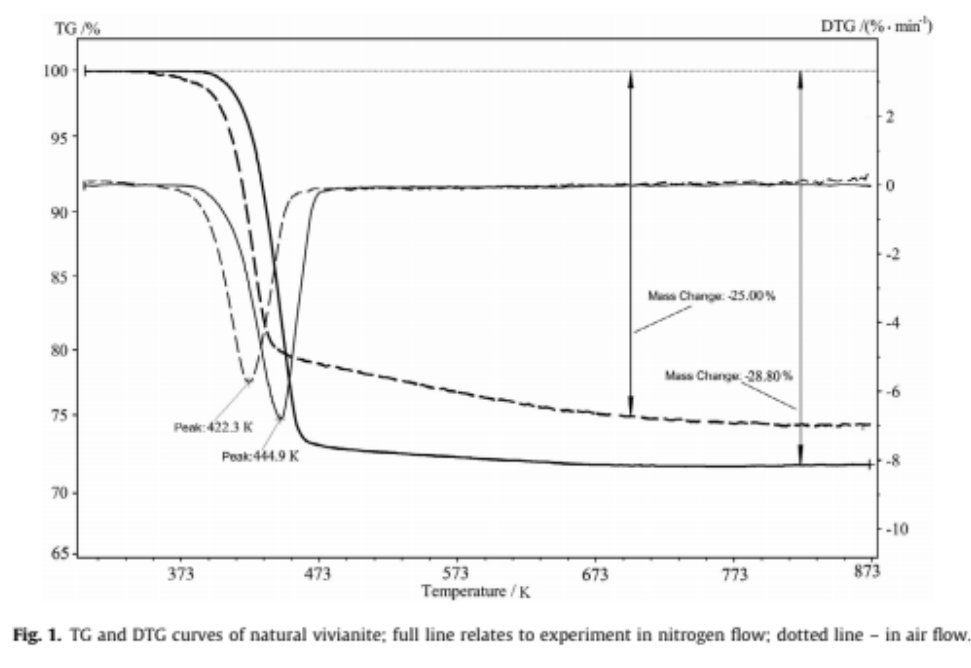

422 K is 148 C

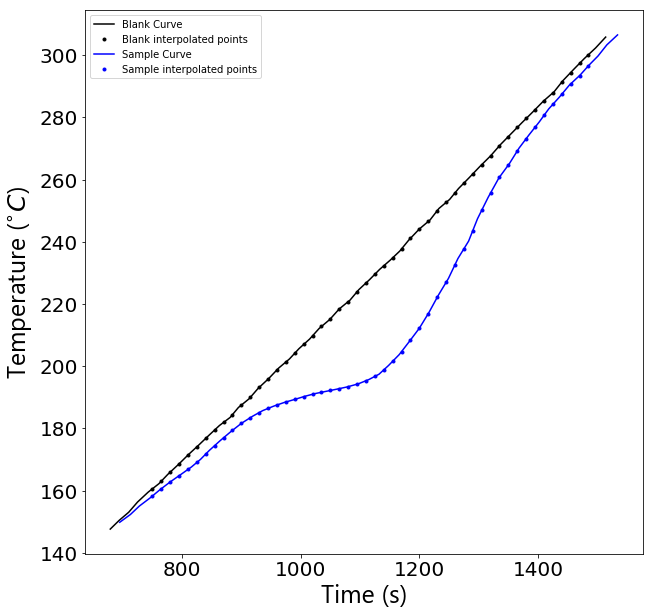

In [158]:
csfont2 = {'fontname':'Microsoft Tai Le', 'fontsize':25}
plt.figure(figsize = (10, 10))

plt.plot(Tube_D01['time'][40:90], Tube_D01['temp'][40:90], 'k-', label = 'Blank Curve')
plt.plot(vivian_det['time'][50:100], vivian_det['b_D01'][50:100], 'k.', label = 'Blank interpolated points')
plt.plot(vivian_A01['time'][40:90], vivian_A01['temp'][40:90], 'b-', label = 'Sample Curve')
plt.plot(vivian_det['time'][50:100], vivian_det['v_A01'][50:100], 'b.', label = 'Sample interpolated points')

plt.xlabel('Time (s)', **csfont2)
plt.ylabel('Temperature ($^{\circ}C$)', **csfont2)
plt.tick_params(axis='both', which='major', labelsize=20)

plt.legend()

#plt.savefig('Method_vivian_unlabled')

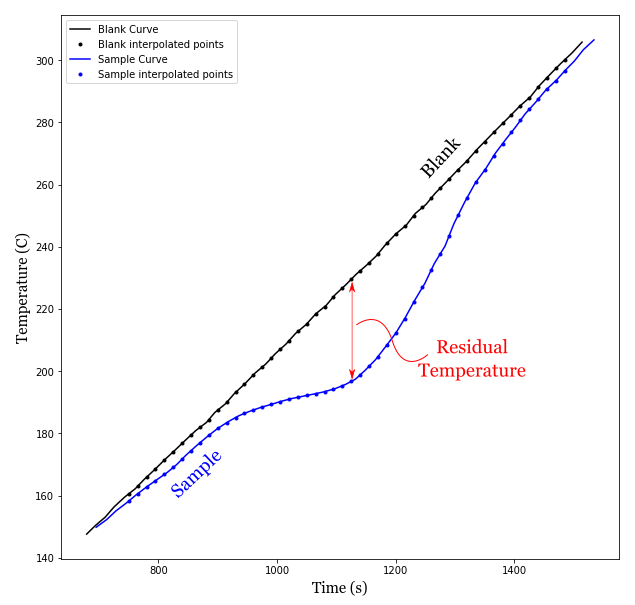

In [159]:
np.polyfit(Tube_D01['time'][40:90], Tube_D01['temp'][40:90], 1)


array([ 0.18963081, 17.24501205])

In [160]:
0.18963081*60

11.3778486

### vivianite cooling

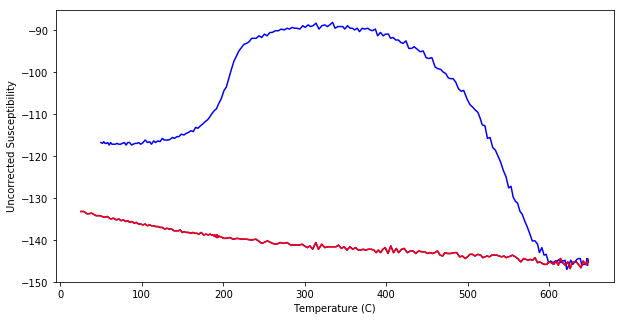

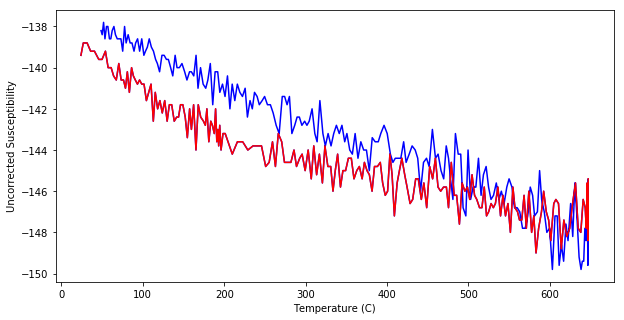

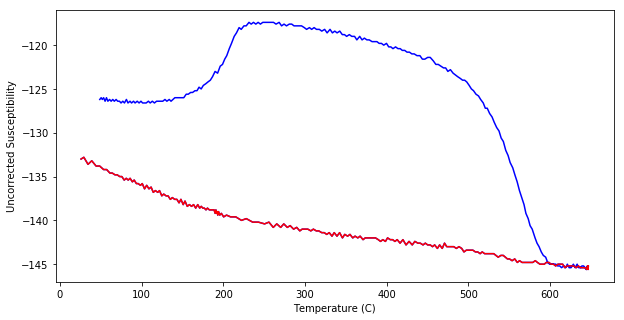

In [161]:
# get blank
Tube_D01c = getminlog(5902, return_full = False, return_cool = True, susplot = False)
Tube_D02c = getminlog(5904, return_full = False, return_cool = True, susplot = False)
Tube_D03c = getminlog(5912, return_full = False, return_cool = True, susplot = False)


# get goethite
vivian_A01c = getminlog(5903, return_full = False, return_cool = True, susplot = True)
vivian_A02c = getminlog(5905, return_full = False, return_cool = True, susplot = True)
vivian_A03c = getminlog(5913, return_full = False, return_cool = True, susplot = True)

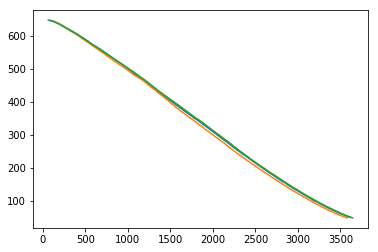

In [162]:
plt.plot(vivian_A01c['time'], vivian_A01c['temp'])
plt.plot(vivian_A02c['time'], vivian_A02c['temp'])
plt.plot(vivian_A03c['time'], vivian_A03c['temp'])

In [163]:
# time vector
tc = np.arange(0,3550,15)

# linear interpolate each and write in terms of t

int_D01c = interp1d(Tube_D01c['time'][:-5], Tube_D01c['temp'][:-5], kind = 'linear', bounds_error = False)
b_D01c = int_D01c(tc)

int_D02c = interp1d(Tube_D02c['time'][:-5], Tube_D02c['temp'][:-5], kind = 'linear', bounds_error = False)
b_D02c = int_D02c(tc)

int_D03c = interp1d(Tube_D03c['time'][:-5], Tube_D03c['temp'][:-5], kind = 'linear', bounds_error = False)
b_D03c = int_D03c(tc)


int_vA01c = interp1d(vivian_A01c['time'][:-5], vivian_A01c['temp'][:-5], kind = 'linear', bounds_error = False)
v_A01c = int_vA01c(tc)

int_vA02c = interp1d(vivian_A02c['time'][:-5], vivian_A02c['temp'][:-5], kind = 'linear', bounds_error = False)
v_A02c = int_vA02c(tc)

int_vA03c = interp1d(vivian_A03c['time'][:-5], vivian_A03c['temp'][:-5], kind = 'linear', bounds_error = False)
v_A03c = int_vA03c(tc)

In [164]:
vivian_dfc = pd.DataFrame({'time':tc, 'b_D01': b_D01c, 'b_D02': b_D02c, 'b_D03': b_D03c, 'v_A01': v_A01c, 'v_A02': v_A02c, 'v_A03': v_A03c})

In [165]:
# start with same data frame
vivianc_det = vivian_dfc.copy()

# calc residuals
vivianc_det['rv_A01'] = vivianc_det['v_A01']-vivianc_det['b_D01']
vivianc_det['rv_A02'] = vivianc_det['v_A02']-vivianc_det['b_D02']
vivianc_det['rv_A03'] = vivianc_det['v_A03']-vivianc_det['b_D03']

vivianc_det.dropna(inplace = True)

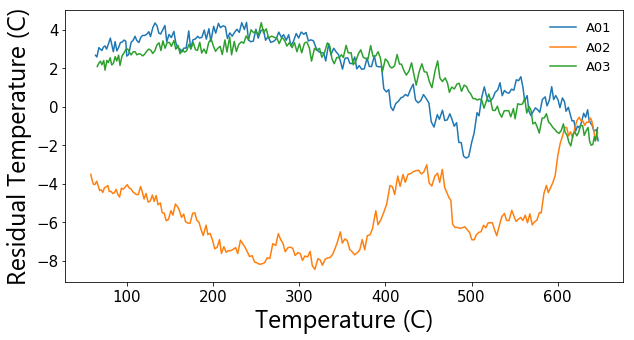

In [166]:
plt.figure(figsize = (10,5))

plt.plot(vivianc_det['v_A01'], vivianc_det['rv_A01'], label = 'A01')
plt.plot(vivianc_det['v_A02'], vivianc_det['rv_A02'], label = 'A02')
plt.plot(vivianc_det['v_A03'], vivianc_det['rv_A03'], label = 'A03')
plt.xlabel('Temperature (C)', **csfont)
plt.ylabel('Residual Temperature (C)', **csfont)
plt.tick_params(axis='both', which='major', labelsize=15)
plt.legend(prop={'size': 13}, frameon = False)
#plt.title('Comparison of all Vivianite on cooling')

Text(0.5, 1.0, 'Comparison of all blanks on cooling')

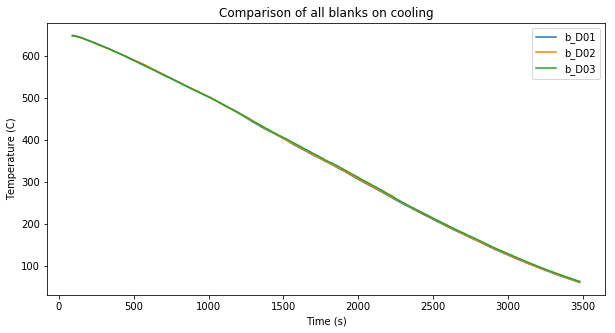

In [167]:
plt.figure(figsize = (10,5))

plt.plot(vivianc_det['time'], vivianc_det['b_D01'], label = 'b_D01')
plt.plot(vivianc_det['time'], vivianc_det['b_D02'], label = 'b_D02')
plt.plot(vivianc_det['time'], vivianc_det['b_D03'], label = 'b_D03')
plt.xlabel('Time (s)')
plt.ylabel('Temperature (C)')
plt.legend()
plt.title('Comparison of all blanks on cooling')

In [168]:
vivianc_det['b_avg'] = vivianc_det[['b_D01', 'b_D02', 'b_D03']].mean(axis = 1)

Text(0.5, 1.0, 'Comparison of all blanks on cooling')

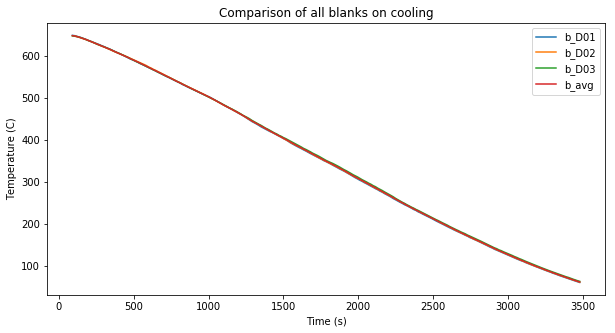

In [169]:
plt.figure(figsize = (10,5))

plt.plot(vivianc_det['time'], vivianc_det['b_D01'], label = 'b_D01')
plt.plot(vivianc_det['time'], vivianc_det['b_D02'], label = 'b_D02')
plt.plot(vivianc_det['time'], vivianc_det['b_D03'], label = 'b_D03')
plt.plot(vivianc_det['time'], vivianc_det['b_avg'], label = 'b_avg')
plt.xlabel('Time (s)')
plt.ylabel('Temperature (C)')
plt.legend()
plt.title('Comparison of all blanks on cooling')

Text(0.5, 1.0, 'Blank- avg blank')

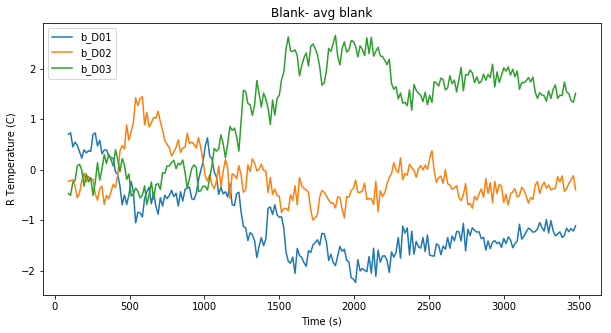

In [170]:
plt.figure(figsize = (10,5))

plt.plot(vivianc_det['time'], vivianc_det['b_D01']-vivianc_det['b_avg'], label = 'b_D01')
plt.plot(vivianc_det['time'], vivianc_det['b_D02']-vivianc_det['b_avg'], label = 'b_D02')
plt.plot(vivianc_det['time'], vivianc_det['b_D03']-vivianc_det['b_avg'], label = 'b_D03')
plt.xlabel('Time (s)')
plt.ylabel('R Temperature (C)')
plt.legend()
plt.title('Blank- avg blank')

In [171]:
fit_b_avg = np.polyfit(vivianc_det['time'], vivianc_det['b_avg'], 1)

vivianc_det['b_avg_fit'] = vivianc_det['time']*fit_b_avg[0] + fit_b_avg[1]

Text(0.5, 1.0, 'Blank- avg blank')

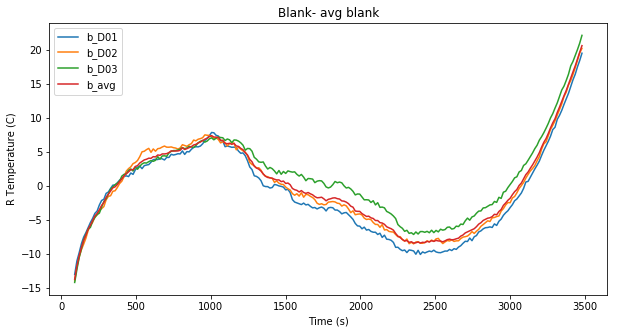

In [172]:
plt.figure(figsize = (10,5))

plt.plot(vivianc_det['time'], vivianc_det['b_D01']-vivianc_det['b_avg_fit'], label = 'b_D01')
plt.plot(vivianc_det['time'], vivianc_det['b_D02']-vivianc_det['b_avg_fit'], label = 'b_D02')
plt.plot(vivianc_det['time'], vivianc_det['b_D03']-vivianc_det['b_avg_fit'], label = 'b_D03')
plt.plot(vivianc_det['time'], vivianc_det['b_avg']-vivianc_det['b_avg_fit'], label = 'b_avg')
plt.xlabel('Time (s)')
plt.ylabel('R Temperature (C)')
plt.legend()
plt.title('Blank- avg blank')

Text(0.5, 1.0, 'Blank- avg blank')

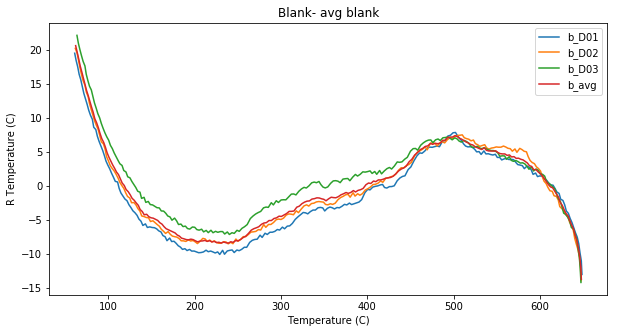

In [173]:
plt.figure(figsize = (10,5))

plt.plot(vivianc_det['b_D01'], vivianc_det['b_D01']-vivianc_det['b_avg_fit'], label = 'b_D01')
plt.plot(vivianc_det['b_D02'], vivianc_det['b_D02']-vivianc_det['b_avg_fit'], label = 'b_D02')
plt.plot(vivianc_det['b_D03'], vivianc_det['b_D03']-vivianc_det['b_avg_fit'], label = 'b_D03')
plt.plot(vivianc_det['b_avg'], vivianc_det['b_avg']-vivianc_det['b_avg_fit'], label = 'b_avg')
plt.xlabel('Temperature (C)')
plt.ylabel('R Temperature (C)')
plt.legend()
plt.title('Blank- avg blank')

In [174]:
vivianc_det['r_max'] = vivianc_det[['b_D01', 'b_D02', 'b_D03']].max(axis = 1)
vivianc_det['r_min'] = vivianc_det[['b_D01', 'b_D02', 'b_D03']].min(axis = 1)
vivianc_det['ranger'] = vivianc_det['r_max'] - vivianc_det['r_min']

Text(0.5, 1.0, 'Range of values at given time')

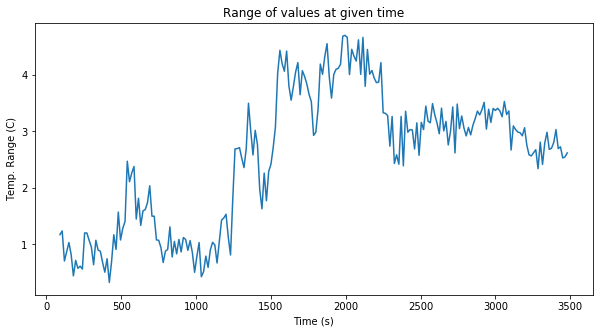

In [175]:
plt.figure(figsize = (10,5))
plt.plot(vivianc_det['time'], vivianc_det['ranger'])
plt.xlabel('Time (s)')
plt.ylabel('Temp. Range (C)')
plt.title('Range of values at given time')

Text(0.5, 1.0, 'Range of values at a given temp')

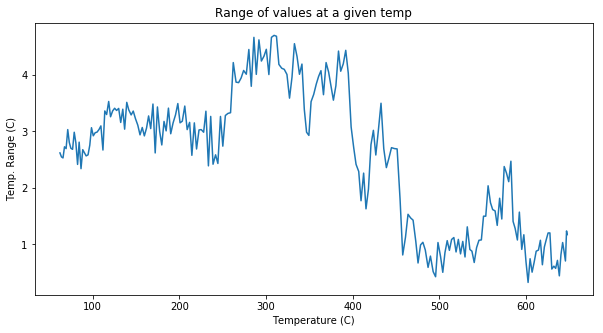

In [176]:
plt.figure(figsize = (10,5))
plt.plot(vivianc_det['b_avg'], vivianc_det['ranger'])
plt.xlabel('Temperature (C)')
plt.ylabel('Temp. Range (C)')
plt.title('Range of values at a given temp')

### vivianite second run

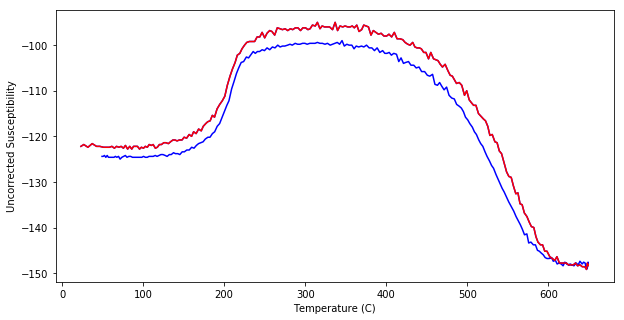

In [177]:
# get blank
Tube_D04 = getminlog(5921, return_full = False, susplot = False)

# get vivianite
vivian_B01 = getminlog(5926, return_full = False, susplot = True)


Text(0, 0.5, 'Temperature (C)')

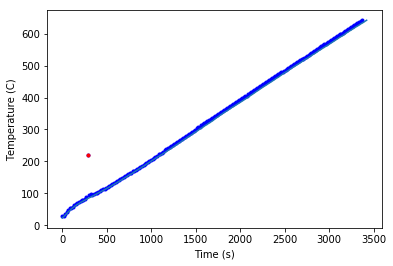

In [178]:
plt.plot(Tube_D04['time'][:-5], Tube_D04['temp'][:-5], 'b.')
plt.plot(Tube_D04['time'][17], Tube_D04['temp'][17], 'r.')

plt.plot(vivian_B01['time'][:-5], vivian_B01['temp'][:-5])
plt.xlabel('Time (s)')
plt.ylabel('Temperature (C)')

In [179]:
Tube_D04.iloc[17] = np.nan

In [180]:
# time vector
t = np.arange(0,3450,15)

# linear interpolate each and write in terms of t

int_D04 = interp1d(Tube_D04['time'][:-5], Tube_D04['temp'][:-5], kind = 'linear', bounds_error = False)
b_D04 = int_D04(t)



int_vB01 = interp1d(vivian_B01['time'][:-5], vivian_B01['temp'][:-5], kind = 'linear', bounds_error = False)
v_B01 = int_vB01(t)

In [181]:
vivian_df = pd.DataFrame({'time':t, 'b_D01': b_D01, 'b_D02': b_D02, 'b_D03': b_D03, 'b_D04': b_D04, 'v_A01': v_A01, 'v_A02': v_A02, 'v_A03': v_A03, 'v_B01': v_B01})

# start with same data frame
vivian_det2 = vivian_df.copy()

# calc residuals
vivian_det2['rv_A01'] = vivian_det2['v_A01']-vivian_det2['b_D01']
vivian_det2['rv_A02'] = vivian_det2['v_A02']-vivian_det2['b_D02']
vivian_det2['rv_A03'] = vivian_det2['v_A03']-vivian_det2['b_D03']
vivian_det2['rv_B01'] = vivian_det2['v_B01']-vivian_det2['b_D04']

vivian_det.dropna(inplace = True)

# best fit line
fit_vB01 = np.polyfit(vivian_det2['v_B01'], vivian_det2['rv_B01'],1)
vivian_det2['d_rv_B01'] = vivian_det2['rv_B01'] - (fit_vB01[0]*vivian_det2['v_B01']+fit_vB01[1])

LinAlgError: SVD did not converge in Linear Least Squares

Text(0, 0.5, 'Temperature (C)')

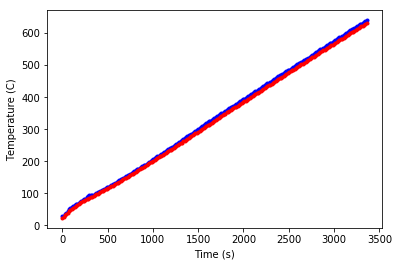

In [182]:
plt.plot(vivian_det2['time'][:-5], vivian_det2['b_D04'][:-5], 'b.')
plt.plot(vivian_det2['time'][:-5], vivian_det2['v_B01'][:-5], 'r.')

plt.xlabel('Time (s)')
plt.ylabel('Temperature (C)')

Text(0.5, 1.0, 'Vivianite run 2 -- no detrend')

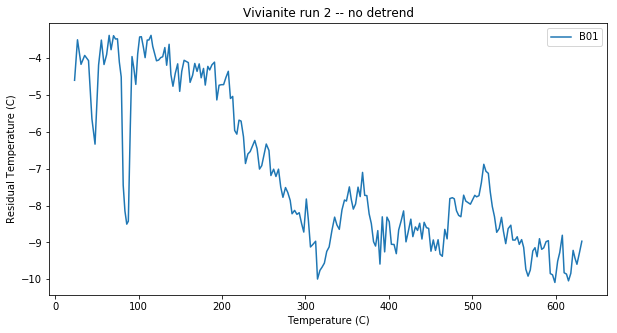

In [183]:
plt.figure(figsize = (10,5))

plt.plot(vivian_det2['v_B01'], vivian_det2['rv_B01'], label = 'B01')

plt.xlabel('Temperature (C)')
plt.ylabel('Residual Temperature (C)')
plt.legend()
plt.title('Vivianite run 2 -- no detrend')

### Plot all minerals/mass 

Text(0.5, 1.0, 'Comparison of all Samples')

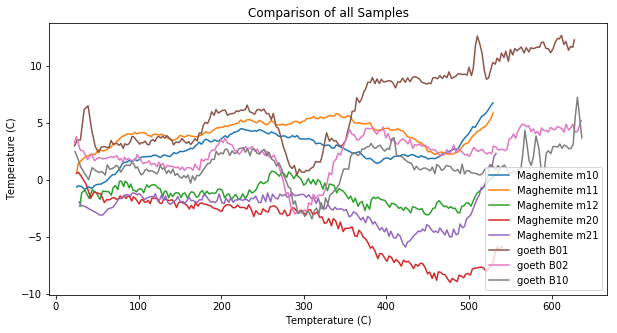

In [184]:
#no scaling
plt.figure(figsize = (10,5))

plt.plot(blank_df['bA10'], (magh['m10'] - blank_df['bA10']), label = 'Maghemite m10')
plt.plot(blank_df['bA10'], magh['m11'] - blank_df['bA10'], label = 'Maghemite m11')
plt.plot(blank_df['bA11'], magh['m12'] - blank_df['bA11'], label = 'Maghemite m12')
plt.plot(blank_df['bB20'], magh['m20'] - blank_df['bB20'], label = 'Maghemite m20')
plt.plot(blank_df['bB22'], magh['m21'] - blank_df['bB22'], label = 'Maghemite m21')

plt.plot(goeth_df['b_B01'], goeth_df['g_B01']-goeth_df['b_B01'], label = 'goeth B01')
plt.plot(goeth_df['b_B02'], goeth_df['g_B02']-goeth_df['b_B02'], label = 'goeth B02')
plt.plot(goeth_df['b_B10'], goeth_df['g_B10']-goeth_df['b_B10'], label = 'goeth B10')
plt.xlabel('Tempterature (C)')
plt.ylabel('Temperature (C)')
plt.legend()
plt.title('Comparison of all Samples')

Text(0.5, 1.0, 'Comparison of all Mass Normalized Samples')

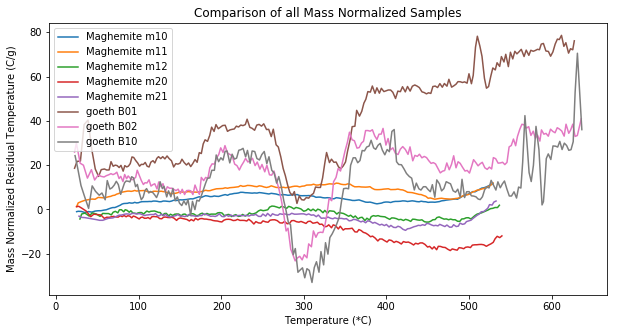

In [185]:
# divided by mass
plt.figure(figsize = (10,5))

plt.plot(blank_df['bA10'], (magh['m10'] - blank_df['bA10'])/MinKey[5705].loc['Specimen_mass[g]'], label = 'Maghemite m10')
plt.plot(blank_df['bA10'], (magh['m11'] - blank_df['bA10'])/MinKey[5709].loc['Specimen_mass[g]'], label = 'Maghemite m11')
plt.plot(blank_df['bA11'], (magh['m12'] - blank_df['bA11'])/MinKey[5719].loc['Specimen_mass[g]'], label = 'Maghemite m12')
plt.plot(blank_df['bB20'], (magh['m20'] - blank_df['bB20'])/MinKey[5708].loc['Specimen_mass[g]'], label = 'Maghemite m20')
plt.plot(blank_df['bB22'], (magh['m21'] - blank_df['bB22'])/MinKey[5714].loc['Specimen_mass[g]'], label = 'Maghemite m21')

plt.plot(goeth_df['b_B01'], ((goeth_df['g_B01']-goeth_df['b_B01'])/MinKey[5827].loc['Specimen_mass[g]']), label = 'goeth B01')
plt.plot(goeth_df['b_B02'], (goeth_df['g_B02']-goeth_df['b_B02'])/MinKey[5831].loc['Specimen_mass[g]'], label = 'goeth B02')
plt.plot(goeth_df['b_B10'], (goeth_df['g_B10']-goeth_df['b_B10'])/MinKey[5829].loc['Specimen_mass[g]'], label = 'goeth B10')
plt.xlabel('Temperature (*C)')
plt.ylabel('Mass Normalized Residual Temperature (C/g)')
plt.legend()
plt.title('Comparison of all Mass Normalized Samples')

Text(0.5, 1.0, 'Comparison of all Mass Normalized Samples')

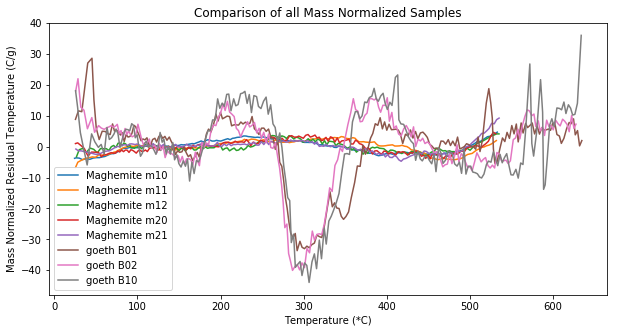

In [186]:
# divided by mass
plt.figure(figsize = (10,5))

plt.plot(magh_det['m10'], magh_det['d_r_m10']/MinKey[5705].loc['Specimen_mass[g]'], label = 'Maghemite m10')
plt.plot(magh_det['m11'], magh_det['d_r_m11']/MinKey[5709].loc['Specimen_mass[g]'], label = 'Maghemite m11')
plt.plot(magh_det['m12'], magh_det['d_r_m12']/MinKey[5719].loc['Specimen_mass[g]'], label = 'Maghemite m12')
plt.plot(magh_det['m20'], magh_det['d_r_m20']/MinKey[5708].loc['Specimen_mass[g]'], label = 'Maghemite m20')
plt.plot(magh_det['m21'], magh_det['d_r_m21']/MinKey[5714].loc['Specimen_mass[g]'], label = 'Maghemite m21')

plt.plot(goeth_det['g_B01'], goeth_det['d_rg_B01']/MinKey[5827].loc['Specimen_mass[g]'], label = 'goeth B01')
plt.plot(goeth_det['g_B02'], goeth_det['d_rg_B02']/MinKey[5831].loc['Specimen_mass[g]'], label = 'goeth B02')
plt.plot(goeth_det['g_B10'], goeth_det['d_rg_B10']/MinKey[5829].loc['Specimen_mass[g]'], label = 'goeth B10')
plt.xlabel('Temperature (*C)')
plt.ylabel('Mass Normalized Residual Temperature (C/g)')
plt.legend()
plt.title('Comparison of all Mass Normalized Samples')

## Predicting the mix signal

In [187]:
# get average signal for each mineral
Temp = np.arange(0,650,3)
stand = pd.DataFrame({'temp': Temp})

#goethite
#interpolate
drg01_int = interp1d(goeth_det['g_B01'], goeth_det['d_rg_B01']/MinKey[5827].loc['Specimen_mass[g]'], kind = 'linear', bounds_error = False)
stand['g01'] = drg01_int(Temp)
drg02_int = interp1d(goeth_det['g_B02'], goeth_det['d_rg_B02']/MinKey[5831].loc['Specimen_mass[g]'], kind = 'linear', bounds_error = False)
stand['g02'] = drg02_int(Temp)
drg10_int = interp1d(goeth_det['g_B10'], goeth_det['d_rg_B10']/MinKey[5829].loc['Specimen_mass[g]'], kind = 'linear', bounds_error = False)
stand['g10'] = drg10_int(Temp)


stand['g_avg'] = stand[['g01', 'g02', 'g10']].mean(axis = 1)

#maghemite
drm10_int = interp1d(magh_det['m10'], magh_det['d_r_m10']/MinKey[5705].loc['Specimen_mass[g]'], kind = 'linear', bounds_error = False)
stand['m10'] = drm10_int(Temp)
drm11_int = interp1d(magh_det['m11'], magh_det['d_r_m11']/MinKey[5709].loc['Specimen_mass[g]'], kind = 'linear', bounds_error = False)
stand['m11'] = drm11_int(Temp)
drm12_int = interp1d(magh_det['m12'], magh_det['d_r_m12']/MinKey[5719].loc['Specimen_mass[g]'], kind = 'linear', bounds_error = False)
stand['m12'] = drm12_int(Temp)
drm20_int = interp1d(magh_det['m20'], magh_det['d_r_m20']/MinKey[5708].loc['Specimen_mass[g]'], kind = 'linear', bounds_error = False)
stand['m20'] = drm20_int(Temp)
drm21_int = interp1d(magh_det['m21'], magh_det['d_r_m21']/MinKey[5714].loc['Specimen_mass[g]'], kind = 'linear', bounds_error = False)
stand['m21'] = drm21_int(Temp)

stand['m_avg'] = stand[['m10', 'm11', 'm12', 'm20', 'm21']].mean(axis = 1)

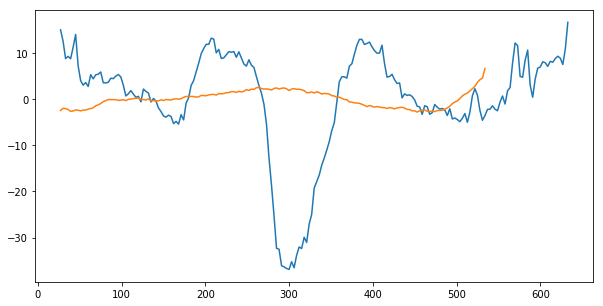

In [188]:
#plot
plt.figure(figsize = (10,5))
plt.plot(stand['temp'], stand['g_avg'])
plt.plot(stand['temp'], stand['m_avg'])

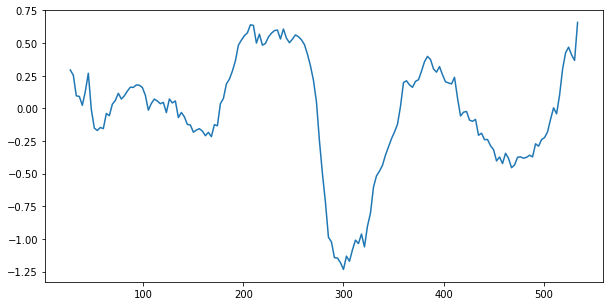

In [189]:
#what I expect for a 24.65% goeth and 75.35% magh

plt.figure(figsize = (10,5))
plt.plot(stand['temp'], .16043*((.2465*stand['g_avg'])+(.7535*stand['m_avg'])))

## Bring in Mix Data

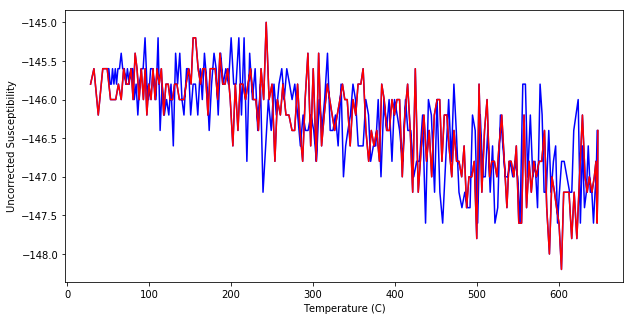

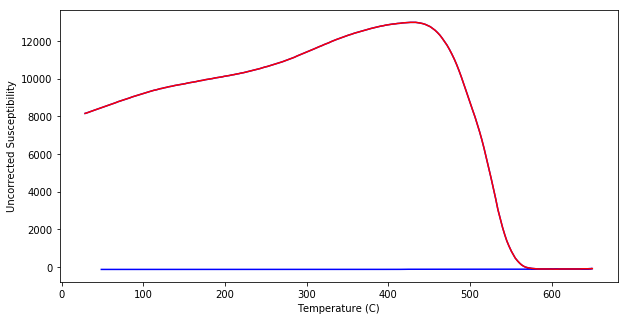

In [190]:
TubeC_01 = getminlog(5858, return_full = False, susplot = True)
mix_C01 = getminlog(5859, return_full = False, susplot = True)


In [191]:
# time vector
t = np.arange(0,3450,15)

# linear interpolate each and write in terms of t

int_C01 = interp1d(TubeC_01['time'][:-5], TubeC_01['temp'][:-5], kind = 'linear', bounds_error = False)
b_C01 = int_C01(t)

int_mC01 = interp1d(mix_C01['time'][:-5], mix_C01['temp'][:-5], kind = 'linear', bounds_error = False)
m_C01 = int_mC01(t)

In [192]:
mix_df = pd.DataFrame({'time':t, 'b_C01': b_C01, 'mix_C01': m_C01}) 

In [193]:
# calc residuals
mix_df['r_mix_C01'] = mix_df['mix_C01']-mix_df['b_C01']

mix_df.dropna(inplace = True)

# best fit line
fit_mC01 = np.polyfit(mix_df['mix_C01'], mix_df['r_mix_C01'],1)
mix_df['d_r_mix_C01'] = mix_df['r_mix_C01'] - (fit_mC01[0]*mix_df['mix_C01']+fit_mC01[1])

# smooth
mix_df['loess_d_r_mix_C01'] = sm.nonparametric.lowess(mix_df['d_r_mix_C01'], mix_df['mix_C01'], frac = .08, return_sorted = False)

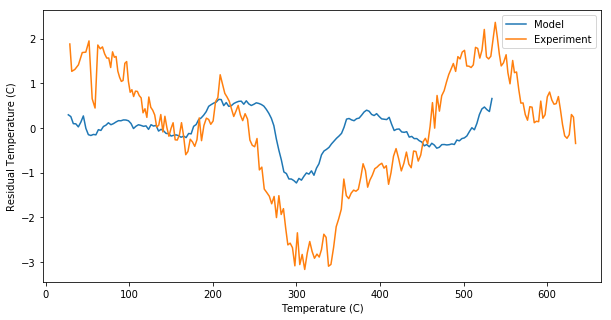

In [194]:
#plot
plt.figure(figsize = (10,5))
plt.plot(stand['temp'], .16043*((.2465*stand['g_avg'])+(.7535*stand['m_avg'])), label = "Model")
plt.plot(mix_df['mix_C01'], mix_df['d_r_mix_C01'], label = 'Experiment')
plt.xlabel('Temperature (C)')
plt.ylabel('Residual Temperature (C)')
plt.legend()

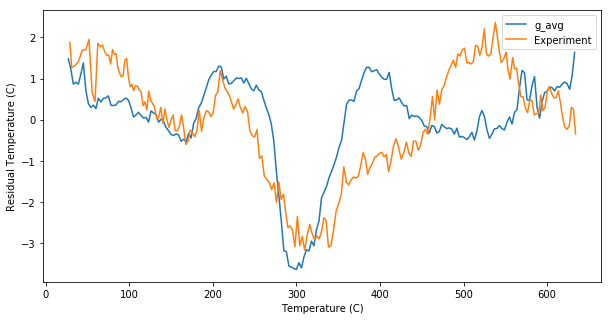

In [195]:
#plot
plt.figure(figsize = (10,5))
plt.plot(stand['temp'], np.sqrt(.16043)*((.2465*stand['g_avg'])))#+(.7535*stand['m_avg'])), label = "Model")
plt.plot(mix_df['mix_C01'], mix_df['d_r_mix_C01'], label = 'Experiment')
plt.xlabel('Temperature (C)')
plt.ylabel('Residual Temperature (C)')
plt.legend()

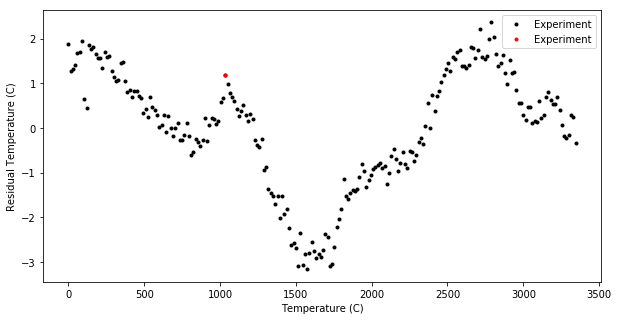

In [196]:
#find area
#plot
plt.figure(figsize = (10,5))
plt.plot(mix_df['time'], mix_df['d_r_mix_C01'], 'k.', label = 'Experiment')
plt.plot(mix_df['time'][69], mix_df['d_r_mix_C01'][69], 'r.', label = 'Experiment')
plt.xlabel('Temperature (C)')
plt.ylabel('Residual Temperature (C)')
plt.legend()

#b = 69, e = 129

#area_mix_C01 = riemann_left(mix_df, 'mix_C01', 'd_r_mix_C01', 69, 129)

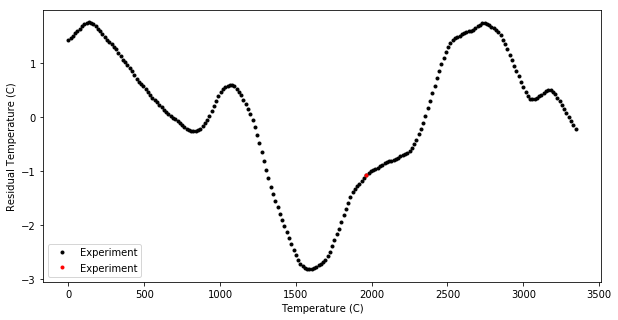

In [197]:
#find area
#plot
plt.figure(figsize = (10,5))
plt.plot(mix_df['time'], mix_df['loess_d_r_mix_C01'], 'k.', label = 'Experiment')
plt.plot(mix_df['time'][131], mix_df['loess_d_r_mix_C01'][131], 'r.', label = 'Experiment')
plt.xlabel('Temperature (C)')
plt.ylabel('Residual Temperature (C)')
plt.legend()

#b = 72, e = 131

area_mix_C01 = riemann_left(mix_df, 'mix_C01', 'loess_d_r_mix_C01', 72, 131)

Text(0.5, 1.0, 'Comparison of all Mass Normalized Samples')

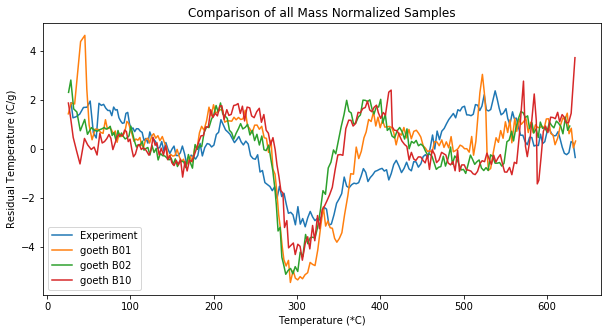

In [198]:
# just comparing them straight on
plt.figure(figsize = (10,5))

plt.plot(mix_df['mix_C01'], mix_df['d_r_mix_C01'], label = 'Experiment')

plt.plot(goeth_det['g_B01'], goeth_det['d_rg_B01'], label = 'goeth B01')
plt.plot(goeth_det['g_B02'], goeth_det['d_rg_B02'], label = 'goeth B02')
plt.plot(goeth_det['g_B10'], goeth_det['d_rg_B10'], label = 'goeth B10')
plt.xlabel('Temperature (*C)')
plt.ylabel('Residual Temperature (C/g)')
plt.legend()
plt.title('Comparison of all Mass Normalized Samples')

(array([25.33808301,  1.9450778 ]),
 array([0.63279451]),
 2,
 array([1.38304774, 0.29526081]),
 1.1102230246251565e-15)

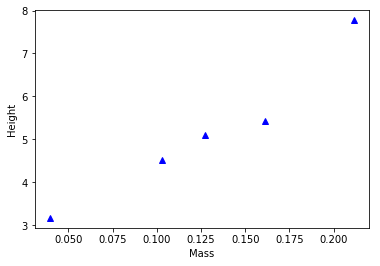

In [199]:
# mass vs. minimum height

mass_g = np.array((MinKey[5827].loc['Specimen_mass[g]'], MinKey[5831].loc['Specimen_mass[g]'], MinKey[5829].loc['Specimen_mass[g]'], MinKey[5888].loc['Specimen_mass[g]'], MinKey[5859].loc['Specimen_mass[g]']*.2465))
height_g = -1* np.array((min(goeth_det['d_rg_B01']), min(goeth_det['d_rg_B02']), min(goeth_det['d_rg_B10']), min(goeth_det['d_rg_B11']), min(mix_df['d_r_mix_C01'])))

plt.plot(mass_g, height_g, 'b^')
plt.xlabel('Mass')
plt.ylabel('Height')
np.polyfit(mass_g, height_g, 1, full = True)


(array([16.13313753, -0.40615559]),
 array([1.24093695]),
 2,
 array([1.40342971, 0.1743131 ]),
 1.1102230246251565e-15)

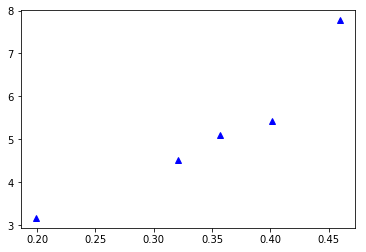

In [200]:
plt.plot(np.sqrt(mass_g), height_g, 'b^')
np.polyfit(np.sqrt(mass_g), height_g, 1, full = True)

In [201]:
# mass vs area

area = np.array((area_B01, area_B02, area_B10, area_B11, area_mix_C01))
areafit = np.polyfit(mass_g, np.abs(area),1, full = True)

# get residual
#calculate sum square total
diff = np.abs(area) - np.abs(area).mean()
diff2 = diff**2
SST = diff2.sum()
r2 = 1 - areafit[1][0]/SST

mass_r = np.arange(.04,.22, .01)
print(r2)

0.9952228378726853


Text(0.5, 1.0, 'Peak Area vs Mass of Goethite')

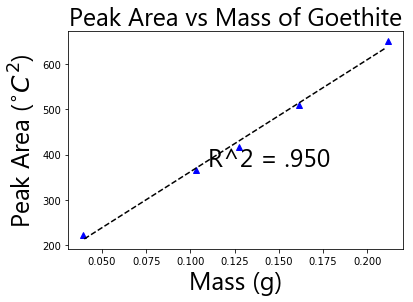

In [202]:
#plot

plt.plot(mass_g, np.abs(area), 'b^')
plt.plot(mass_r, areafit[0][0] * mass_r +areafit[0][1], 'k--')
plt.annotate('R^2 = .950', (.11,375), **csfont)
plt.xlabel('Mass (g)', **csfont)
plt.ylabel('Peak Area ($^{\circ}C^2$)', **csfont)
plt.title('Peak Area vs Mass of Goethite', **csfont)

#plt.savefig('areaVmass_goeth')

In [203]:
r2

0.9952228378726853

In [204]:
areafit[0][0]

2478.186093540554

In [205]:
np.abs(area)

array([509.77850373, 416.03192787, 365.42635152, 650.40481695,
       223.00929946])

In [206]:
# Calculating the Q = del H / del T

Q_goeth = (559 * mass_g) / np.abs(area)

In [207]:
Q_goeth

array([0.17700586, 0.17118061, 0.15760705, 0.18183695, 0.09912686])

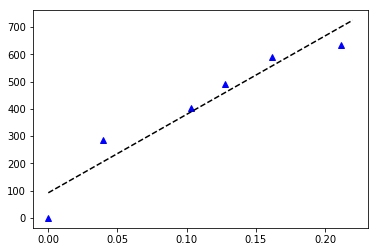

In [208]:
areafit_w0 = np.polyfit(np.array([0.16142   , 0.1274    , 0.10303   , 0.21157   , 0.03954599,0]), np.array([588.43094532, 489.79445385, 401.85930216, 635.70296014,
       285.93527596,0]), 1, full = True)

plt.plot(np.array([0.16142   , 0.1274    , 0.10303   , 0.21157   , 0.03954599,0]), np.array([588.43094532, 489.79445385, 401.85930216, 635.70296014,
       285.93527596,0]), 'b^')
plt.plot([0,.22], areafit_w0[0][0] * np.array([0,.22]) +areafit_w0[0][1], 'k--')

## Natural Sample
### Bay Shore Lake

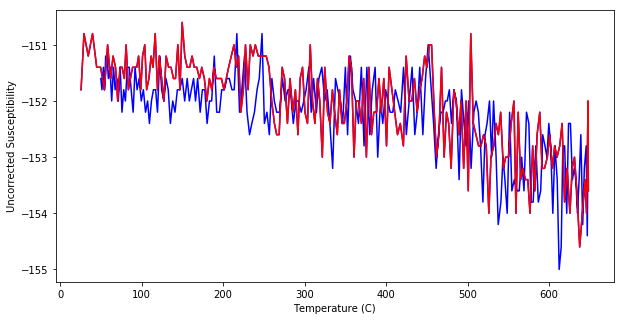

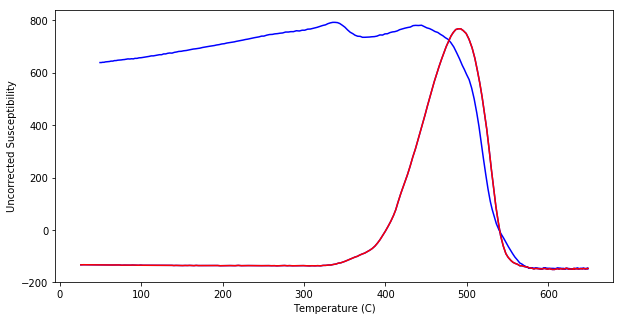

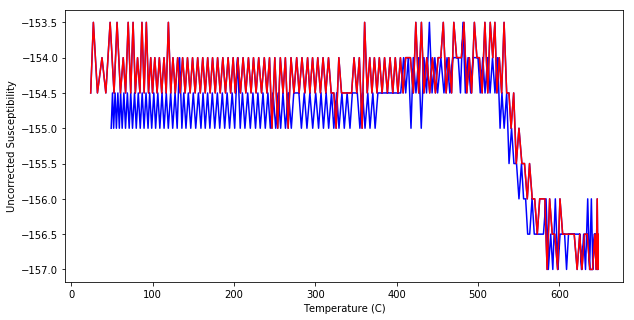

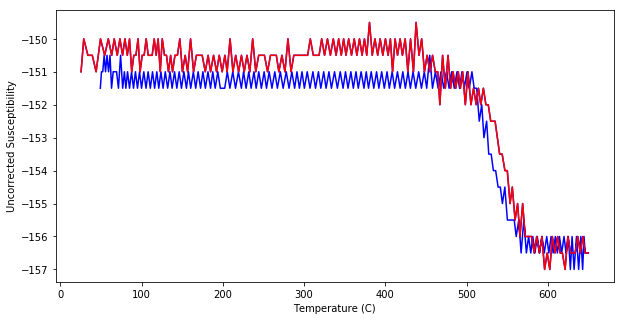

In [209]:
TubeE_01 = getminlog(5927, return_full = False, susplot = True)
TubeE_01c = getminlog(5927, return_full = False, return_cool = True, susplot = False)
BSL_A01, BSL_A01f = getminlog(5928, return_full = True, susplot = True)
BSL_A01c = getminlog(5928, return_full = False, return_cool = True, susplot = False)


TubeE_02 = getminlog(5977, return_full = False, susplot = True)
TubeE_02c = getminlog(5977, return_full = False, return_cool = True, susplot = False)
BSL_B01, BSL_B01f = getminlog(5978, return_full = True, susplot = True)
BSL_B01c = getminlog(5978, return_full = False, return_cool = True, susplot = False)

In [210]:
BSL_A01f['csusc'] = (BSL_A01f['susc']+151)*(1e-5)/(MinKey[5928].loc['Specimen_mass[g]']*1000)
BSL_A01['csusc'] = (BSL_A01['susc']+151)*(1e-5)/(MinKey[5928].loc['Specimen_mass[g]']*1000)

BSL_B01f['csusc'] = (BSL_B01f['susc']+157)*(1e-5)/(MinKey[5978].loc['Specimen_mass[g]']*1000)
BSL_B01['csusc'] = (BSL_B01['susc']+157)*(1e-5)/(MinKey[5978].loc['Specimen_mass[g]']*1000)

In [211]:
# time vector
t = np.arange(0,3450,15)

tc = np.arange(0,3500,15)

# linear interpolate each and write in terms of t

int_E01 = interp1d(TubeE_01['time'][:-5], TubeE_01['temp'][:-5], kind = 'linear', bounds_error = False)
b_E01 = int_E01(t)

int_BSLA01 = interp1d(BSL_A01['time'][:-5], BSL_A01['temp'][:-5], kind = 'linear', bounds_error = False)
BSL_A01i = int_BSLA01(t)

int_E02 = interp1d(TubeE_02['time'][:-5], TubeE_02['temp'][:-5], kind = 'linear', bounds_error = False)
b_E02 = int_E02(t)

int_BSLB01 = interp1d(BSL_B01['time'][:-5], BSL_B01['temp'][:-5], kind = 'linear', bounds_error = False)
BSL_B01i = int_BSLB01(t)

# for cooling

int_E01c = interp1d(TubeE_01c['time'][:-5], TubeE_01c['temp'][:-5], kind = 'linear', bounds_error = False)
b_E01c = int_E01c(tc)

int_BSLA01c = interp1d(BSL_A01c['time'][:-5], BSL_A01c['temp'][:-5], kind = 'linear', bounds_error = False)
BSL_A01ic = int_BSLA01c(tc)

int_E02c = interp1d(TubeE_02c['time'][:-5], TubeE_02c['temp'][:-5], kind = 'linear', bounds_error = False)
b_E02c = int_E02c(tc)

int_BSLB01c = interp1d(BSL_B01c['time'][:-5], BSL_B01c['temp'][:-5], kind = 'linear', bounds_error = False)
BSL_B01ic = int_BSLB01c(tc)

In [212]:
BSL_df = pd.DataFrame({'time':t, 'b_E01': b_E01, 'b_E02': b_E02, 'BSL_A01': BSL_A01i, 'BSL_B01': BSL_B01i}) 
BSL_dfc = pd.DataFrame({'time':tc, 'b_E01': b_E01c, 'b_E02': b_E02c, 'BSL_A01': BSL_A01ic, 'BSL_B01': BSL_B01ic}) 

In [213]:
# calc residuals
BSL_df['r_BSL_A01'] = BSL_df['BSL_A01']-BSL_df['b_E01']
BSL_df['r_BSL_B01'] = BSL_df['BSL_B01']-BSL_df['b_E02']

BSL_dfc['r_BSL_A01'] = BSL_dfc['BSL_A01']-BSL_dfc['b_E01']
BSL_dfc['r_BSL_B01'] = BSL_dfc['BSL_B01']-BSL_dfc['b_E02']

BSL_df.dropna(inplace = True)
BSL_dfc.dropna(inplace = True)

# best fit line
fit_BSLA01 = np.polyfit(BSL_df['BSL_A01'], BSL_df['r_BSL_A01'],1)
BSL_df['d_r_BSL_A01'] = BSL_df['r_BSL_A01'] - (fit_BSLA01[0]*BSL_df['BSL_A01']+fit_BSLA01[1])

fit_BSLB01 = np.polyfit(BSL_df['BSL_B01'], BSL_df['r_BSL_B01'],1)
BSL_df['d_r_BSL_B01'] = BSL_df['r_BSL_B01'] - (fit_BSLB01[0]*BSL_df['BSL_B01']+fit_BSLB01[1])

fit_BSLA01c = np.polyfit(BSL_dfc['BSL_A01'], BSL_dfc['r_BSL_A01'],1)
BSL_dfc['d_r_BSL_A01'] = BSL_dfc['r_BSL_A01'] - (fit_BSLA01c[0]*BSL_dfc['BSL_A01']+fit_BSLA01c[1])

fit_BSLB01c = np.polyfit(BSL_dfc['BSL_B01'], BSL_dfc['r_BSL_B01'],1)
BSL_dfc['d_r_BSL_B01'] = BSL_dfc['r_BSL_B01'] - (fit_BSLB01c[0]*BSL_dfc['BSL_B01']+fit_BSLB01c[1])

# smooth
BSL_df['loess_r_BSL_A01'] = sm.nonparametric.lowess(BSL_df['r_BSL_A01'], BSL_df['BSL_A01'], frac = .08, return_sorted = False)
BSL_df['loess_d_r_BSL_A01'] = sm.nonparametric.lowess(BSL_df['d_r_BSL_A01'], BSL_df['BSL_A01'], frac = .08, return_sorted = False)

BSL_df['loess_r_BSL_B01'] = sm.nonparametric.lowess(BSL_df['r_BSL_B01'], BSL_df['BSL_B01'], frac = .08, return_sorted = False)
BSL_df['loess_d_r_BSL_B01'] = sm.nonparametric.lowess(BSL_df['d_r_BSL_B01'], BSL_df['BSL_B01'], frac = .08, return_sorted = False)

BSL_dfc['loess_r_BSL_A01'] = sm.nonparametric.lowess(BSL_dfc['r_BSL_A01'], BSL_dfc['BSL_A01'], frac = .08, return_sorted = False)
BSL_dfc['loess_d_r_BSL_A01'] = sm.nonparametric.lowess(BSL_dfc['d_r_BSL_A01'], BSL_dfc['BSL_A01'], frac = .08, return_sorted = False)

BSL_dfc['loess_r_BSL_B01'] = sm.nonparametric.lowess(BSL_dfc['r_BSL_B01'], BSL_dfc['BSL_B01'], frac = .08, return_sorted = False)
BSL_dfc['loess_d_r_BSL_B01'] = sm.nonparametric.lowess(BSL_dfc['d_r_BSL_B01'], BSL_dfc['BSL_B01'], frac = .08, return_sorted = False)

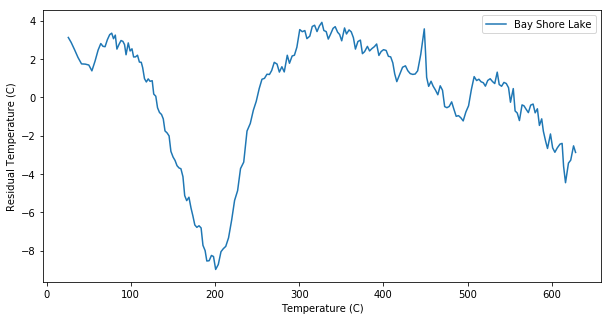

In [214]:
#plot
plt.figure(figsize = (10,5))
plt.plot(BSL_df['BSL_A01'], BSL_df['d_r_BSL_A01'], label = 'Bay Shore Lake')
plt.xlabel('Temperature (C)')
plt.ylabel('Residual Temperature (C)')
plt.legend()

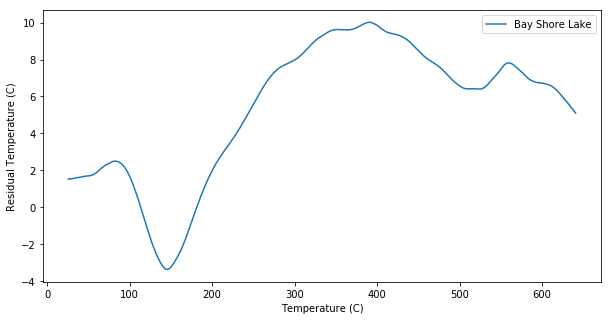

In [215]:
#plot
plt.figure(figsize = (10,5))
plt.plot(BSL_df['BSL_B01'], BSL_df['loess_r_BSL_B01'], label = 'Bay Shore Lake')
plt.xlabel('Temperature (C)')
plt.ylabel('Residual Temperature (C)')
plt.legend()

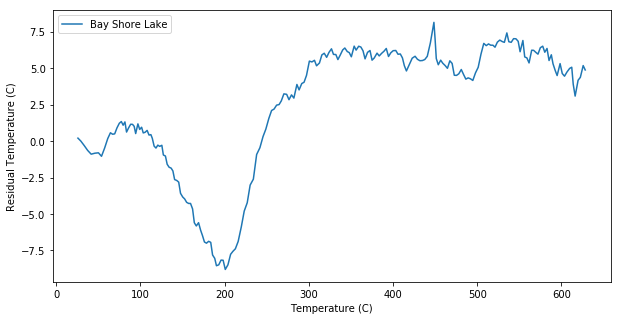

In [216]:
#plot
plt.figure(figsize = (10,5))
plt.plot(BSL_df['BSL_A01'], BSL_df['r_BSL_A01'], label = 'Bay Shore Lake')
plt.xlabel('Temperature (C)')
plt.ylabel('Residual Temperature (C)')
plt.legend()

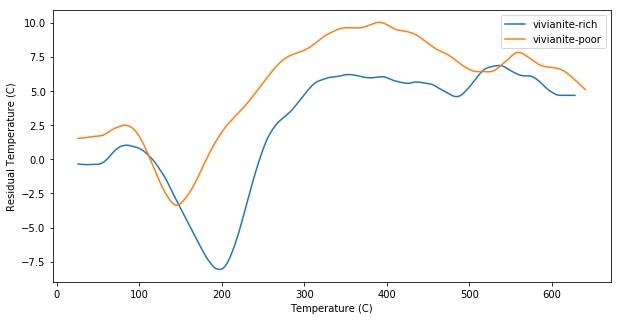

In [217]:
#plot
plt.figure(figsize = (10,5))
plt.plot(BSL_df['BSL_A01'], BSL_df['loess_r_BSL_A01'], label = 'vivianite-rich')
plt.plot(BSL_df['BSL_B01'], BSL_df['loess_r_BSL_B01'], label = 'vivianite-poor')
plt.xlabel('Temperature (C)')
plt.ylabel('Residual Temperature (C)')
plt.legend()

Text(0.5, 1.0, 'Comparison of all Vivianite (not detrended)')

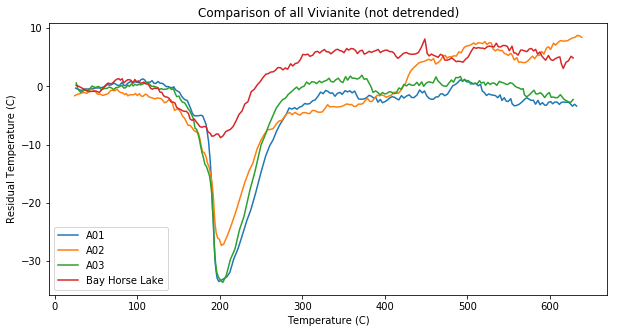

In [218]:
plt.figure(figsize = (10,5))

plt.plot(vivian_det['v_A01'], vivian_det['rv_A01'], label = 'A01')
plt.plot(vivian_det['v_A02'], vivian_det['rv_A02'], label = 'A02')
plt.plot(vivian_det['v_A03'], vivian_det['rv_A03'], label = 'A03')
plt.plot(BSL_df['BSL_A01'], BSL_df['r_BSL_A01'], label = 'Bay Horse Lake')

plt.xlabel('Temperature (C)')
plt.ylabel('Residual Temperature (C)')
plt.legend()
plt.title('Comparison of all Vivianite (not detrended)')

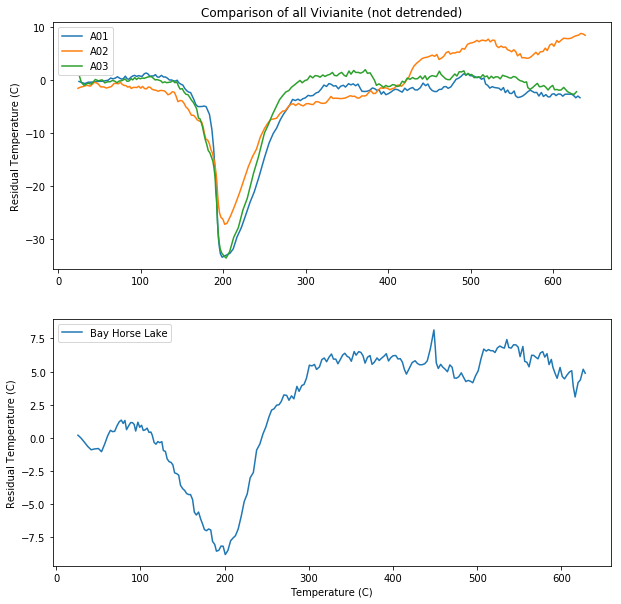

In [219]:
plt.figure(figsize = (10,10))

plt.subplot(211)
plt.plot(vivian_det['v_A01'], vivian_det['rv_A01'], label = 'A01')
plt.plot(vivian_det['v_A02'], vivian_det['rv_A02'], label = 'A02')
plt.plot(vivian_det['v_A03'], vivian_det['rv_A03'], label = 'A03')
plt.ylabel('Residual Temperature (C)')
plt.title('Comparison of all Vivianite (not detrended)')
plt.legend()

plt.subplot(212)
plt.plot(BSL_df['BSL_A01'], BSL_df['r_BSL_A01'], label = 'Bay Horse Lake')

plt.xlabel('Temperature (C)')
plt.ylabel('Residual Temperature (C)')
plt.legend()


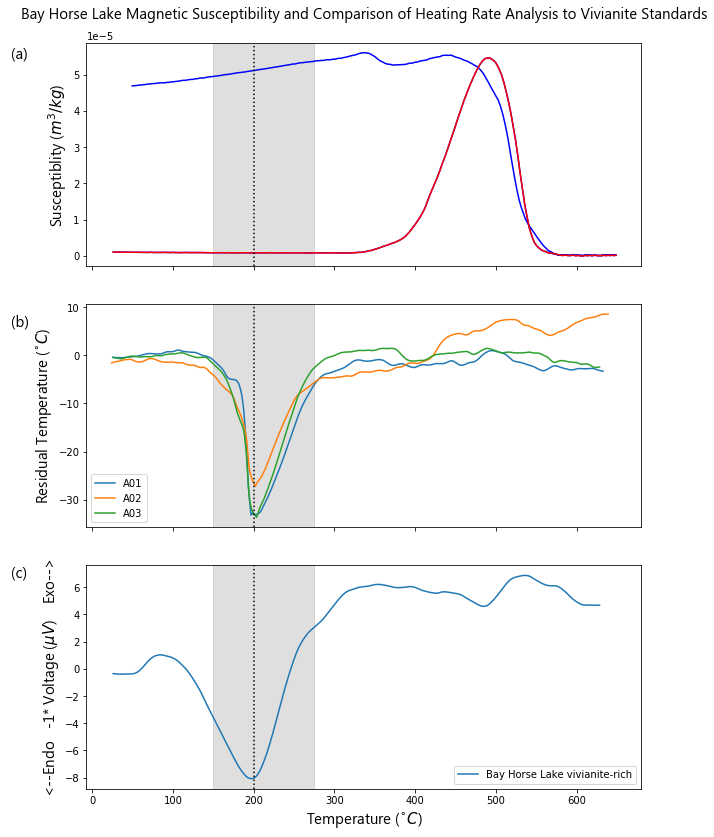

In [220]:
csfont = {'fontname':'Microsoft Tai Le', 'fontsize':15}

fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize = (10,12), sharex = True)

ax1.set_ylabel('Susceptiblity ($m^3/kg$)', **csfont)
ax1.plot(BSL_A01f['temp'], BSL_A01f['csusc'], 'b')
ax1.plot(BSL_A01['temp'], BSL_A01['csusc'], 'r')
ax1.axvline(200, color = 'black', linestyle = 'dotted')
ax1.axvspan(150, 275, color = 'grey', alpha = .25)
ax1.annotate('(a)', (0.015,.93), xycoords = 'figure fraction', **csfont)
ax1.ticklabel_format(axis = 'y', style = 'sci', scilimits = (0,0))

ax2.set_ylabel('Residual Temperature ($^{\circ}C$)', color = 'k', **csfont)
ax2.plot(vivian_det['v_A01'], vivian_det['loess_rv_A01'], '-', color = 'tab:blue', label = 'A01')
ax2.plot(vivian_det['v_A02'], vivian_det['loess_rv_A02'], '-', color = 'tab:orange', label = 'A02')
ax2.plot(vivian_det['v_A03'], vivian_det['loess_rv_A03'], '-', color = 'tab:green', label = 'A03')

ax2.axvline(200, color = 'black', linestyle = 'dotted')
ax2.axvspan(150, 275, color = 'grey', alpha = .25)
ax2.annotate('(b)', (0.015,.61), xycoords = 'figure fraction', **csfont)
ax2.legend()
#ax1.tick_params(axis='y', labelcolor=color)


ax3.set_ylabel('<--Endo   -1* Voltage ($\mu V$)    Exo-->', **csfont)  # we already handled the x-label with ax1
ax3.plot(BSL_df['BSL_A01'], BSL_df['loess_r_BSL_A01'], label = 'Bay Horse Lake vivianite-rich')
ax3.axvline(200, color = 'black', linestyle = 'dotted')
ax3.axvspan(150, 275, color = 'grey', alpha = .25)
ax3.set_xlabel('Temperature ($^{\circ}C$)', **csfont)
ax3.annotate('(c)', (0.015,.31), xycoords = 'figure fraction', **csfont)
ax3.legend(loc = 4)

ax1.set_title('Bay Horse Lake Magnetic Susceptibility and Comparison of Heating Rate Analysis to Vivianite Standards', y = 1.08, **csfont)


fig.tight_layout()  # otherwise the right y-label is slightly clipped
plt.show()

#fig.savefig('BayHorseLake_all_sm')

In [221]:
BSL_A01.head()

,time,temp,susc,csusc,sec
0,0,25.9,-133.4,0.000001,heat
1,15,29.3,-133.0,0.000001,heat
2,34,34.4,-133.2,0.000001,heat
3,52,39.3,-133.4,0.000001,heat
4,68,43.9,-133.8,0.000001,heat


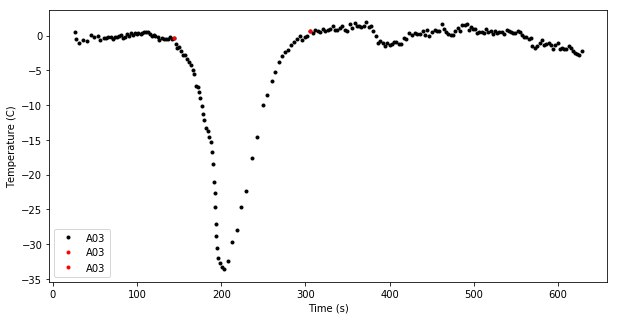

In [222]:
# area of vivianite peaks
plt.figure(figsize = (10,5))

b = 44
e = 101

#plt.plot(vivian_det['v_A01'], vivian_det['rv_A01'], 'k.', label = 'A01')
#plt.plot(vivian_det['v_A01'][b], vivian_det['rv_A01'][b], 'r.', label = 'A01')
#plt.plot(vivian_det['v_A01'][e], vivian_det['rv_A01'][e], 'r.', label = 'A01')

#plt.plot(vivian_det['v_A02'], vivian_det['rv_A02'], 'k.', label = 'A02')
#plt.plot(vivian_det['v_A02'][b], vivian_det['rv_A02'][b], 'r.', label = 'A02')
#plt.plot(vivian_det['v_A02'][e], vivian_det['rv_A02'][e], 'r.', label = 'A02')

plt.plot(vivian_det['v_A03'], vivian_det['rv_A03'], 'k.', label = 'A03')
plt.plot(vivian_det['v_A03'][b], vivian_det['rv_A03'][b], 'r.', label = 'A03')
plt.plot(vivian_det['v_A03'][e], vivian_det['rv_A03'][e], 'r.', label = 'A03')


#plt.plot(BSL_df['BSL_A01'], BSL_df['r_BSL_A01'], 'k.', label = 'Bay Shore Lake')
#plt.plot(BSL_df['BSL_A01'][b], BSL_df['r_BSL_A01'][b], 'r.', label = 'Bay Shore Lake')
#plt.plot(BSL_df['BSL_A01'][e], BSL_df['r_BSL_A01'][e], 'r.', label = 'Bay Shore Lake')

plt.xlabel('Time (s)')
plt.ylabel('Temperature (C)')
plt.legend()

In [223]:
# v_A01
b_vA01 = 36
e_vA01 = 109

area_vA01 = riemann_left(vivian_det, 'v_A01', 'rv_A01', b_vA01, e_vA01)

# v_A02
b_vA02 = 43
e_vA02 = 93

area_vA02 = riemann_left(vivian_det, 'v_A02', 'rv_A02', b_vA02, e_vA02)

# v_A03
b_vA03 = 44
e_vA03 = 101

area_vA03 = riemann_left(vivian_det, 'v_A03', 'rv_A03', b_vA03, e_vA03)

# BSL_A01
b_BSLA01 = 24
e_BSLA01 = 100

area_BSLA01 = riemann_left(BSL_df, 'BSL_A01', 'r_BSL_A01', b_BSLA01, e_BSLA01)

In [224]:
mass_v = np.array((MinKey[5903].loc['Specimen_mass[g]'], MinKey[5905].loc['Specimen_mass[g]'], MinKey[5913].loc['Specimen_mass[g]']))
area_v = np.array(np.abs((area_vA01, area_vA02, area_vA03)))

Text(0, 0.5, 'Area (C^2)')

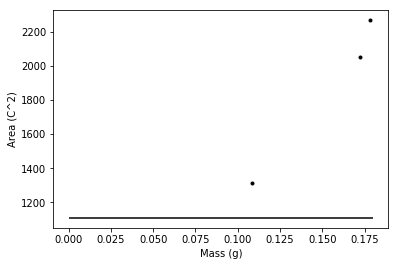

In [225]:
plt.plot(mass_v, area_v, 'k.')
plt.hlines(np.abs(area_BSLA01),0,.18)
plt.xlabel('Mass (g)')
plt.ylabel('Area (C^2)')

In [226]:
v_mass_fit = np.polyfit(mass_v, area_v, 1)

In [227]:
v_mass_fit

array([12765.40383742,   -71.94026793])

In [228]:
(np.abs(area_BSLA01)-v_mass_fit[1])/v_mass_fit[0]

0.09245801628805325

In [229]:
0.09245801628805325/MinKey[5928].loc['Specimen_mass[g]']

0.5491359285386544

In [230]:
MinKey[5928].loc['Specimen_mass[g]']

0.16837

In [231]:
# calculate Q = del H / del T
Q_vivian = (381.8 * mass_v) / area_v

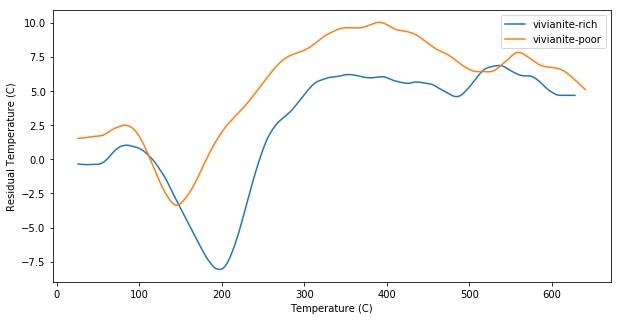

In [232]:
#plot
plt.figure(figsize = (10,5))
plt.plot(BSL_df['BSL_A01'], BSL_df['loess_r_BSL_A01'], label = 'vivianite-rich')
plt.plot(BSL_df['BSL_B01'], BSL_df['loess_r_BSL_B01'], label = 'vivianite-poor')
plt.xlabel('Temperature (C)')
plt.ylabel('Residual Temperature (C)')
plt.legend()

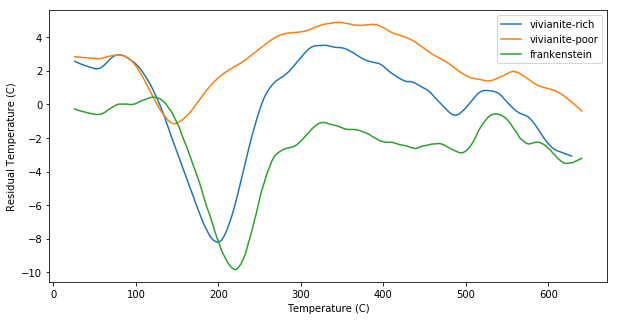

In [233]:
# interpolate B01 to fit temperatures of A01
int_BSLB01_TRT = interp1d(BSL_df['BSL_B01'], BSL_df['loess_d_r_BSL_B01'], kind = 'linear', bounds_error = False)
BSL_df['iA_loess_r_BSL_B01'] = int_BSLB01_TRT(BSL_df['BSL_A01'])
BSL_df['iA_loess_d_r_BSL_B01'] = int_BSLB01_TRT(BSL_df['BSL_A01'])

# subtract
#plot

#scale
vs = .6
va = 4

plt.figure(figsize = (10,5))
plt.plot(BSL_df['BSL_A01'], BSL_df['loess_d_r_BSL_A01'], label = 'vivianite-rich')
plt.plot(BSL_df['BSL_B01'], vs*(BSL_df['loess_d_r_BSL_B01']+va), label = 'vivianite-poor')
plt.plot(BSL_df['BSL_B01'], BSL_df['loess_d_r_BSL_A01']- vs*(BSL_df['iA_loess_d_r_BSL_B01']+va), label = 'frankenstein')
#plt.plot(vivian_det['v_A02'], vivian_det['rv_A02'], label = 'A02 standard')
plt.xlabel('Temperature (C)')
plt.ylabel('Residual Temperature (C)')
plt.legend()

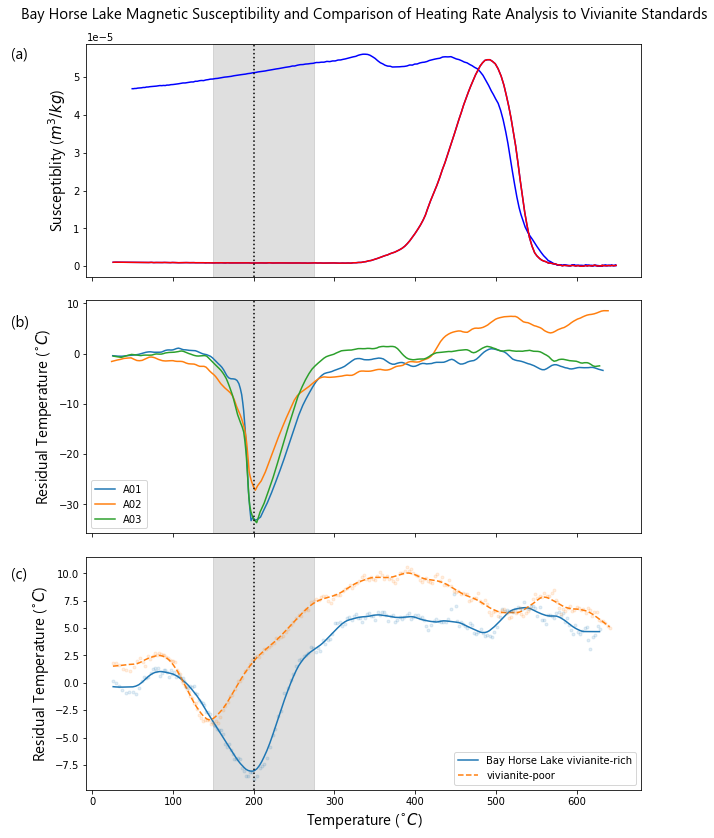

In [234]:
csfont = {'fontname':'Microsoft Tai Le', 'fontsize':15}

fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize = (10,12), sharex = True)

ax1.set_ylabel('Susceptiblity ($m^3/kg$)', **csfont)
ax1.plot(BSL_A01f['temp'], BSL_A01f['csusc'], 'b')
ax1.plot(BSL_A01['temp'], BSL_A01['csusc'], 'r')
ax1.axvline(200, color = 'black', linestyle = 'dotted')
ax1.axvspan(150, 275, color = 'grey', alpha = .25)
ax1.annotate('(a)', (0.015,.93), xycoords = 'figure fraction', **csfont)
ax1.ticklabel_format(axis = 'y', style = 'sci', scilimits = (0,0))

ax2.set_ylabel('Residual Temperature ($^{\circ}C$)', color = 'k', **csfont)
ax2.plot(vivian_det['v_A01'], vivian_det['loess_rv_A01'], '-', color = 'tab:blue', label = 'A01')
ax2.plot(vivian_det['v_A02'], vivian_det['loess_rv_A02'], '-', color = 'tab:orange', label = 'A02')
ax2.plot(vivian_det['v_A03'], vivian_det['loess_rv_A03'], '-', color = 'tab:green', label = 'A03')

ax2.axvline(200, color = 'black', linestyle = 'dotted')
ax2.axvspan(150, 275, color = 'grey', alpha = .25)
ax2.annotate('(b)', (0.015,.61), xycoords = 'figure fraction', **csfont)
ax2.legend()
#ax1.tick_params(axis='y', labelcolor=color)


ax3.set_ylabel('Residual Temperature ($^{\circ}C$)', **csfont)  # we already handled the x-label with ax1
ax3.plot(BSL_df['BSL_A01'], BSL_df['loess_r_BSL_A01'], '-', color = 'tab:blue', label = 'Bay Horse Lake vivianite-rich')
ax3.plot(BSL_df['BSL_B01'], BSL_df['loess_r_BSL_B01'], '--', color = 'tab:orange', label = 'vivianite-poor')

ax3.plot(BSL_df['BSL_A01'], BSL_df['r_BSL_A01'], '.', color = 'tab:blue', alpha = .125, label = '_nolegend_')
ax3.plot(BSL_df['BSL_B01'], BSL_df['r_BSL_B01'], '.', color = 'tab:orange', alpha = .125, label = '_nolegend_')


ax3.axvline(200, color = 'black', linestyle = 'dotted')
ax3.axvspan(150, 275, color = 'grey', alpha = .25)
ax3.set_xlabel('Temperature ($^{\circ}C$)', **csfont)
ax3.annotate('(c)', (0.015,.31), xycoords = 'figure fraction', **csfont)
ax3.legend(loc = 4)

ax1.set_title('Bay Horse Lake Magnetic Susceptibility and Comparison of Heating Rate Analysis to Vivianite Standards', y = 1.08, **csfont)


fig.tight_layout()  # otherwise the right y-label is slightly clipped
plt.show()

#fig.savefig('BayHorseLake_all_sm_richpoor')

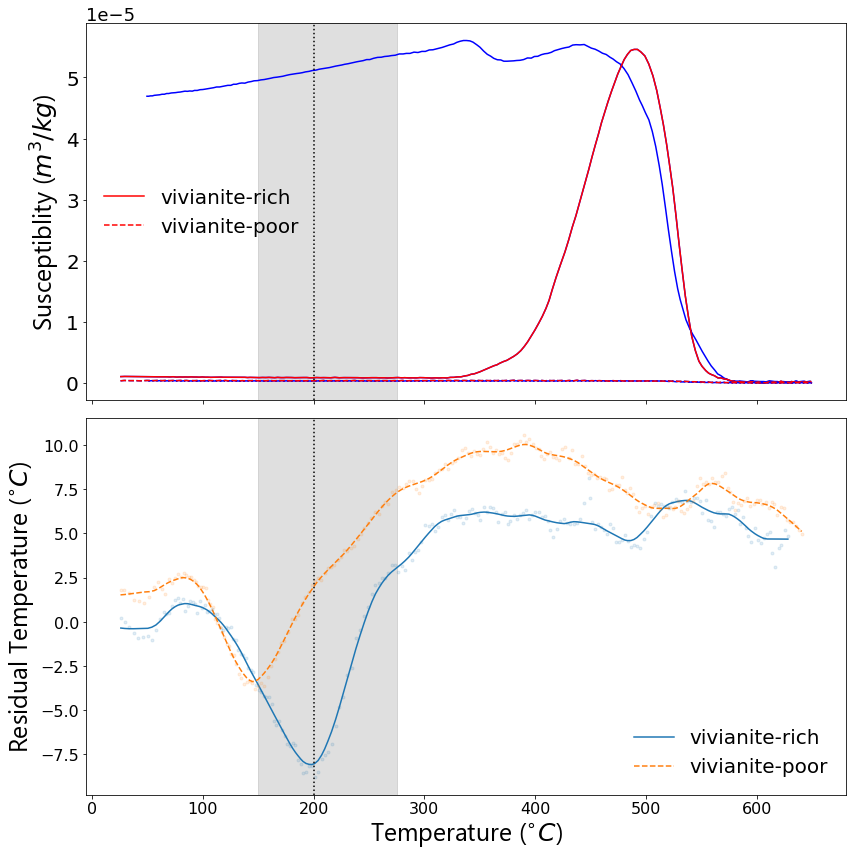

In [235]:
csfont = {'fontname':'Microsoft Tai Le', 'fontsize':25}

fig, (ax1, ax2) = plt.subplots(2, 1, figsize = (12,12), sharex = True)

ax1.set_ylabel('Susceptiblity ($m^3/kg$)', **csfont)
ax1.tick_params(axis='y', which='major', labelsize=20)
ax1.plot(BSL_A01f['temp'], BSL_A01f['csusc'], 'b', label = '_nolegend_')
ax1.plot(BSL_A01['temp'], BSL_A01['csusc'], 'r', label = 'vivianite-rich')
ax1.plot(BSL_B01f['temp'], BSL_B01f['csusc'], 'b--', label = '_nolegend_')
ax1.plot(BSL_B01['temp'], BSL_B01['csusc'], 'r--', label = 'vivianite-poor')
ax1.axvline(200, color = 'black', linestyle = 'dotted')
ax1.axvspan(150, 275, color = 'grey', alpha = .25)
ax1.ticklabel_format(axis = 'y', style = 'sci', scilimits = (0,0))
ax1.yaxis.offsetText.set_fontsize(18)
ax1.legend(prop={'size': 20}, frameon = False)


ax2.set_ylabel('Residual Temperature ($^{\circ}C$)', **csfont)  # we already handled the x-label with ax1
ax2.tick_params(axis='both', which='major', labelsize=16)
ax2.plot(BSL_df['BSL_A01'], BSL_df['loess_r_BSL_A01'], '-', color = 'tab:blue', label = 'vivianite-rich')
ax2.plot(BSL_df['BSL_B01'], BSL_df['loess_r_BSL_B01'], '--', color = 'tab:orange', label = 'vivianite-poor')

ax2.plot(BSL_df['BSL_A01'], BSL_df['r_BSL_A01'], '.', color = 'tab:blue', alpha = .125, label = '_nolegend_')
ax2.plot(BSL_df['BSL_B01'], BSL_df['r_BSL_B01'], '.', color = 'tab:orange', alpha = .125, label = '_nolegend_')


ax2.axvline(200, color = 'black', linestyle = 'dotted')
ax2.axvspan(150, 275, color = 'grey', alpha = .25)
ax2.set_xlabel('Temperature ($^{\circ}C$)', **csfont)
ax2.legend(loc = 4, prop={'size': 20}, frameon = False)

#ax1.set_title('Bay Horse Lake Magnetic Susceptibility and Comparison of Heating Rate Analysis to Vivianite Standards', y = 1.08, **csfont)


fig.tight_layout()  # otherwise the right y-label is slightly clipped
plt.show()

#fig.savefig('BayHorseLake_all_sm_diplot', dpi = 300, bbox_inches = 'tight')

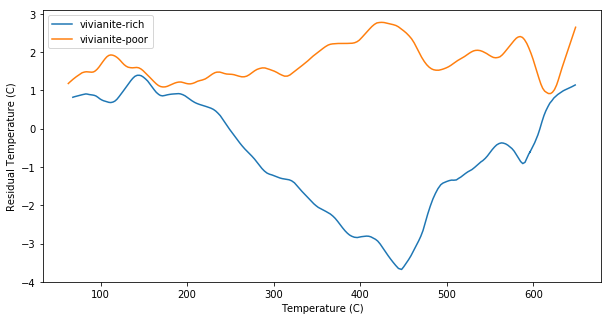

In [236]:
#plot on cooling
plt.figure(figsize = (10,5))
plt.plot(BSL_dfc['BSL_A01'], BSL_dfc['loess_r_BSL_A01'], label = 'vivianite-rich')
plt.plot(BSL_dfc['BSL_B01'], BSL_dfc['loess_r_BSL_B01'], label = 'vivianite-poor')
plt.xlabel('Temperature (C)')
plt.ylabel('Residual Temperature (C)')
plt.legend()

## Hoffman and Pan -- find how peak area will change with reaction temperature

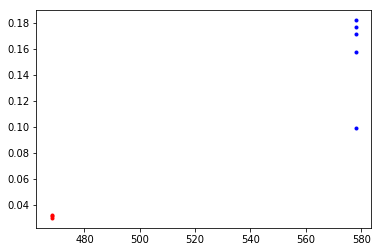

In [188]:
plt.plot(305*np.ones(len(Q_goeth))+273.15, Q_goeth, 'b.', label = 'goethite')
plt.plot(195*np.ones(len(Q_vivian))+273.15, Q_vivian, 'r.', label = 'vivianite')

In [189]:
QT_fit = np.polyfit(np.concatenate([305*np.ones(len(Q_goeth))+273.15,195*np.ones(len(Q_vivian))+273.15]), np.concatenate([Q_goeth,Q_vivian]), 1)

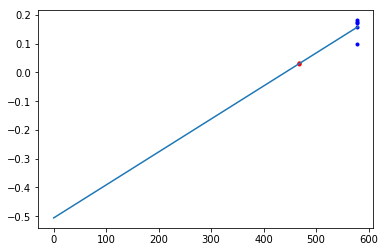

In [190]:
plt.plot(305*np.ones(len(Q_goeth))+273.15, Q_goeth, 'b.', label = 'goethite')
plt.plot(195*np.ones(len(Q_vivian))+273.15, Q_vivian, 'r.', label = 'vivianite')
plt.plot([0,580], np.polyval(QT_fit, [0,580]))

In [191]:
np.polyval(QT_fit, [0,500])

array([-0.50604291,  0.06767877])

{'whiskers': [<matplotlib.lines.Line2D at 0x18e47b00780>,
 'caps': [<matplotlib.lines.Line2D at 0x18e47b00e48>,
 'boxes': [<matplotlib.lines.Line2D at 0x18e47b00908>],
 'medians': [<matplotlib.lines.Line2D at 0x18e47ac1c18>],
 'fliers': [<matplotlib.lines.Line2D at 0x18e47d80550>],
 'means': []}

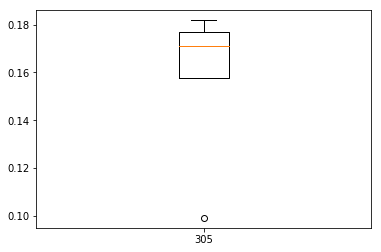

In [192]:
plt.boxplot(Q_goeth, positions = [305])
#plt.boxplot(Q_vivian, positions = [195])

C:\Users\docto\AppData\Local\Continuum\anaconda3\lib\site-packages\numpy\core\_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


{'whiskers': [<matplotlib.lines.Line2D at 0x18e48315198>,
 'caps': [<matplotlib.lines.Line2D at 0x18e4866b240>,
 'boxes': [<matplotlib.lines.Line2D at 0x18e483152b0>,
 'medians': [<matplotlib.lines.Line2D at 0x18e48668470>,
 'fliers': [<matplotlib.lines.Line2D at 0x18e48668e80>,
 'means': []}

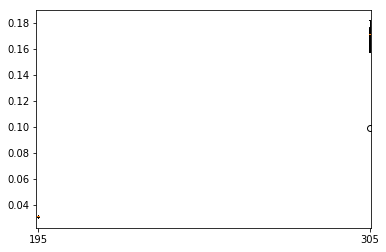

In [193]:
plt.boxplot([Q_goeth, Q_vivian], positions = [305, 195])


## Other Kappa

In [237]:
# download data (not through getminlog)
b_B52_f = pd.read_csv('Bestiary_MinLogs/MFK1/blank_B52.cur', delim_whitespace = True, skiprows = 1, names = ('temp', 'susc', 'csusc', 'nsusc', 'bulks', 'ferrt', 'ferrb', 'time', 'blank'))

b_B52_f.head()



,temp,susc,csusc,nsusc,bulks,ferrt,ferrb,time,blank
0,48.7,-183.0,0.0,0.0,0.0,0.0,0.0,0,0.0
1,44.8,-183.2,0.0,0.0,0.0,0.0,0.0,26,0.000
2,47.2,-183.2,0.0,0.0,0.0,0.0,0.0,48,0.000
3,51.8,-183.3,0.0,0.0,0.0,0.0,0.0,70,0.000
4,57.3,-183.2,0.0,0.0,0.0,0.0,0.0,92,0


In [238]:
# download data (not through getminlog)
goeth_B52_f = pd.read_csv('Bestiary_MinLogs/MFK1/goeth_B52.cur', delim_whitespace = True, index_col = None, skiprows = 1, names = ('temp', 'susc', 'csusc', 'nsusc', 'bulks', 'ferrt', 'ferrb', 'time', 'blank'))

goeth_B52_f.head()

,temp,susc,csusc,nsusc,bulks,ferrt,ferrb,time,blank
0,23.9,-178.7,0.0,0.0,0.0,0.0,0.0,0,0.0
1,25.2,-178.8,0.0,0.0,0.0,0.0,0.0,26,0.000
2,30.3,-178.8,0.0,0.0,0.0,0.0,0.0,48,0.000
3,37.6,-178.8,0.0,0.0,0.0,0.0,0.0,70,0.000
4,45.6,-178.8,0.0,0.0,0.0,0.0,0.0,92,0


In [239]:
# download data (not through getminlog)
b_B53_f = pd.read_csv('Bestiary_MinLogs/MFK1/blank_B53.cur', delim_whitespace = True, skiprows = 1, names = ('temp', 'susc', 'csusc', 'nsusc', 'bulks', 'ferrt', 'ferrb', 'time', 'blank'))

b_B53_f.head()

# download data (not through getminlog)
goeth_B53_f = pd.read_csv('Bestiary_MinLogs/MFK1/goeth_B53.cur', delim_whitespace = True, skiprows = 1, names = ('temp', 'susc', 'csusc', 'nsusc', 'bulks', 'ferrt', 'ferrb', 'time', 'blank'))

goeth_B52_f.head()

,temp,susc,csusc,nsusc,bulks,ferrt,ferrb,time,blank
0,23.9,-178.7,0.0,0.0,0.0,0.0,0.0,0,0.0
1,25.2,-178.8,0.0,0.0,0.0,0.0,0.0,26,0.000
2,30.3,-178.8,0.0,0.0,0.0,0.0,0.0,48,0.000
3,37.6,-178.8,0.0,0.0,0.0,0.0,0.0,70,0.000
4,45.6,-178.8,0.0,0.0,0.0,0.0,0.0,92,0


In [240]:
# download data (not through getminlog)
b_B54_f = pd.read_csv('Bestiary_MinLogs/MFK1/blank_B54.cur', delim_whitespace = True, skiprows = 1, names = ('temp', 'susc', 'csusc', 'nsusc', 'bulks', 'ferrt', 'ferrb', 'time', 'blank'))

b_B54_f.head()

# download data (not through getminlog)
goeth_B54_f = pd.read_csv('Bestiary_MinLogs/MFK1/goeth_B54.cur', delim_whitespace = True, index_col = None, skiprows = 1, names = ('temp', 'susc', 'csusc', 'nsusc', 'bulks', 'ferrt', 'ferrb', 'time', 'blank'))

goeth_B54_f.head()

,temp,susc,csusc,nsusc,bulks,ferrt,ferrb,time,blank
0,25.2,-179.5,0.0,0.0,0.0,0.0,0.0,0,0.0
1,26.2,-179.6,0.0,0.0,0.0,0.0,0.0,26,0.000
2,31.9,-179.5,0.0,0.0,0.0,0.0,0.0,48,0.000
3,39.6,-179.6,0.0,0.0,0.0,0.0,0.0,70,0.000
4,47.7,-179.5,0.0,0.0,0.0,0.0,0.0,92,0


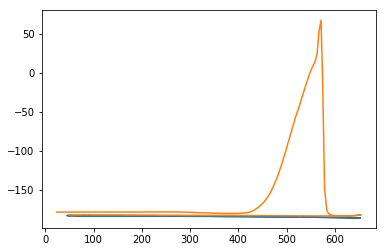

In [241]:
plt.plot(b_B52_f['temp'], b_B52_f['susc'])
plt.plot(goeth_B52_f['temp'], goeth_B52_f['susc'])

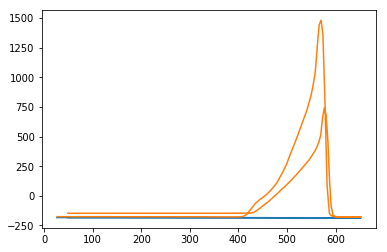

In [242]:
plt.plot(b_B53_f['temp'], b_B53_f['susc'])
plt.plot(goeth_B53_f['temp'], goeth_B53_f['susc'])

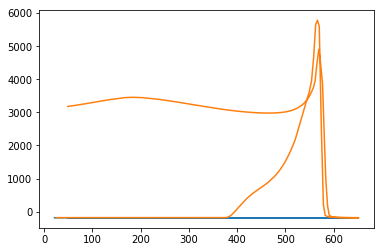

In [243]:
plt.plot(b_B54_f['temp'], b_B54_f['susc'])
plt.plot(goeth_B54_f['temp'], goeth_B54_f['susc'])

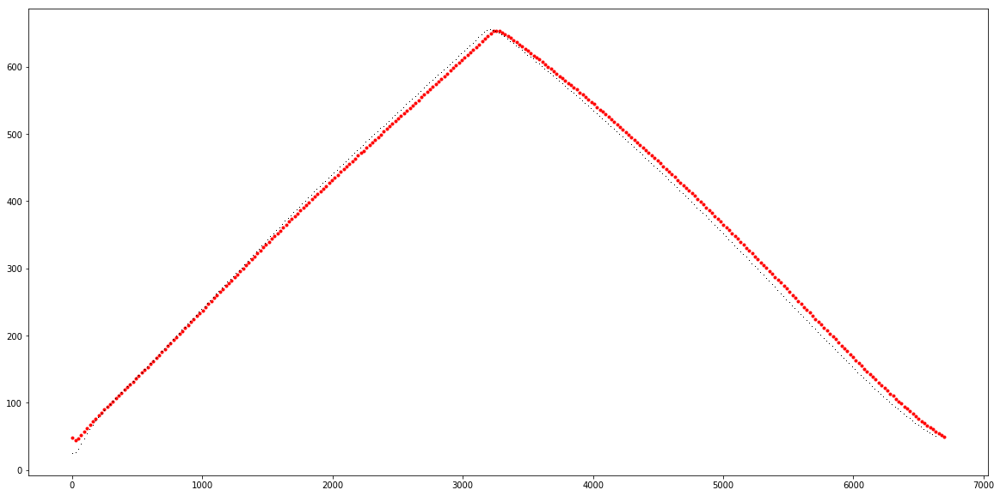

In [244]:
plt.figure(figsize = (20, 10))
plt.plot(b_B52_f['time'], b_B52_f['temp'], 'r.')
plt.plot(goeth_B52_f['time'], goeth_B52_f['temp'], 'k,')

In [245]:
# split into heating and cooling
Tmax = max(b_B52_f['temp'])
b_B52_f.loc[:,'sec'] = 'cool' 
iTmax = b_B52_f.index[b_B52_f['temp'] == Tmax][0]
b_B52_f.loc[0:iTmax, 'sec'] = 'heat'

b_B52 = b_B52_f[b_B52_f['sec'] == 'heat'].copy()

# split into heating and cooling
Tmax = max(goeth_B52_f['temp'])
goeth_B52_f.loc[:,'sec'] = 'cool' 
iTmax = goeth_B52_f.index[goeth_B52_f['temp'] == Tmax][0]
goeth_B52_f.loc[0:iTmax, 'sec'] = 'heat'

goeth_B52 = goeth_B52_f[goeth_B52_f['sec'] == 'heat'].copy()


In [246]:
# split into heating and cooling
Tmax = max(b_B53_f['temp'])
b_B53_f.loc[:,'sec'] = 'cool' 
iTmax = b_B53_f.index[b_B53_f['temp'] == Tmax][0]
b_B53_f.loc[0:iTmax, 'sec'] = 'heat'

b_B53 = b_B53_f[b_B53_f['sec'] == 'heat'].copy()

# split into heating and cooling
Tmax = max(goeth_B53_f['temp'])
goeth_B53_f.loc[:,'sec'] = 'cool' 
iTmax = goeth_B53_f.index[goeth_B53_f['temp'] == Tmax][0]
goeth_B53_f.loc[0:iTmax, 'sec'] = 'heat'

goeth_B53 = goeth_B53_f[goeth_B53_f['sec'] == 'heat'].copy()


In [247]:
# split into heating and cooling
Tmax = max(b_B54_f['temp'])
b_B54_f.loc[:,'sec'] = 'cool' 
iTmax = b_B54_f.index[b_B54_f['temp'] == Tmax][0]
b_B54_f.loc[0:iTmax, 'sec'] = 'heat'

b_B54 = b_B54_f[b_B54_f['sec'] == 'heat'].copy()

# split into heating and cooling
Tmax = max(goeth_B54_f['temp'])
goeth_B54_f.loc[:,'sec'] = 'cool' 
iTmax = goeth_B54_f.index[goeth_B54_f['temp'] == Tmax][0]
goeth_B54_f.loc[0:iTmax, 'sec'] = 'heat'

goeth_B54 = goeth_B54_f[goeth_B54_f['sec'] == 'heat'].copy()


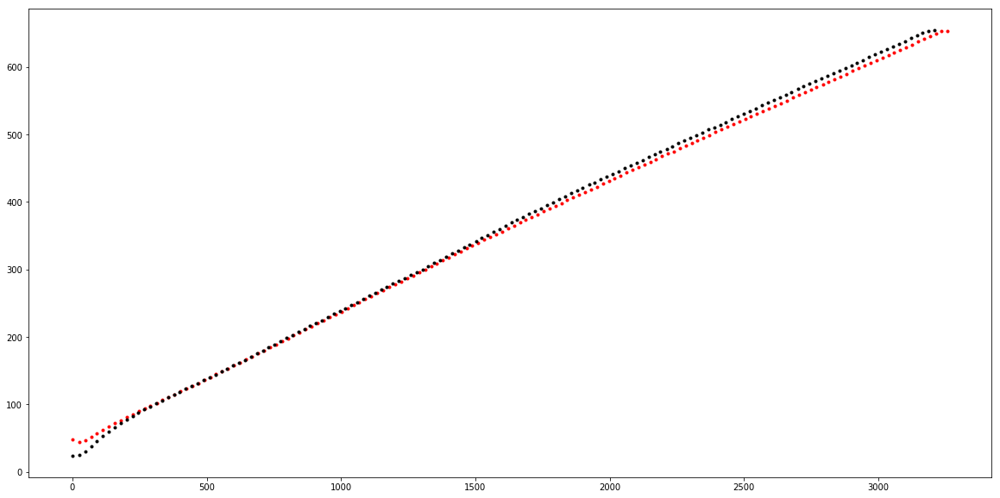

In [248]:
plt.figure(figsize = (20, 10))
plt.plot(b_B52['time'], b_B52['temp'], 'r.')
plt.plot(goeth_B52['time'], goeth_B52['temp'], 'k.')

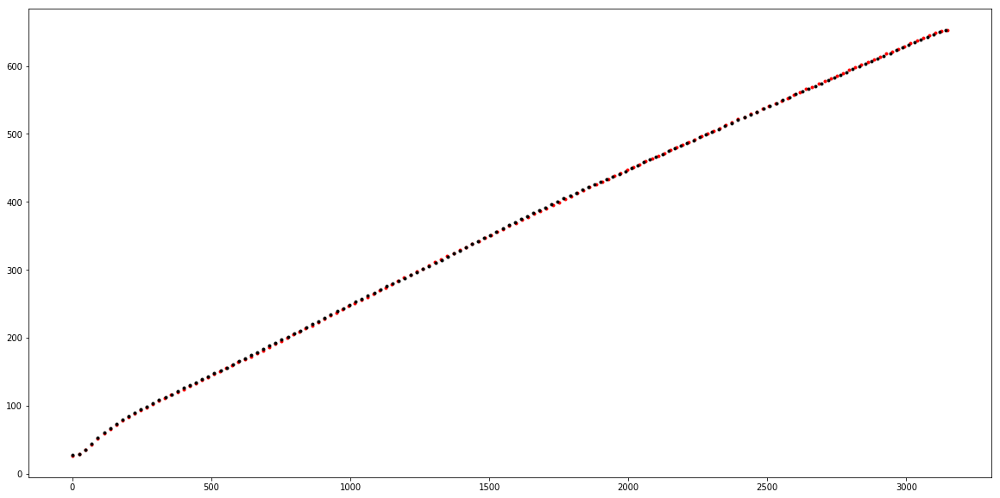

In [249]:
plt.figure(figsize = (20, 10))
plt.plot(b_B53['time'], b_B53['temp'], 'r.')
plt.plot(goeth_B53['time'], goeth_B53['temp'], 'k.')

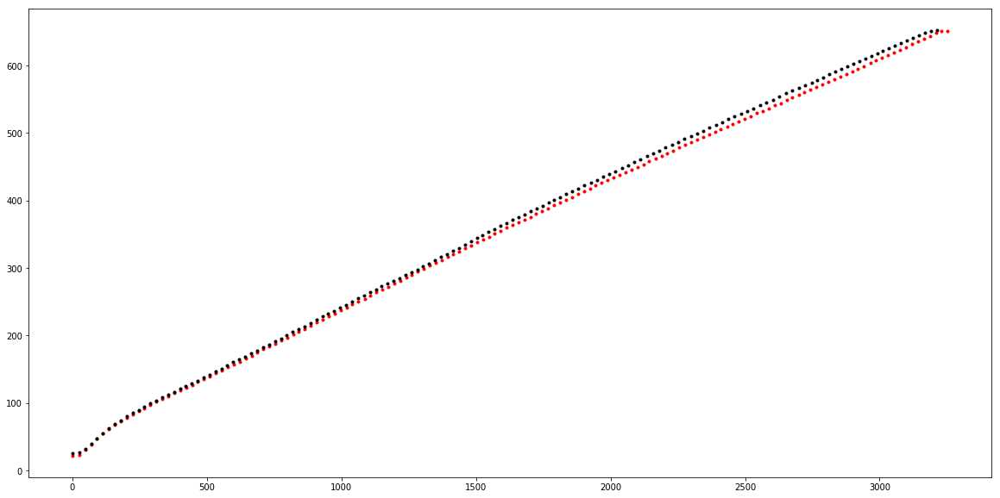

In [250]:
plt.figure(figsize = (20, 10))
plt.plot(b_B54['time'], b_B54['temp'], 'r.')
plt.plot(goeth_B54['time'], goeth_B54['temp'], 'k.')

In [251]:
# time vector
t = np.arange(0,3450,15)

# linear interpolate each and write in terms of t

int_b52 = interp1d(b_B52['time'][:-5], b_B52['temp'][:-5], kind = 'linear', bounds_error = False)
blank_B52 = int_b52(t)
int_b53 = interp1d(b_B53['time'][:-5], b_B53['temp'][:-5], kind = 'linear', bounds_error = False)
blank_B53 = int_b53(t)
int_b54 = interp1d(b_B54['time'][:-5], b_B54['temp'][:-5], kind = 'linear', bounds_error = False)
blank_B54 = int_b54(t)


int_gB52 = interp1d(goeth_B52['time'][:-5], goeth_B52['temp'][:-5], kind = 'linear', bounds_error = False)
g_B52 = int_gB52(t)
int_gB53 = interp1d(goeth_B53['time'][:-5], goeth_B53['temp'][:-5], kind = 'linear', bounds_error = False)
g_B53 = int_gB53(t)
int_gB54 = interp1d(goeth_B54['time'][:-5], goeth_B54['temp'][:-5], kind = 'linear', bounds_error = False)
g_B54 = int_gB54(t)



mfk1 = pd.DataFrame({'time':t, 'b_B52': blank_B52, 'b_B53': blank_B53, 'b_B54': blank_B54, 'g_B52': g_B52, 'g_B53': g_B53, 'g_B54': g_B54})

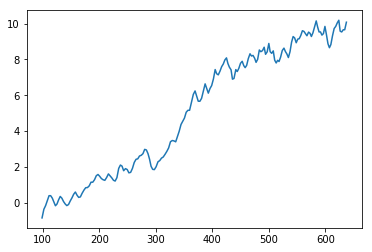

In [252]:
plt.plot(figure = (10,5))
plt.plot(mfk1['g_B52'][20:], mfk1['g_B52'][20:]-mfk1['b_B52'][20:])

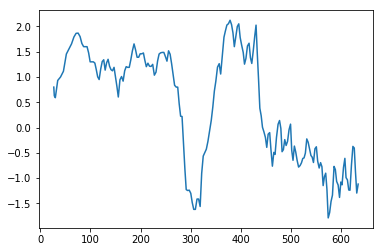

In [253]:
plt.plot(figure = (10,5))
plt.plot(mfk1['g_B53'], mfk1['g_B53']-mfk1['b_B53'])

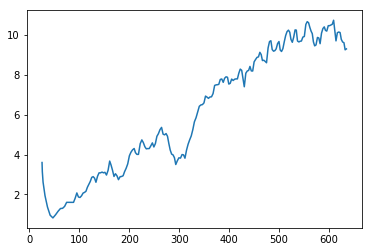

In [254]:
plt.plot(figure = (10,5))
plt.plot(mfk1['g_B54'], mfk1['g_B54']-mfk1['b_B54'])

In [255]:
# start with same data frame
mfk1_det = mfk1.copy()

# calc residuals
mfk1_det['rg_B52'] = mfk1_det['g_B52']-mfk1_det['b_B52']
mfk1_det['rg_B53'] = mfk1_det['g_B53']-mfk1_det['b_B53']
mfk1_det['rg_B54'] = mfk1_det['g_B54']-mfk1_det['b_B54']


mfk1_det.dropna(inplace = True)

# best fit line
fit_gB52 = np.polyfit(mfk1_det['g_B52'][20:], mfk1_det['rg_B52'][20:],1)
mfk1_det['d_rg_B52'] = mfk1_det['rg_B52'] - (fit_gB52[0]*mfk1_det['g_B52']+fit_gB52[1])

fit_gB53 = np.polyfit(mfk1_det['g_B53'][20:], mfk1_det['rg_B53'][20:],1)
mfk1_det['d_rg_B53'] = mfk1_det['rg_B53'] - (fit_gB53[0]*mfk1_det['g_B53']+fit_gB53[1])

fit_gB54 = np.polyfit(mfk1_det['g_B54'][20:], mfk1_det['rg_B54'][20:],1)
mfk1_det['d_rg_B54'] = mfk1_det['rg_B54'] - (fit_gB54[0]*mfk1_det['g_B54']+fit_gB54[1])


# smoothed
mfk1_det['loess_d_rg_B52'] = sm.nonparametric.lowess(mfk1_det['d_rg_B52'], mfk1_det['g_B52'], frac = .08, return_sorted = False)
mfk1_det['loess_d_rg_B53'] = sm.nonparametric.lowess(mfk1_det['d_rg_B53'], mfk1_det['g_B53'], frac = .08, return_sorted = False)
mfk1_det['loess_d_rg_B54'] = sm.nonparametric.lowess(mfk1_det['d_rg_B54'], mfk1_det['g_B54'], frac = .08, return_sorted = False)


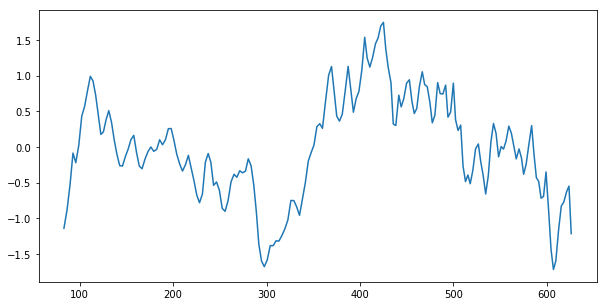

In [256]:
plt.figure(figsize = (10,5))
plt.plot(mfk1_det['g_B52'][15:], mfk1_det['d_rg_B52'][15:])

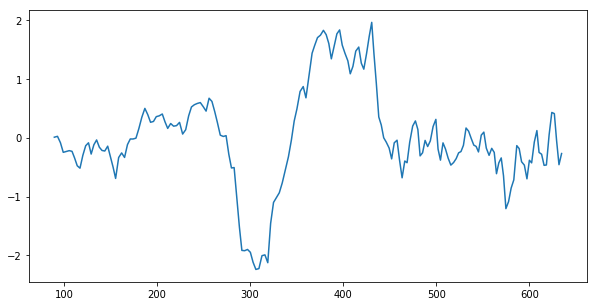

In [257]:
plt.figure(figsize = (10,5))
plt.plot(mfk1_det['g_B53'][15:], mfk1_det['d_rg_B53'][15:])

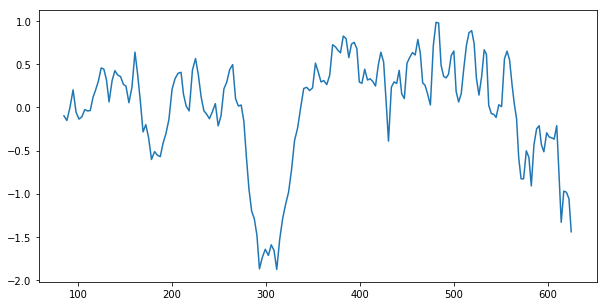

In [258]:
plt.figure(figsize = (10,5))
plt.plot(mfk1_det['g_B54'][15:], mfk1_det['d_rg_B54'][15:])

Text(0.5, 1.0, 'Comparison of goethite on KYL-2 and MFK1')

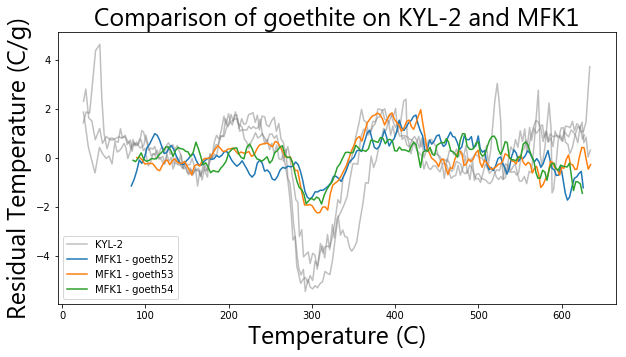

In [259]:
# just comparing them straight on
plt.figure(figsize = (10,5))

#plt.plot(mix_df['mix_C01'], mix_df['d_r_mix_C01'], label = 'Experiment')

plt.plot(goeth_det['g_B01'], goeth_det['d_rg_B01'], label = 'KYL-2', color = 'grey', alpha = .5)
plt.plot(goeth_det['g_B02'], goeth_det['d_rg_B02'], label = '_nolegend_', color = 'grey', alpha = .5)
plt.plot(goeth_det['g_B10'], goeth_det['d_rg_B10'], label = '_nolegend_', color = 'grey', alpha = .5)

plt.plot(mfk1_det['g_B52'][15:], mfk1_det['d_rg_B52'][15:], label = 'MFK1 - goeth52')
plt.plot(mfk1_det['g_B53'][15:], mfk1_det['d_rg_B53'][15:], label = 'MFK1 - goeth53')
#plt.plot(mfk1_det['g_B53'][15:], mfk1_det['rg_B53'][15:], label = 'mfk1 - goeth53 non ')
plt.plot(mfk1_det['g_B54'][15:], mfk1_det['d_rg_B54'][15:], label = 'MFK1 - goeth54')


plt.xlabel('Temperature (C)', **csfont)
plt.ylabel('Residual Temperature (C/g)', **csfont)
plt.legend()
plt.title('Comparison of goethite on KYL-2 and MFK1', **csfont)

#plt.savefig('Kappa_comp_kDTA')

Text(0.5, 1.0, 'Comparison of all Mass Normalized Samples')

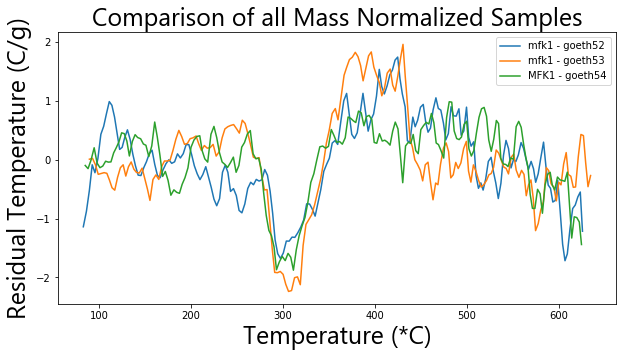

In [260]:
# just comparing them straight on
plt.figure(figsize = (10,5))


plt.plot(mfk1_det['g_B52'][15:], mfk1_det['d_rg_B52'][15:], label = 'mfk1 - goeth52')
plt.plot(mfk1_det['g_B53'][15:], mfk1_det['d_rg_B53'][15:], label = 'mfk1 - goeth53')
#plt.plot(mfk1_det['g_B53'][15:], mfk1_det['rg_B53'][15:], label = 'mfk1 - goeth53 non ')
plt.plot(mfk1_det['g_B54'][15:], mfk1_det['d_rg_B54'][15:], label = 'MFK1 - goeth54')

plt.xlabel('Temperature (*C)', **csfont)
plt.ylabel('Residual Temperature (C/g)', **csfont)
plt.legend()
plt.title('Comparison of all Mass Normalized Samples', **csfont)

In [261]:
# B52
b_B52 = 77
e_B52 = 110

area_B52 = riemann_left(mfk1_det, 'g_B52', 'loess_d_rg_B52', b_B52, e_B52)

# B53
b_B53 = 67
e_B53 = 110

area_B53 = riemann_left(mfk1_det, 'g_B53', 'loess_d_rg_B53', b_B53, e_B53)

# B54
b_B54 = 74
e_B54 = 102

area_B54 = riemann_left(mfk1_det, 'g_B54', 'loess_d_rg_B54', b_B54, e_B54)

Text(0.5, 1.0, 'Comparison of all Detrended Goethite')

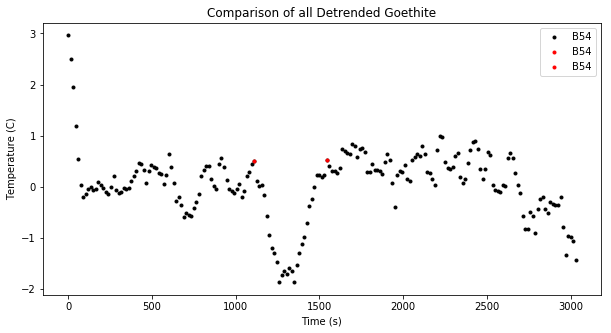

In [262]:
plt.figure(figsize = (10,5))

b = 74
e = 103

#plt.plot(mfk1_det['time'][20:], mfk1_det['d_rg_B52'][20:], 'k.', label = 'B52')
#plt.plot(mfk1_det['time'][b], mfk1_det['d_rg_B52'][b], 'r.', label = 'B52')
#plt.plot(mfk1_det['time'][e], mfk1_det['d_rg_B52'][e], 'r.', label = 'B52')

#plt.plot(mfk1_det['time'], mfk1_det['d_rg_B53'], 'k.', label = 'B53')
#plt.plot(mfk1_det['time'][b], mfk1_det['d_rg_B53'][b], 'r.', label = 'B53')
#plt.plot(mfk1_det['time'][e], mfk1_det['d_rg_B53'][e], 'r.', label = 'B53')

plt.plot(mfk1_det['time'], mfk1_det['d_rg_B54'], 'k.', label = 'B54')
plt.plot(mfk1_det['time'][b], mfk1_det['d_rg_B54'][b], 'r.', label = 'B54')
plt.plot(mfk1_det['time'][e], mfk1_det['d_rg_B54'][e], 'r.', label = 'B54')

plt.xlabel('Time (s)')
plt.ylabel('Temperature (C)')
plt.legend()
plt.title('Comparison of all Detrended Goethite')

Text(0.5, 1.0, 'Comparison of all Detrended Goethite')

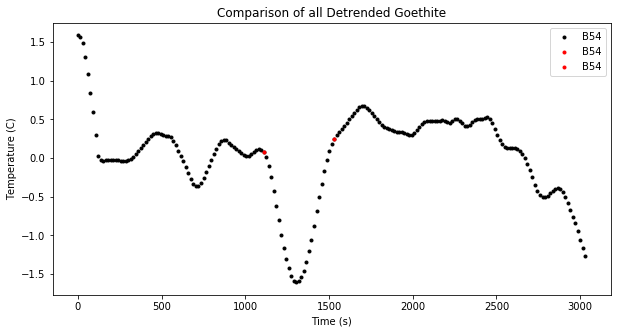

In [263]:
plt.figure(figsize = (10,5))

b = 74
e = 102

# plt.plot(mfk1_det['time'][20:], mfk1_det['loess_d_rg_B52'][20:], 'k.', label = 'B52')
# plt.plot(mfk1_det['time'][b], mfk1_det['loess_d_rg_B52'][b], 'r.', label = 'B52')
# plt.plot(mfk1_det['time'][e], mfk1_det['loess_d_rg_B52'][e], 'r.', label = 'B52')

# plt.plot(mfk1_det['time'], mfk1_det['loess_d_rg_B53'], 'k.', label = 'B53')
# plt.plot(mfk1_det['time'][b], mfk1_det['loess_d_rg_B53'][b], 'r.', label = 'B53')
# plt.plot(mfk1_det['time'][e], mfk1_det['loess_d_rg_B53'][e], 'r.', label = 'B53')

plt.plot(mfk1_det['time'], mfk1_det['loess_d_rg_B54'], 'k.', label = 'B54')
plt.plot(mfk1_det['time'][b], mfk1_det['loess_d_rg_B54'][b], 'r.', label = 'B54')
plt.plot(mfk1_det['time'][e], mfk1_det['loess_d_rg_B54'][e], 'r.', label = 'B54')

plt.xlabel('Time (s)')
plt.ylabel('Temperature (C)')
plt.legend()
plt.title('Comparison of all Detrended Goethite')

Raw data:
B52: 80-109
B53: 69-109
B54: 74-103

Smoothed Data:
B52: 77-110
B53: 67-110
B54: 74-102

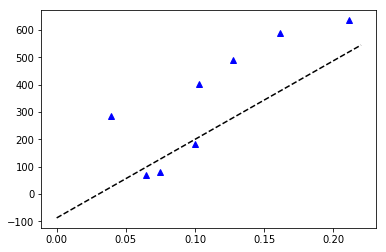

In [264]:
plt.plot(np.array([0.16142   , 0.1274    , 0.10303   , 0.21157   , 0.03954599, 0.06457, 0.09968, .07487]), np.array([588.43094532, 489.79445385, 401.85930216, 635.70296014,
       285.93527596, np.abs(area_B52), np.abs(area_B53), np.abs(area_B54)]), 'b^')
plt.plot([0,.22], areafit_w0[0][0] * np.array([0,.22]) +areafit_w0[0][1]-180, 'k--')

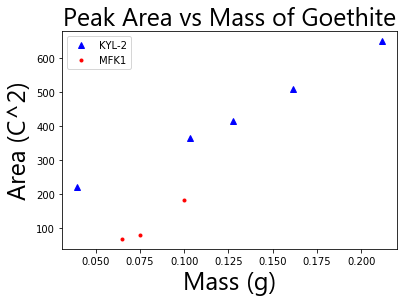

In [265]:
plt.plot(mass_g, np.abs(area), 'b^', label = 'KYL-2')
plt.plot(( 0.06457, 0.09968, .07487), (np.abs(area_B52), np.abs(area_B53), np.abs(area_B54)), 'r.', label = 'MFK1')
plt.xlabel('Mass (g)', **csfont)
plt.ylabel('Area (C^2)', **csfont)
plt.title('Peak Area vs Mass of Goethite', **csfont)
plt.legend()


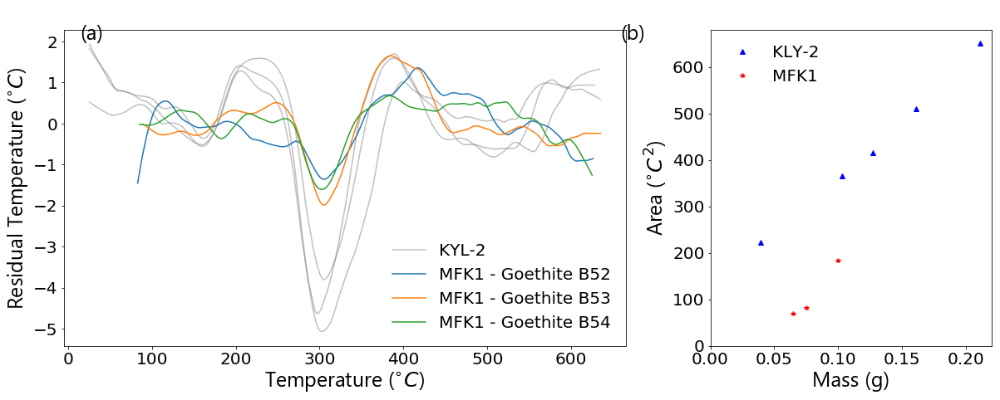

In [275]:
csfont = {'fontname':'Microsoft Tai Le', 'fontsize':25}

f, (a0, a1) = plt.subplots(1, 2, gridspec_kw={'width_ratios': [2, 1]}, figsize = (20,7))

# kDTA
a0.plot(goeth_det['g_B01'], goeth_det['loess_d_rg_B01'], label = 'KYL-2', color = 'grey', alpha = .5)
a0.plot(goeth_det['g_B02'], goeth_det['loess_d_rg_B02'], label = '_nolegend_', color = 'grey', alpha = .5)
a0.plot(goeth_det['g_B10'], goeth_det['loess_d_rg_B10'], label = '_nolegend_', color = 'grey', alpha = .5)

a0.plot(mfk1_det['g_B52'][15:], mfk1_det['loess_d_rg_B52'][15:], label = 'MFK1 - Goethite B52')
a0.plot(mfk1_det['g_B53'][15:], mfk1_det['loess_d_rg_B53'][15:], label = 'MFK1 - Goethite B53')
a0.plot(mfk1_det['g_B54'][15:], mfk1_det['loess_d_rg_B54'][15:], label = 'MFK1 - Goethite B54')


a0.set_xlabel('Temperature ($^{\circ}C$)', **csfont)
a0.set_ylabel('Residual Temperature ($^{\circ}C$)', **csfont)
a0.tick_params(axis='both', which='major', labelsize=20)
a0.legend(prop={'size': 20}, frameon = False)
#a0.set_title('Comparison of goethite on KYL-2 and MFK1', **csfont)

#a0.annotate('(a)', (0.05,.93), xycoords = 'figure fraction', **csfont) #ehat looks best here
a0.annotate('(a)', (0.08,.90), xycoords = 'figure fraction', **csfont)


# area v mass
a1.plot(mass_g, np.abs(area), 'b^', label = 'KLY-2')
a1.plot(( 0.06457, 0.09968, .07487), (np.abs(area_B52), np.abs(area_B53), np.abs(area_B54)), 'r*', label = 'MFK1')
a1.set_xlim(left = 0)
a1.set_ylim(bottom = 0)
a1.set_xlabel('Mass (g)', **csfont)
a1.set_ylabel('Area ($^{\circ}C^2$)', **csfont)
a1.tick_params(axis='both', which='major', labelsize=20)
#a1.set_title('Peak Area vs Mass of Goethite', **csfont)
a1.legend(prop={'size': 20}, frameon = False)

#a1.annotate('(b)', (0.66,.93), xycoords = 'figure fraction', **csfont) # what looks best here
a1.annotate('(b)', (0.62,.90), xycoords = 'figure fraction', **csfont)


#f.savefig('mfk1_goeth_kDTA_area_sm', dpi = 300)

Text(0.62, 0.9, '(b)')

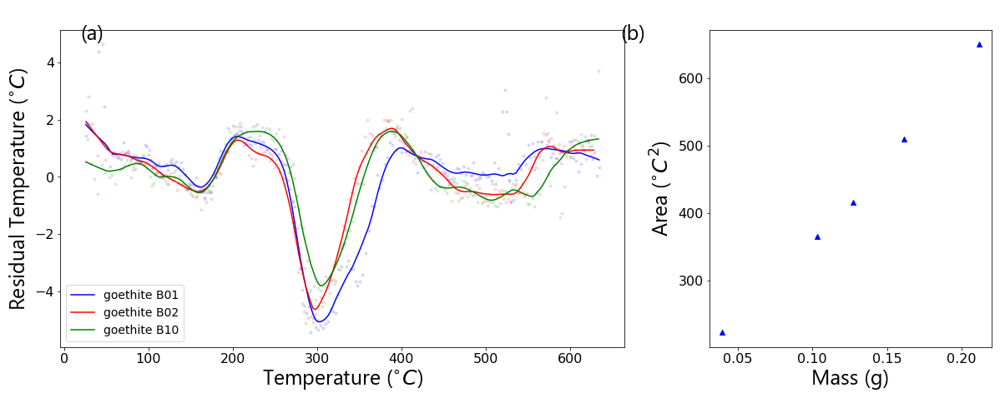

In [267]:
f1, (a0, a1) = plt.subplots(1, 2, gridspec_kw={'width_ratios': [2, 1]}, figsize = (20,7))

# kDTA
a0.plot(goeth_det['g_B01'], goeth_det['loess_d_rg_B01'], 'b-', label = 'goethite B01')
a0.plot(goeth_det['g_B02'], goeth_det['loess_d_rg_B02'], 'r-', label = 'goethite B02')
a0.plot(goeth_det['g_B10'], goeth_det['loess_d_rg_B10'], 'g-', label = 'goethite B10')

a0.plot(goeth_det['g_B01'], goeth_det['d_rg_B01'], 'b.', label = '_nolegend_', alpha = .125)
a0.plot(goeth_det['g_B02'], goeth_det['d_rg_B02'], 'r.', label = '_nolegend_', alpha = .125)
a0.plot(goeth_det['g_B10'], goeth_det['d_rg_B10'], 'g.', label = '_nolegend_', alpha = .125)


a0.set_xlabel('Temperature ($^{\circ}C$)', **csfont)
a0.set_ylabel('Residual Temperature ($^{\circ}C$)', **csfont)
a0.tick_params(axis='both', which='major', labelsize=16)
a0.legend(prop={'size': 14})
#a0.set_title('Goethite Residual Temperature', **csfont)

#a0.annotate('(a)', (0.05,.93), xycoords = 'figure fraction', **csfont) #ehat looks best here
a0.annotate('(a)', (0.08,.90), xycoords = 'figure fraction', **csfont)


# area v mass
a1.plot(mass_g, np.abs(area), 'b^', label = 'KLY-2')
#a1.plot(( 0.06457, 0.09968, .07487), (np.abs(area_B52), np.abs(area_B53), np.abs(area_B54)), 'r*', label = 'MFK1')
a1.set_xlabel('Mass (g)', **csfont)
a1.set_ylabel('Area ($^{\circ}C^2$)', **csfont)
a1.tick_params(axis='both', which='major', labelsize=16)
#a1.set_title('Peak Area vs Mass of Goethite', **csfont)
#a1.legend()

#a1.annotate('(b)', (0.66,.93), xycoords = 'figure fraction', **csfont) # what looks best here
a1.annotate('(b)', (0.62,.90), xycoords = 'figure fraction', **csfont)


#f1.savefig('goeth_kDTA_area', dpi = f.dpi)

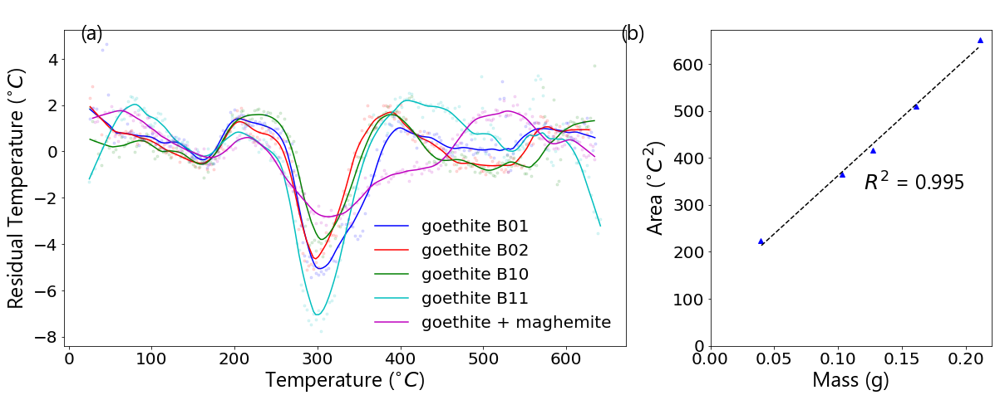

In [274]:
csfont = {'fontname':'Microsoft Tai Le', 'fontsize':25}

f1, (a0, a1) = plt.subplots(1, 2, gridspec_kw={'width_ratios': [2, 1]}, figsize = (20,7))

# kDTA
a0.plot(goeth_det['g_B01'], goeth_det['loess_d_rg_B01'], 'b-', label = 'goethite B01')
a0.plot(goeth_det['g_B02'], goeth_det['loess_d_rg_B02'], 'r-', label = 'goethite B02')
a0.plot(goeth_det['g_B10'], goeth_det['loess_d_rg_B10'], 'g-', label = 'goethite B10')
a0.plot(goeth_det['g_B11'], goeth_det['loess_d_rg_B11'], 'c-', label = 'goethite B11')
a0.plot(mix_df['mix_C01'], mix_df['loess_d_r_mix_C01'], 'm-', label = 'goethite + maghemite')

a0.plot(goeth_det['g_B01'], goeth_det['d_rg_B01'], 'b.', label = '_nolegend_', alpha = .125)
a0.plot(goeth_det['g_B02'], goeth_det['d_rg_B02'], 'r.', label = '_nolegend_', alpha = .125)
a0.plot(goeth_det['g_B10'], goeth_det['d_rg_B10'], 'g.', label = '_nolegend_', alpha = .125)
a0.plot(goeth_det['g_B11'], goeth_det['d_rg_B11'], 'c.', label = '_nolegend_', alpha = .125)
a0.plot(mix_df['mix_C01'], mix_df['d_r_mix_C01'], 'm.', label = '_nolegend_', alpha = .125)


a0.set_xlabel('Temperature ($^{\circ}C$)', **csfont)
a0.set_ylabel('Residual Temperature ($^{\circ}C$)', **csfont)
a0.tick_params(axis='both', which='major', labelsize=20)
a0.legend(prop={'size': 20}, frameon = False)
#a0.set_title('Goethite Residual Temperature', **csfont)

#a0.annotate('(a)', (0.05,.93), xycoords = 'figure fraction', **csfont) #ehat looks best here
a0.annotate('(a)', (0.08,.90), xycoords = 'figure fraction', **csfont)


# area v mass
a1.plot(mass_g, np.abs(area), 'b^', label = 'KLY-2')
#a1.plot(( 0.06457, 0.09968, .07487), (np.abs(area_B52), np.abs(area_B53), np.abs(area_B54)), 'r*', label = 'MFK1')
a1.plot(mass_r, areafit[0][0] * mass_r +areafit[0][1], 'k--')
a1.set_xlim(left = 0)
a1.set_ylim(bottom = 0)
a1.annotate('$R^2$ = 0.995', (.12,330), **csfont)
a1.set_xlabel('Mass (g)', **csfont)
a1.set_ylabel('Area ($^{\circ}C^2$)', **csfont)
a1.tick_params(axis='both', which='major', labelsize=20)
#a1.set_title('Peak Area vs Mass of Goethite', **csfont)
#a1.legend()

#a1.annotate('(b)', (0.66,.93), xycoords = 'figure fraction', **csfont) # what looks best here
a1.annotate('(b)', (0.62,.90), xycoords = 'figure fraction', **csfont)


#f1.savefig('goethall_kDTA_area_sm', dpi = 300)

## Making example plots

In [ ]:
tex = np.arange(0,100)

#blank
bex = 10*tex

#endothemic
endoex = bex.copy()
endoex[45:55] = endoex[45]
#endoex[55:100] = endoex[55:100] - 1

In [ ]:
endo_ex = pd.read_csv('Endo_Example.csv', names = ('time', 'temp'), skiprows = 1)

In [ ]:
fig, ax = plt.subplots(figsize = (8,5))
ax.plot(tex, bex, label = 'Constant Heating Rate')
ax.plot(tex, endoex, label = 'Sample')
ax.set_xlabel('Time (s) ----->')
ax.set_ylabel('Residual Temperature (C) ----->')
#ax.set_xticks([])
#ax.set_yticks([])
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.legend()

In [ ]:
fig, ax = plt.subplots(figsize = (8,5))
ax.plot(tex, bex, label = 'Constant Heating Rate')
ax.plot(endo_ex['time'], endo_ex['temp'], label = 'Sample')
ax.set_xlabel('Time (s) ----->')
ax.set_ylabel('Residual Temperature (C) ----->')
ax.set_xticks([])
ax.set_yticks([])
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.legend()

In [ ]:
endo_int = interp1d(endo_ex['time'], endo_ex['temp'], kind = 'linear', bounds_error = False)
endoex = endo_int(tex)

In [ ]:
fig, ax = plt.subplots(figsize = (8,5))
ax.plot(endoex, endoex-bex, color = 'orange')
ax.set_xlabel('Temperature (C) ----->')
ax.set_ylabel('Residual Temperature (C) ----->')
ax.set_xticks([])
ax.set_yticks([])
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

In [ ]:
#exothermic
exoex = 9*tex
exoex[45] = exoex[55]
exoex[46:100] = exoex[46:100] + 90

In [ ]:
fig, ax = plt.subplots(figsize = (8,5))
ax.plot(tex, bex, label = 'Constant Heating Rate')
ax.plot(tex, exoex, label = 'Sample')
ax.set_xlabel('Time (s) ----->')
ax.set_ylabel('Residual Temperature (C) ----->')
ax.set_xticks([])
ax.set_yticks([])
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.legend()

In [ ]:
fig, ax = plt.subplots(figsize = (8,5))
ax.plot(bex, exoex-bex, color = 'orange')
ax.hlines(0,0,1000, linestyle = 'dashed')
ax.set_xlabel('Temperature (C) ----->')
ax.set_ylabel('Residual Temperature (C) ----->')
ax.set_xticks([])
ax.set_yticks([])
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

In [ ]:
rxns_ex = pd.read_csv('Rxn_examples.csv', names = ('time', 'temp'), skiprows = 1)

In [ ]:
fig, ax = plt.subplots(figsize = (8,5))
ax.plot(tex, bex, 'k--', label = 'Constant Heating Rate')
ax.plot(rxns_ex['time'], rxns_ex['temp'], 'r', label = 'Sample')
ax.set_xlabel('Time (s) ----->')
ax.set_ylabel('Temperature (C) ----->')
ax.set_xticks([])
ax.set_yticks([])
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.legend()

In [ ]:
rxns_int = interp1d(rxns_ex['time'], rxns_ex['temp'], kind = 'slinear', bounds_error = False)
rxnsex = rxns_int(tex)

In [ ]:
fig, ax = plt.subplots(figsize = (8,5))
ax.plot(rxnsex, rxnsex-bex, color = 'brown')
ax.set_xlabel('Temperature (C) ----->')
ax.set_ylabel('Residual Temperature (C) ----->')
ax.set_xticks([])
ax.set_yticks([])
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

In [ ]:
tT_A01 = np.polyfit(TubeA_01['time'], TubeA_01['temp'],1)
tT_A10 = np.polyfit(TubeA_10['time'], TubeA_10['temp'],1)
tT_A11 = np.polyfit(TubeA_11['time'], TubeA_11['temp'],1)
tT_A12 = np.polyfit(TubeA_12['time'], TubeA_12['temp'],1)
tT_B20 = np.polyfit(TubeB_20['time'], TubeB_20['temp'],1)
tT_B22 = np.polyfit(TubeB_22['time'], TubeB_22['temp'],1)
tT_B23 = np.polyfit(TubeB_23['time'], TubeB_23['temp'],1)
tT_B24 = np.polyfit(TubeB_24['time'], TubeB_24['temp'],1)
tT_B01 = np.polyfit(Tube_B01['time'], Tube_B01['temp'],1)
tT_B02 = np.polyfit(Tube_B02['time'], Tube_B02['temp'],1)
tT_B10 = np.polyfit(Tube_B10['time'], Tube_B10['temp'],1)

In [ ]:
# overall blank temperature/time (C/min)
np.array((tT_A01[0], tT_A10[0], tT_A11[0], tT_B20[0], tT_B22[0], tT_B23[0], tT_B24[0], tT_B01[0], tT_B02[0], tT_B10[0])) *60

In [ ]:
np.mean(np.array((tT_A01[0], tT_A10[0], tT_A11[0], tT_B20[0], tT_B22[0], tT_B23[0], tT_B24[0], tT_B01[0], tT_B02[0], tT_B10[0])) *60)

In [ ]:
tT_m10 = np.polyfit(magh_10['time'], magh_10['temp'],1)
tT_m11 = np.polyfit(magh_11['time'], magh_11['temp'],1)
tT_m12 = np.polyfit(magh_12['time'], magh_12['temp'],1)
tT_m20 = np.polyfit(magh_20['time'], magh_20['temp'],1)
tT_m21 = np.polyfit(magh_21['time'], magh_21['temp'],1)


tT_g01 = np.polyfit(goeth_B01['time'], goeth_B01['temp'],1)
tT_g02 = np.polyfit(goeth_B02['time'], goeth_B02['temp'],1)
tT_g10 = np.polyfit(goeth_B10['time'], goeth_B10['temp'],1)

In [ ]:
#overall sample temperature/time (C/min)
np.array((tT_m10[0], tT_m11[0], tT_m12[0], tT_m20[0], tT_m21[0], tT_g01[0], tT_g02[0], tT_g10[0]))*60

In [ ]:
np.mean(np.array((tT_m10[0], tT_m11[0], tT_m12[0], tT_m20[0], tT_m21[0], tT_g01[0], tT_g02[0], tT_g10[0]))*60)

### look more deeply into heating curves

In [ ]:
plt.figure(figsize = (10,100))
for y in range(0,200,20):
    plt.subplot(20,1,(y/20)+1)
    plt.plot(Tube_B02['time'][y:y+20], Tube_B02['temp'][y:y+20], 'r.', label = 'blank')
    plt.plot(goeth_B02['time'][y:y+20], goeth_B02['temp'][y:y+20], 'b^', label = 'goethite')
    plt.legend()

In [ ]:
plt.figure(figsize = (10,5))
plt.plot(goeth_df['time'], goeth_df['g_B02']-goeth_df['b_B02'], label = 'goeth B02')
plt.xlabel('Time (s)')
plt.ylabel('Temperature (C)')
plt.title('Residual Temperature ')

In [23]:
%matplotlib inline

from matplotlib import rc
from IPython.display import HTML
import matplotlib.animation as anim

NameError: name 'Tube_B02' is not defined

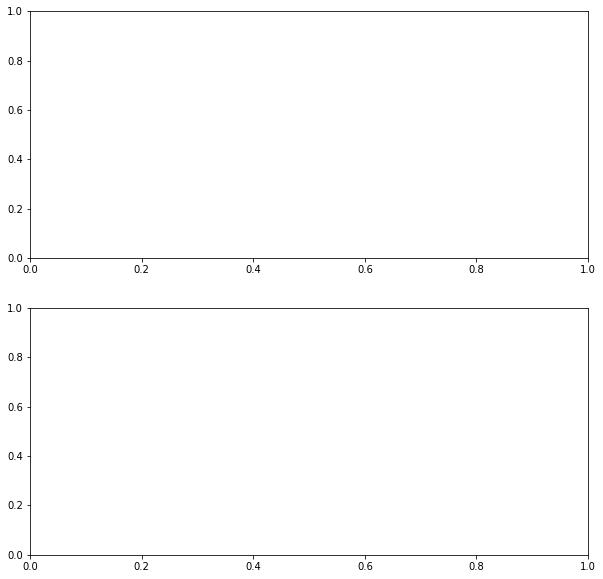

In [24]:
csfont = {'fontname':'Georgia', 'fontsize':15}
fig, (ax1,ax2) = plt.subplots(2,1,figsize = (10,10))

# connect the two graphs
mint = min(Tube_B02['time'][0:20])
maxt = max(Tube_B02['temp'][0:20])
#tempmark = goeth_df[goeth_df['time'].between(mint,maxt)]

# residual graph
ax1.plot(goeth_df['time'], goeth_df['g_B02']-goeth_df['b_B02'], 'k-')
#mark, = ax1.plot(tempmark['time'], tempmark['g_B02']-tempmark['b_B02'], 'r-')
mark = ax1.axvspan(mint,maxt, color = 'blue', alpha = .4)
ax1.set_xlabel('Time (s)', **csfont)
ax1.set_ylabel('Residual Temperature (C)', **csfont)


# animated graph
bsnap, = ax2.plot(Tube_B02['time'][0:20], Tube_B02['temp'][0:20], 'r.', label = 'blank')
gsnap, = ax2.plot(goeth_B02['time'][0:20], goeth_B02['temp'][0:20], 'b^', label = 'goethite')

ax2.set_xlabel('Time (s)', **csfont)
ax2.set_ylabel('Temperature (C)', **csfont)
ax2.legend()

def animate(y):
    #connect the two
    mint = min(Tube_B02['time'][y:y+20])
    maxt = max(Tube_B02['time'][y:y+20])
    #tempmark = goeth_df[goeth_df['time'].between(mint,maxt)]
    
    # replot
    bsnap.set_data(Tube_B02['time'][y:y+20], Tube_B02['temp'][y:y+20])
    gsnap.set_data(goeth_B02['time'][y:y+20], goeth_B02['temp'][y:y+20])
    #mark.set_data(tempmark['time'], tempmark['b_B02'])
    mark.set_xy([(mint,-3), (maxt, -3), (maxt, 5), (mint, 5)])
    ax2.axis([min(Tube_B02['time'][y:y+20]),max(Tube_B02['time'][y:y+20]), min(Tube_B02['temp'][y:y+20]), max(Tube_B02['temp'][y:y+20])])
    return bsnap, gsnap

# create animation using the animate() function
myAnimation = anim.FuncAnimation(fig, animate, frames=np.arange(0,185,2), interval=110, blit=False, repeat=True)


In [ ]:
rc('animation', html='jshtml')
rc

HTML(myAnimation.to_jshtml())

In [ ]:
# save to gif
writer = anim.PillowWriter(fps = 10)
# myAnimation.save('tempcurve_animation.gif', writer= writer)

In [73]:
#dropping last part of heating
vivian_A01.drop([197,198,199,200], inplace = True)

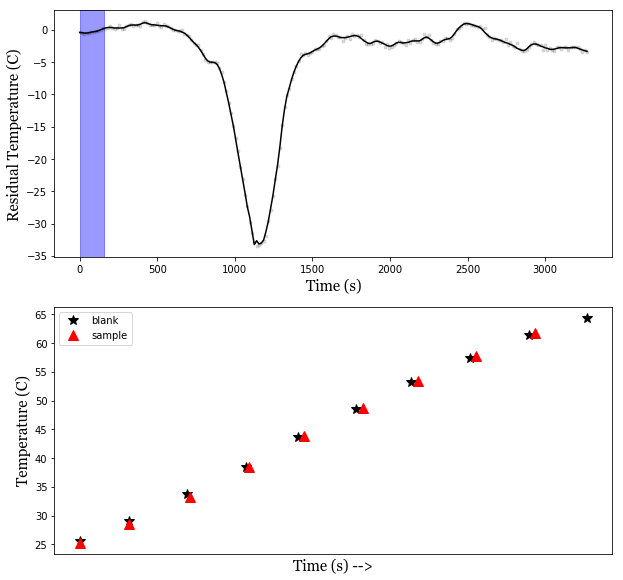

In [125]:
csfont = {'fontname':'Georgia', 'fontsize':15}
fig, (ax1,ax2) = plt.subplots(2,1,figsize = (10,10))

# connect the two graphs
j = 10
mint = min(Tube_D01['time'][0:j])
maxt = max(Tube_D01['time'][0:j])
#tempmark = goeth_df[goeth_df['time'].between(mint,maxt)]

# residual graph
ax1.plot(vivian_det['time'], vivian_det['loess_rv_A01'], 'k-', label = 'vivianite')
ax1.plot(vivian_det['time'], vivian_det['rv_A01'], 'k.', alpha = .125, label = '_nolegend_')
#mark, = ax1.plot(tempmark['time'], tempmark['g_B02']-tempmark['b_B02'], 'r-')
mark = ax1.axvspan(mint,maxt, color = 'blue', alpha = .4)
ax1.set_xlabel('Time (s)', **csfont)
ax1.set_ylabel('Residual Temperature (C)', **csfont)


# animated graph
bsnap, = ax2.plot(Tube_D01['time'][0:j], Tube_D01['temp'][0:j], 'k*', markersize = 10, label = 'blank')
gsnap, = ax2.plot(vivian_A01.loc[(vivian_A01['time'] <= maxt) & (vivian_A01['time'] >= mint), 'time'], vivian_A01.loc[(vivian_A01['time'] <= maxt) & (vivian_A01['time'] >= mint), 'temp'], 'r^', markersize = 10, label = 'sample')

ax2.set_xlabel('Time (s) -->', **csfont)
ax2.set_ylabel('Temperature (C)', **csfont)
ax2.get_xaxis().set_ticks([])
ax2.legend()
plt.show()

def animate(y):
    #connect the two
    j = 10
    mint = min(Tube_D01['time'][y:y+j])
    maxt = max(Tube_D01['time'][y:y+j])
    #tempmark = goeth_df[goeth_df['time'].between(mint,maxt)]
    
    # replot
    bsnap.set_data(Tube_D01['time'][y:y+j], Tube_D01['temp'][y:y+j])
    gsnap.set_data(vivian_A01.loc[(vivian_A01['time'] <= maxt) & (vivian_A01['time'] >= mint), 'time'], vivian_A01.loc[(vivian_A01['time'] <= maxt) & (vivian_A01['time'] >= mint), 'temp'])
    #mark.set_data(tempmark['time'], tempmark['b_B02'])
    mark.set_xy([(mint,-3), (maxt, -3), (maxt, 5), (mint, 5)])
    ax2.axis([min(Tube_D01['time'][y:y+j]),max(Tube_D01['time'][y:y+j]), min(min(Tube_D01['temp'][y:y+j]), min(vivian_A01.loc[(vivian_A01['time'] <= maxt) & (vivian_A01['time'] >= mint), 'temp'])), max(Tube_D01['temp'][y:y+j])])
    return bsnap, gsnap

# create animation using the animate() function
myAnimationViv = anim.FuncAnimation(fig, animate, frames=np.arange(0,185,2), interval=140, blit=False, repeat=True)


In [126]:
rc('animation', html='jshtml')
rc

HTML(myAnimationViv.to_jshtml())

In [127]:
# save to gif
writer = anim.PillowWriter(fps = 10)
#myAnimationViv.save('tempcurve_animation_Viv.gif', writer= writer)

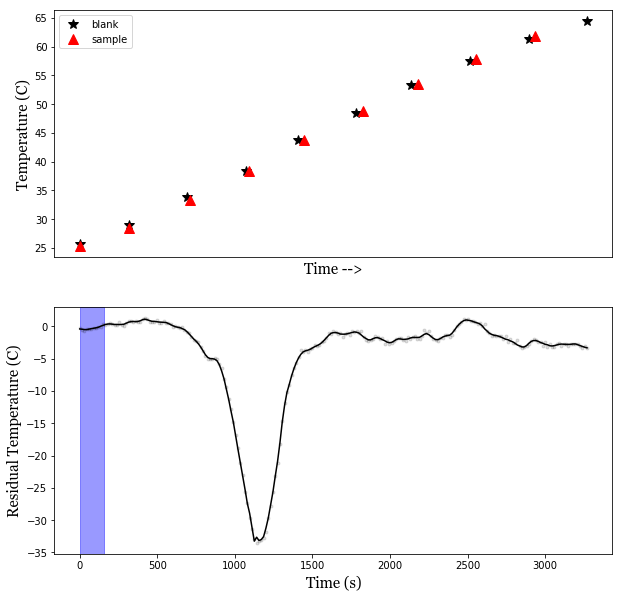

In [134]:
csfont = {'fontname':'Georgia', 'fontsize':15}
fig, (ax1,ax2) = plt.subplots(2,1,figsize = (10,10))

# connect the two graphs
j = 10
mint = min(Tube_D01['time'][0:j])
maxt = max(Tube_D01['time'][0:j])
#tempmark = goeth_df[goeth_df['time'].between(mint,maxt)]

# residual graph
ax2.plot(vivian_det['time'], vivian_det['loess_rv_A01'], 'k-', label = 'vivianite')
ax2.plot(vivian_det['time'], vivian_det['rv_A01'], 'k.', alpha = .125, label = '_nolegend_')
#mark, = ax1.plot(tempmark['time'], tempmark['g_B02']-tempmark['b_B02'], 'r-')
mark = ax2.axvspan(mint,maxt, color = 'blue', alpha = .4)
ax2.set_xlabel('Time (s)', **csfont)
ax2.set_ylabel('Residual Temperature (C)', **csfont)


# animated graph
bsnap, = ax1.plot(Tube_D01['time'][0:j], Tube_D01['temp'][0:j], 'k*', markersize = 10, label = 'blank')
gsnap, = ax1.plot(vivian_A01.loc[(vivian_A01['time'] <= maxt) & (vivian_A01['time'] >= mint), 'time'], vivian_A01.loc[(vivian_A01['time'] <= maxt) & (vivian_A01['time'] >= mint), 'temp'], 'r^', markersize = 10, label = 'sample')

ax1.set_xlabel('Time -->', **csfont)
ax1.set_ylabel('Temperature (C)', **csfont)
ax1.get_xaxis().set_ticks([])
ax1.legend()
plt.show()

def animate(y):
    #connect the two
    j = 10
    mint = min(Tube_D01['time'][y:y+j])
    maxt = max(Tube_D01['time'][y:y+j])
    #tempmark = goeth_df[goeth_df['time'].between(mint,maxt)]
    
    # replot
    bsnap.set_data(Tube_D01['time'][y:y+j], Tube_D01['temp'][y:y+j])
    gsnap.set_data(vivian_A01.loc[(vivian_A01['time'] <= maxt) & (vivian_A01['time'] >= mint), 'time'], vivian_A01.loc[(vivian_A01['time'] <= maxt) & (vivian_A01['time'] >= mint), 'temp'])
    #mark.set_data(tempmark['time'], tempmark['b_B02'])
    mark.set_xy([(mint,-3), (maxt, -3), (maxt, 5), (mint, 5)])
    ax1.axis([min(Tube_D01['time'][y:y+j]),max(Tube_D01['time'][y:y+j]), min(min(Tube_D01['temp'][y:y+j]), min(vivian_A01.loc[(vivian_A01['time'] <= maxt) & (vivian_A01['time'] >= mint), 'temp'])), max(Tube_D01['temp'][y:y+j])])
    return bsnap, gsnap

# create animation using the animate() function
myAnimationViv_flip = anim.FuncAnimation(fig, animate, frames=np.arange(0,185,2), interval=140, blit=False, repeat=True)


In [135]:
rc('animation', html='jshtml')
rc

HTML(myAnimationViv_flip.to_jshtml())

In [136]:
# save to gif
writer = anim.PillowWriter(fps = 10)
# myAnimationViv_flip.save('tempcurve_animation_Viv_flip.gif', writer= writer)

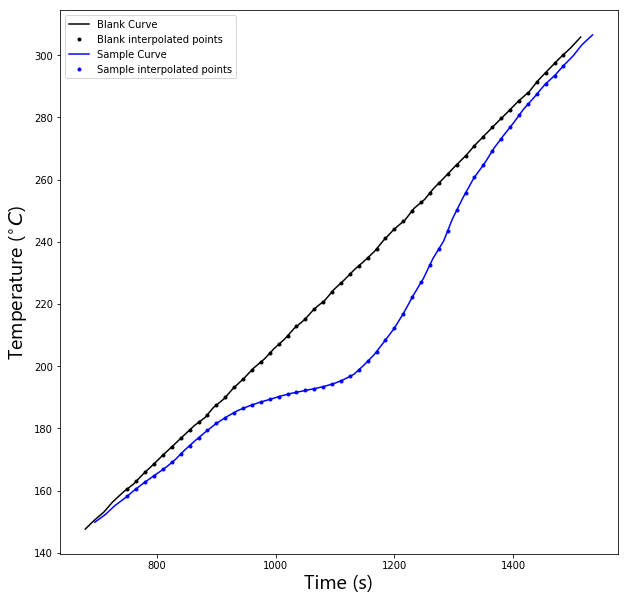

In [25]:
csfont2 = {'fontname':'Microsoft Tai Le', 'fontsize':20}
plt.figure(figsize = (10, 10))

plt.plot(Tube_D01['time'][40:90], Tube_D01['temp'][40:90], 'k-', label = 'Blank Curve')
plt.plot(vivian_det['time'][50:100], vivian_det['b_D01'][50:100], 'k.', label = 'Blank interpolated points')
plt.plot(vivian_A01['time'][40:90], vivian_A01['temp'][40:90], 'b-', label = 'Sample Curve')
plt.plot(vivian_det['time'][50:100], vivian_det['v_A01'][50:100], 'b.', label = 'Sample interpolated points')

plt.xlabel('Time (s)', **csfont2)
plt.ylabel('Temperature ($^{\circ}C$)', **csfont2)
plt.legend()

#plt.savefig('Method_vivian_unlabled')

Text(0.5, 1.0, 'Comparison of all Vivianite')

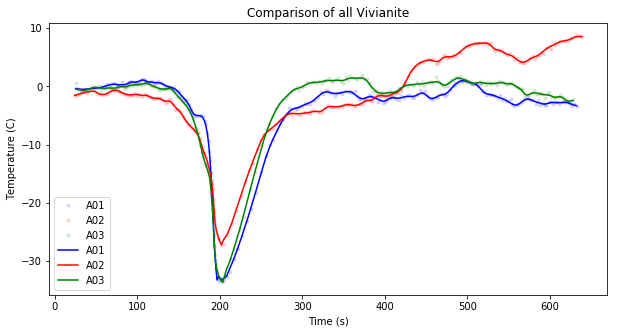

In [26]:
plt.figure(figsize = (10,5))

plt.plot(vivian_det['v_A01'], vivian_det['rv_A01'], 'b.', alpha = .125, label = 'A01')
plt.plot(vivian_det['v_A02'], vivian_det['rv_A02'], 'r.', alpha = .125, label = 'A02')
plt.plot(vivian_det['v_A03'], vivian_det['rv_A03'], 'g.', alpha = .125, label = 'A03')

plt.plot(vivian_det['v_A01'], vivian_det['loess_rv_A01'], 'b-', label = 'A01')
plt.plot(vivian_det['v_A02'], vivian_det['loess_rv_A02'], 'r-', label = 'A02')
plt.plot(vivian_det['v_A03'], vivian_det['loess_rv_A03'], 'g-', label = 'A03')

plt.xlabel('Time (s)')
plt.ylabel('Temperature (C)')
plt.legend()
plt.title('Comparison of all Vivianite')